# HYPOTHESIS 1: Infants are expected to demonstrate varying exploration patterns in response to changes in difficulty
As task complexity increases, they may extend their exploration periods, fixate on images longer and more frequently, and exhibit heightened image-switching behavior

In [98]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, levene, kruskal, sem, f_oneway, linregress, spearmanr
from sklearn.utils import resample
import random 
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import statsmodels.api as sm
import statsmodels.formula.api as smf
#import pymc as pm
#import arviz as az
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
from scipy.special import gamma
from sklearn.preprocessing import MinMaxScaler

In [99]:
#Read the dataset and drop NaN values

data = 'data_thesis.csv'

data = pd.read_csv(data)

data.dropna(inplace=True)
data.drop(data[data['period_in_trial'] == 'feedback'].index, inplace=True)
data.drop(data[data['sideMatch'] == 'timedout'].index, inplace=True)
data.drop(data[data['accuracy'] == 0.5].index, inplace=True)

data['durLookBottom'] = data['LookTotDurInL'] + data['LookTotDurInR'] #New variable: durLookBottom
data['FixNbInBottom'] = data['FixNbInL'] + data['FixNbInR'] #New variable: FixNbInBottom
data['durfixBottom'] = data['FixTotDurInL'] + data['FixTotDurInR'] #New variable: durFixBottom

data

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
3,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
4,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
6,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5862,curE125a,27,Easy,0.0,decision,2,10032,24,0,0,...,O-3-H-1.png,F-2-G-4.png,F-2-G-4.png,left,right,7242.0,12338.0,0,0,0
5871,curE125a,33,Easy,1.0,exploration,2,18792,34,22,9,...,F-3-G-4.png,A-1-I-4.png,F-3-G-4.png,left,left,9560.0,15572.0,12008,31,11146
5872,curE125a,33,Easy,1.0,decision,2,10040,11,0,0,...,F-3-G-4.png,A-1-I-4.png,F-3-G-4.png,left,left,15574.0,19054.0,0,0,0
5877,curE125a,39,Easy,0.0,exploration,2,5248,10,4,3,...,O-3-H-1.png,F-2-G-4.png,O-3-H-1.png,right,left,1276.0,3602.0,3042,7,2826


In [100]:
# Filter out participants that didn't go above easy difficulty level

grouped = data.groupby('session')

filtered_sessions = []
for session, data in grouped:
    if 'Easy' not in data['difficulty'].values or len(data['difficulty'].unique()) > 1:
        filtered_sessions.append(data)

data = pd.concat(filtered_sessions)
data

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
3,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
4,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
6,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5787,curE122a,43,Hard,0.0,exploration,1,20008,20,20,0,...,O-2-J-1.png,O-2-G-4.png,O-2-G-4.png,left,right,4456.0,7984.0,5162,20,3806
5788,curE122a,45,Medium,1.0,exploration,3,3530,2,0,1,...,O-3-B-4.png,O-1-D-2.png,O-3-B-4.png,left,left,1650.0,3980.0,114,1,114
5790,curE122a,46,Medium,0.0,decision,3,1716,5,2,0,...,V-4-G-3.png,V-1-A-4.png,V-1-A-4.png,left,right,20952.0,23084.0,464,2,434
5791,curE122a,48,Medium,0.0,exploration,3,2332,2,1,0,...,V-2-B-3.png,V-3-H-3.png,V-3-H-3.png,left,right,1488.0,17710.0,596,1,596


In [101]:
# Filter out participants that completed 10 or less trials

trial_counts_per_session = data.groupby('session')['trialno'].nunique()

trial_counts_df = trial_counts_per_session.reset_index(name='unique_trial_count')

data = data[data['session'].isin(trial_counts_df[trial_counts_df['unique_trial_count'] > 10]['session'])]

data

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
3,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
4,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
6,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5787,curE122a,43,Hard,0.0,exploration,1,20008,20,20,0,...,O-2-J-1.png,O-2-G-4.png,O-2-G-4.png,left,right,4456.0,7984.0,5162,20,3806
5788,curE122a,45,Medium,1.0,exploration,3,3530,2,0,1,...,O-3-B-4.png,O-1-D-2.png,O-3-B-4.png,left,left,1650.0,3980.0,114,1,114
5790,curE122a,46,Medium,0.0,decision,3,1716,5,2,0,...,V-4-G-3.png,V-1-A-4.png,V-1-A-4.png,left,right,20952.0,23084.0,464,2,434
5791,curE122a,48,Medium,0.0,exploration,3,2332,2,1,0,...,V-2-B-3.png,V-3-H-3.png,V-3-H-3.png,left,right,1488.0,17710.0,596,1,596


In [102]:
# Summary statistics
print(data.describe())

           trialno     accuracy  step_reached  durPeriodTotal        FixNb  \
count  2642.000000  2642.000000   2642.000000     2642.000000  2642.000000   
mean     26.377744     0.523467      2.863361     5094.348221     8.730129   
std      14.203303     0.499544      0.438438     4793.427111     7.691333   
min       7.000000     0.000000      1.000000      550.000000     0.000000   
25%      15.000000     0.000000      3.000000     1982.000000     4.000000   
50%      24.000000     1.000000      3.000000     3098.000000     6.000000   
75%      35.000000     1.000000      3.000000     6581.500000    11.000000   
max      87.000000     1.000000      3.000000    21074.000000    51.000000   

          FixNbInL     FixNbInR     FixNbInT   FixNbNoAOI  FixTotDurInL  ...  \
count  2642.000000  2642.000000  2642.000000  2642.000000   2642.000000  ...   
mean      3.116200     2.857305     2.540121     0.216503   1025.705526  ...   
std       4.924009     4.425375     2.776562     0.544902

In [87]:
# Divide the dataset into decision and exploration rows
decision_data = data[data['period_in_trial'] == 'decision']
exploration_data = data[data['period_in_trial'] == 'exploration']

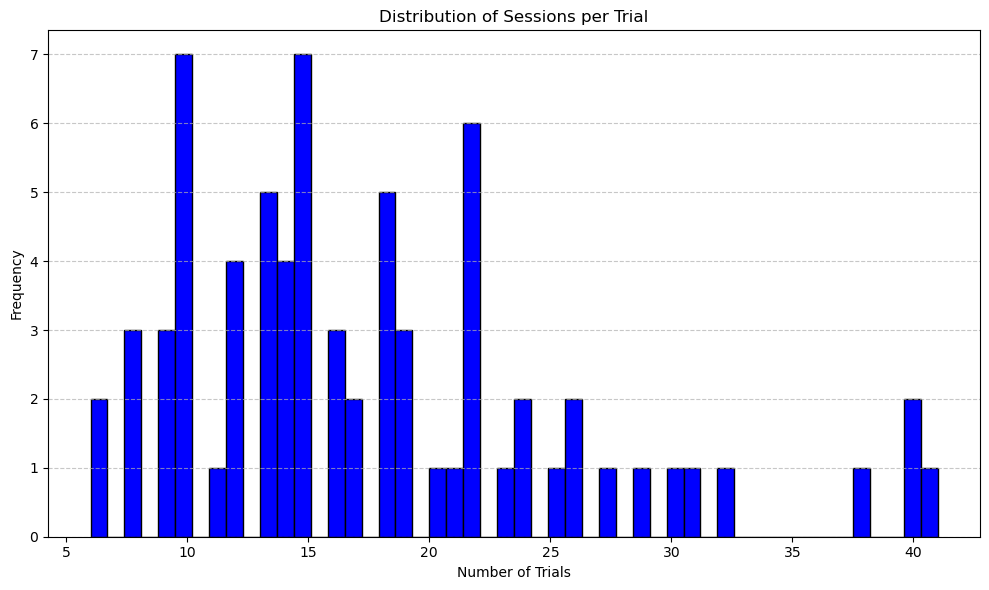

In [88]:
# Distribution of session per trial number
trials_per_session = decision_data.groupby('session')['trialno'].nunique()

# Plot the number of trials per session
plt.figure(figsize=(10, 6))
plt.hist(trials_per_session, bins=50, color='blue', edgecolor='black')
plt.title('Distribution of Sessions per Trial')
plt.xlabel('Number of Trials')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Difficulty counts:
difficulty
Easy      560
Medium    386
Hard      221
xHard     109
Name: count, dtype: int64


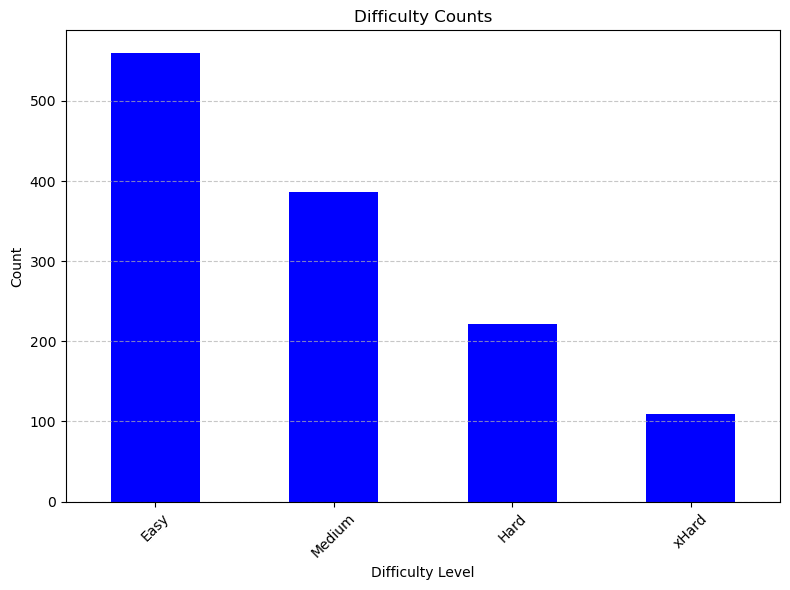

In [89]:
#Count of Difficulty Levels 

difficulty_counts = decision_data['difficulty'].value_counts()

print("Difficulty counts:")
print(difficulty_counts)

plt.figure(figsize=(8, 6))
difficulty_counts.plot(kind='bar', color='blue')
plt.title('Difficulty Counts')
plt.xlabel('Difficulty Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

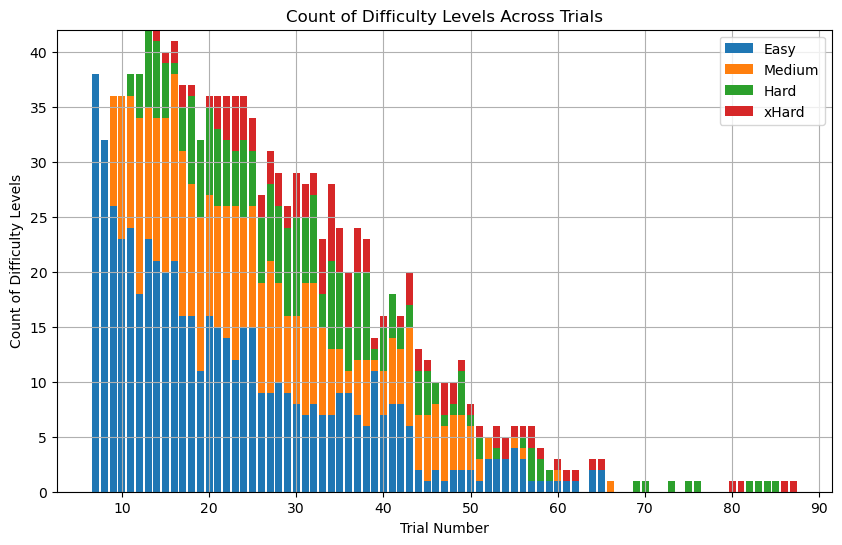

In [90]:
# Difficulty levels count across trials

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']
difficulty_trial_counts = decision_data.groupby(['trialno', 'difficulty']).size().unstack(fill_value=0)
difficulty_trial_counts = difficulty_trial_counts[difficulty_order]

plt.figure(figsize=(10, 6))

bottom = None
for difficulty in difficulty_trial_counts.columns:
    plt.bar(difficulty_trial_counts.index, difficulty_trial_counts[difficulty], label=difficulty, bottom=bottom)
    if bottom is None:
        bottom = difficulty_trial_counts[difficulty].values
    else:
        bottom += difficulty_trial_counts[difficulty].values

plt.xlabel('Trial Number')
plt.ylabel('Count of Difficulty Levels')
plt.title('Count of Difficulty Levels Across Trials')
plt.legend()
plt.grid(True)
plt.show()

# Features + Difficulty Level Analysis

## Accuracy vs. Difficulty Level

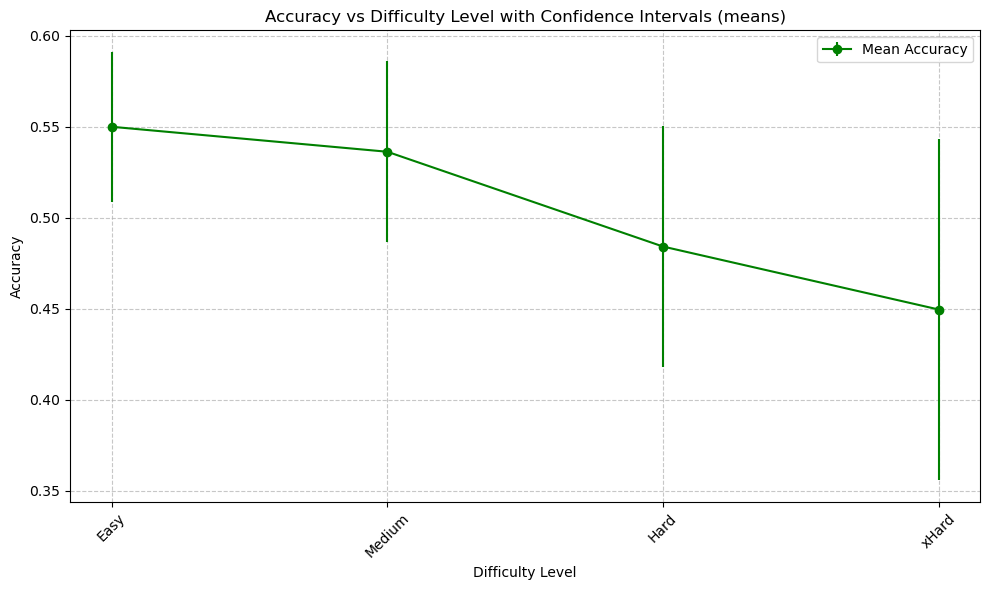

Accuracy means per difficulty level:
difficulty
Easy      0.550000
Medium    0.536269
Hard      0.484163
xHard     0.449541
Name: accuracy, dtype: float64


<Figure size 1000x600 with 0 Axes>

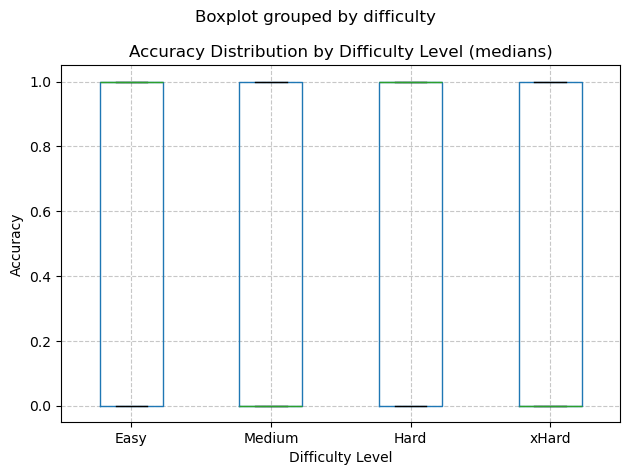


Accuracy medians per difficulty level:
difficulty
Easy      1.0
Medium    1.0
Hard      0.0
xHard     0.0
Name: accuracy, dtype: float64


In [91]:
#Accuracy means by difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

mean_accuracy = decision_data.groupby('difficulty')['accuracy'].mean().loc[difficulty_order]
std_accuracy = decision_data.groupby('difficulty')['accuracy'].std().loc[difficulty_order]
count_accuracy = decision_data.groupby('difficulty')['accuracy'].count().loc[difficulty_order]
conf_interval = 1.96 * std_accuracy / np.sqrt(count_accuracy)

plt.figure(figsize=(10, 6))

plt.errorbar(mean_accuracy.index, mean_accuracy, yerr=conf_interval, fmt='o', linestyle='-', color='green', label='Mean Accuracy')

plt.title('Accuracy vs Difficulty Level with Confidence Intervals (means)')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Accuracy means per difficulty level:")
print(mean_accuracy)

median_accuracy = decision_data.groupby('difficulty')['accuracy'].median().loc[difficulty_order]

plt.figure(figsize=(10, 6))
decision_data.boxplot(column='accuracy', by='difficulty', positions=np.arange(len(difficulty_order)))
plt.title('Accuracy Distribution by Difficulty Level (medians)')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.xticks(np.arange(len(difficulty_order)), difficulty_order)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\nAccuracy medians per difficulty level:")
print(median_accuracy)

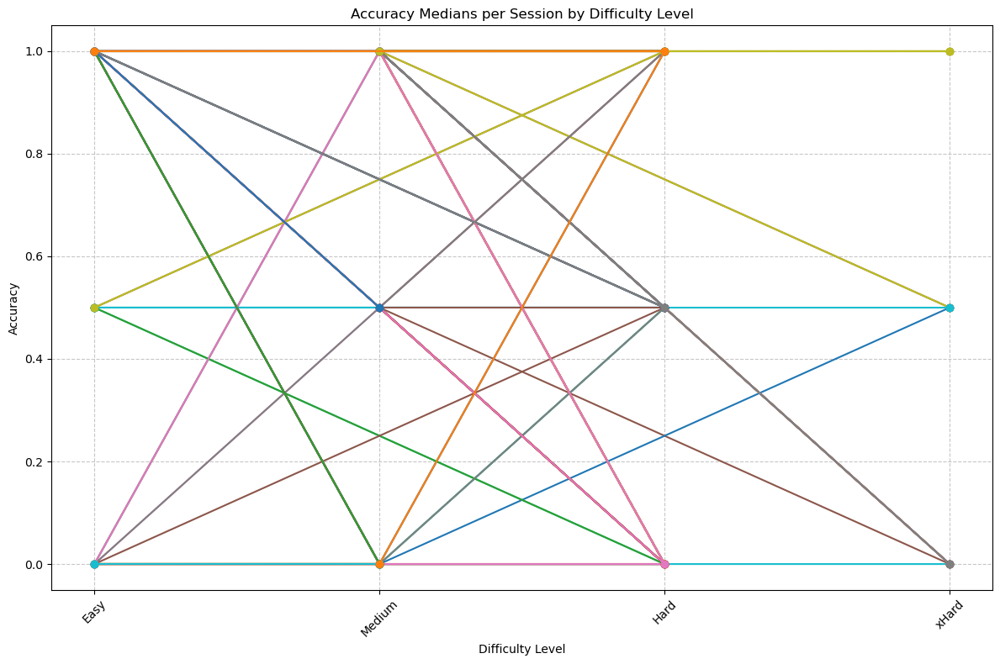

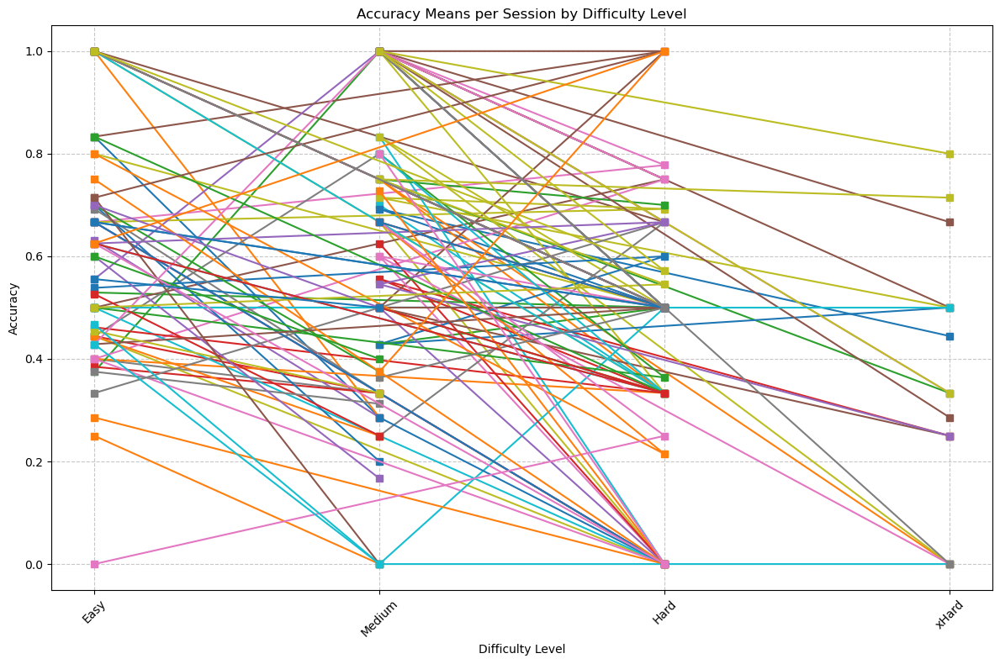

In [92]:
# Accuracy per session by difficulty level

#Medians
session_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))
palette = sns.color_palette('husl', n_colors=len(sessions))

for session in sessions:
    available_difficulty_levels = session_accuracy.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_accuracy_session = session_accuracy.loc[session][available_difficulty_levels]
        plt.plot(median_accuracy_session.index, median_accuracy_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Accuracy Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

# Means
session_mean_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].mean().unstack()

plt.figure(figsize=(12, 8))
palette = sns.color_palette('husl', n_colors=len(sessions))

for session in sessions:
    available_difficulty_levels = session_mean_accuracy.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_accuracy_session = session_mean_accuracy.loc[session][available_difficulty_levels]
        plt.plot(mean_accuracy_session.index, mean_accuracy_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Accuracy Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

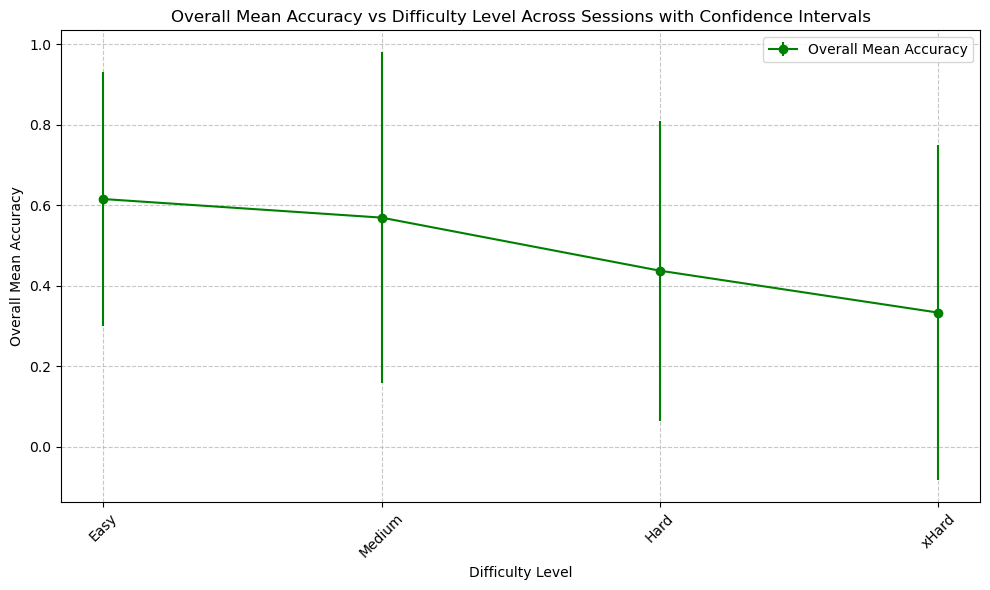

Overall Mean Accuracy per Difficulty Level Across Sessions:
difficulty
Easy      0.615208
Medium    0.569052
Hard      0.437196
xHard     0.333056
dtype: float64


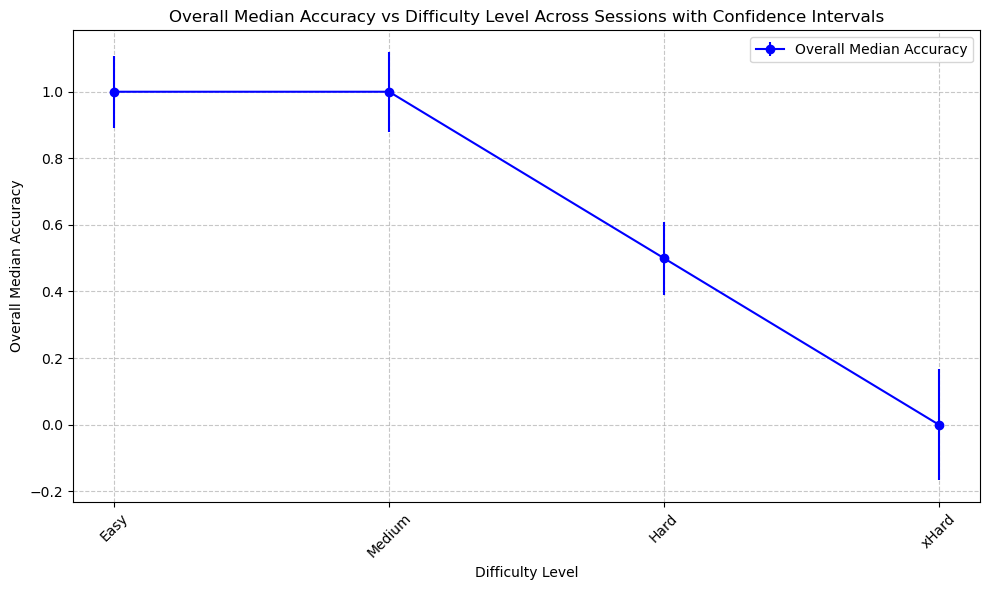


Overall Median Accuracy per Difficulty Level Across Sessions:
difficulty
Easy      1.0
Medium    1.0
Hard      0.5
xHard     0.0
dtype: float64


In [93]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].mean().unstack()
session_median_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].median().unstack()

overall_mean_accuracy = session_mean_accuracy.mean()
overall_median_accuracy = session_median_accuracy.median()

overall_mean_accuracy = overall_mean_accuracy.reindex(difficulty_order)
overall_median_accuracy = overall_median_accuracy.reindex(difficulty_order)

session_std_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].std().unstack()
session_count_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_accuracy.mean() / np.sqrt(session_count_accuracy.mean())

overall_conf_interval_median = 1.96 * session_median_accuracy.std() / np.sqrt(session_median_accuracy.count())

# Mean accuracy across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_accuracy.index, overall_mean_accuracy.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Accuracy')
plt.title('Overall Mean Accuracy vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Accuracy per Difficulty Level Across Sessions:")
print(overall_mean_accuracy)

# Median accuracy across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_accuracy.index, overall_median_accuracy.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Accuracy')
plt.title('Overall Median Accuracy vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Accuracy per Difficulty Level Across Sessions:")
print(overall_median_accuracy)

## Total trial duration vs. Difficulty Level

C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3272573089.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].mean()
C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3272573089.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].median()
C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3272573089.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observ

Total trial duration
Means: 
difficulty
Easy      8616.647577
Medium    8782.012500
Hard      9513.766871
xHard     8106.903226
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean: 
difficulty
Easy      246.971350
Medium    284.499826
Hard      416.462705
xHard     477.873892
Name: durPeriodTotal, dtype: float64


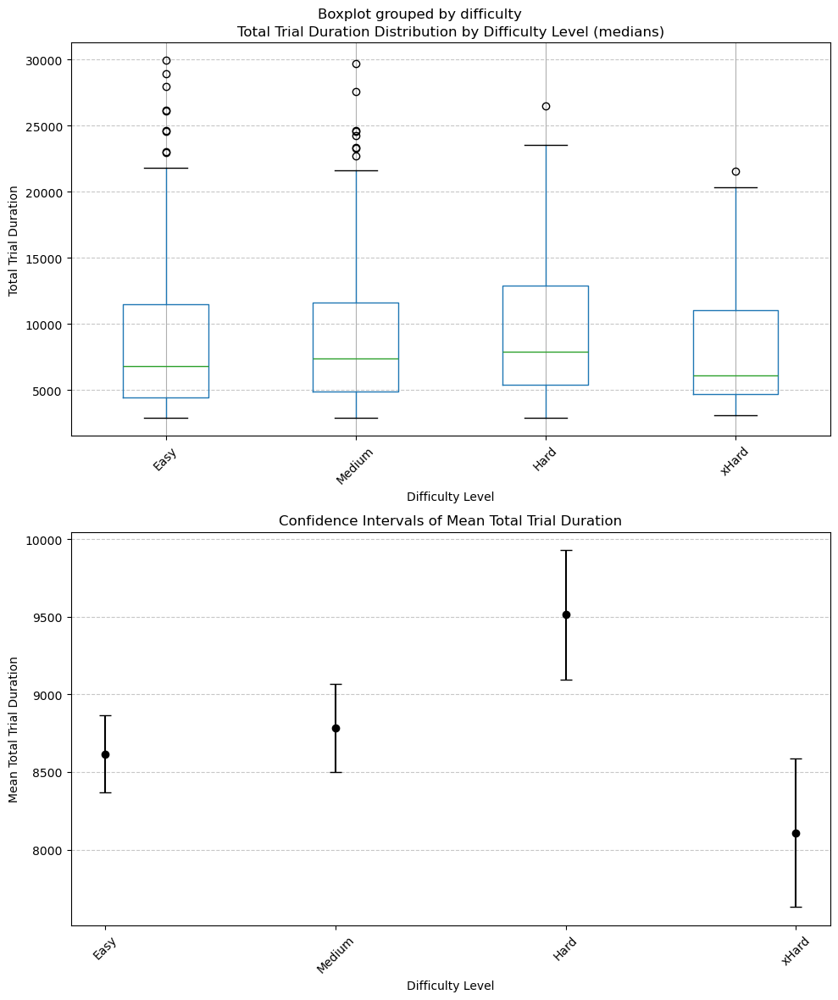

In [10]:
#Total trial duration vs. Difficulty level

trial_duration = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

trial_duration['difficulty'] = pd.Categorical(trial_duration['difficulty'], categories=difficulty_order, ordered=True)

mean_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].mean()
median_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].median()
sem_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].sem()

print("Total trial duration")
print("Means: ")
print(mean_duration_by_difficulty)
print("Standard Errors of the Mean: ")
print(sem_duration_by_difficulty)

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

# Subplot 1: Boxplot of trial duration by difficulty
trial_duration.boxplot(column='durPeriodTotal', by='difficulty', ax=ax1, positions=range(len(difficulty_order)))
ax1.set_title('Total Trial Duration Distribution by Difficulty Level (medians)')
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Trial Duration')
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', rotation=45)

# Subplot 2: Error bar plot of mean trial duration with confidence intervals
ax2.errorbar(mean_duration_by_difficulty.index, mean_duration_by_difficulty, yerr=sem_duration_by_difficulty, fmt='o', color='black', capsize=5)
ax2.set_title('Confidence Intervals of Mean Total Trial Duration')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Trial Duration')
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

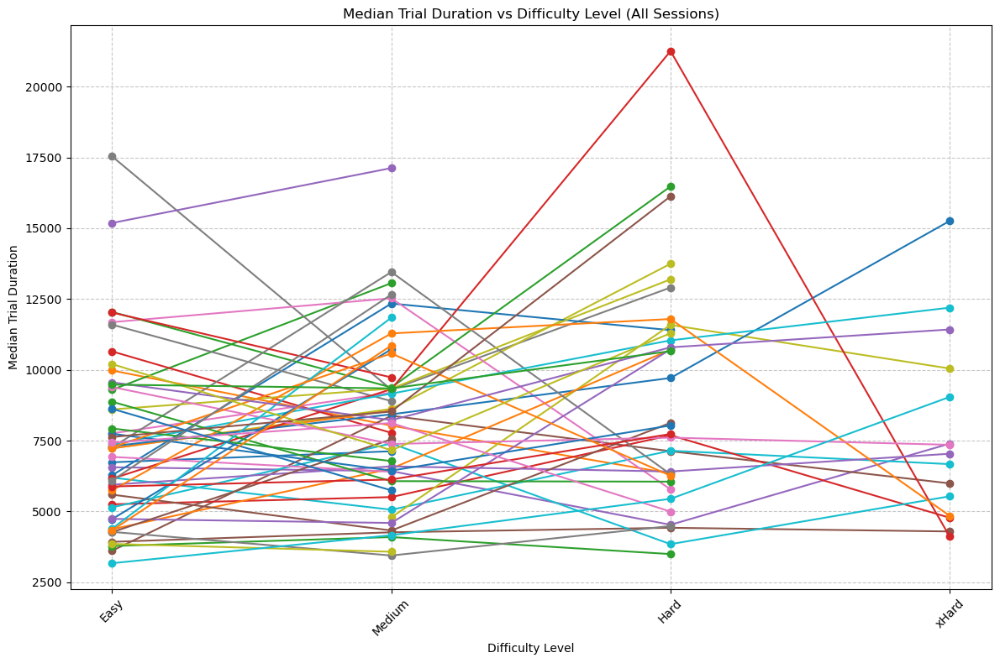

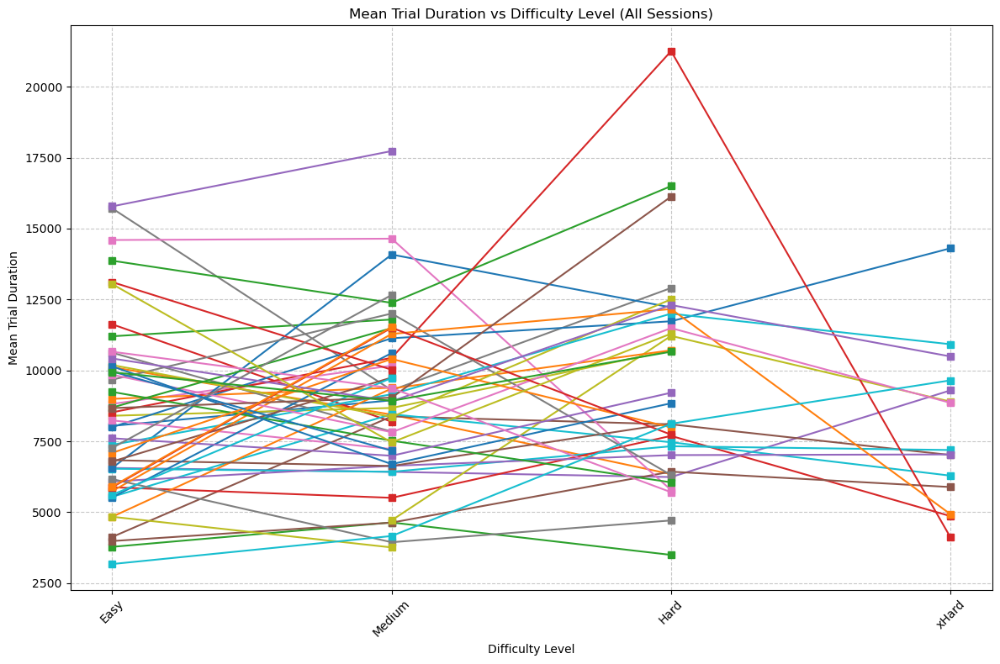

In [11]:
# Median trial duration per session by difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

total_trial_duration_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

plt.figure(figsize=(12, 8))

all_sessions = data['session'].unique()

#Medians
for session_id in all_sessions:
    session_data = total_trial_duration_per_trial[total_trial_duration_per_trial['session'] == session_id]
    median_trial_duration_per_session = session_data.groupby('difficulty')['durPeriodTotal'].median().reindex(difficulty_order) 
    plt.plot(median_trial_duration_per_session.index,  median_trial_duration_per_session, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Trial Duration vs Difficulty Level (All Sessions)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

#Means
plt.figure(figsize=(12, 8))

for session_id in all_sessions:
    session_data = total_trial_duration_per_trial[total_trial_duration_per_trial['session'] == session_id]
    mean_trial_duration_by_session = session_data.groupby('difficulty')['durPeriodTotal'].mean().reindex(difficulty_order)
    plt.plot(mean_trial_duration_by_session.index, mean_trial_duration_by_session, marker='s', linestyle='-', label=f'Session {session_id}')

plt.title('Mean Trial Duration vs Difficulty Level (All Sessions)')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

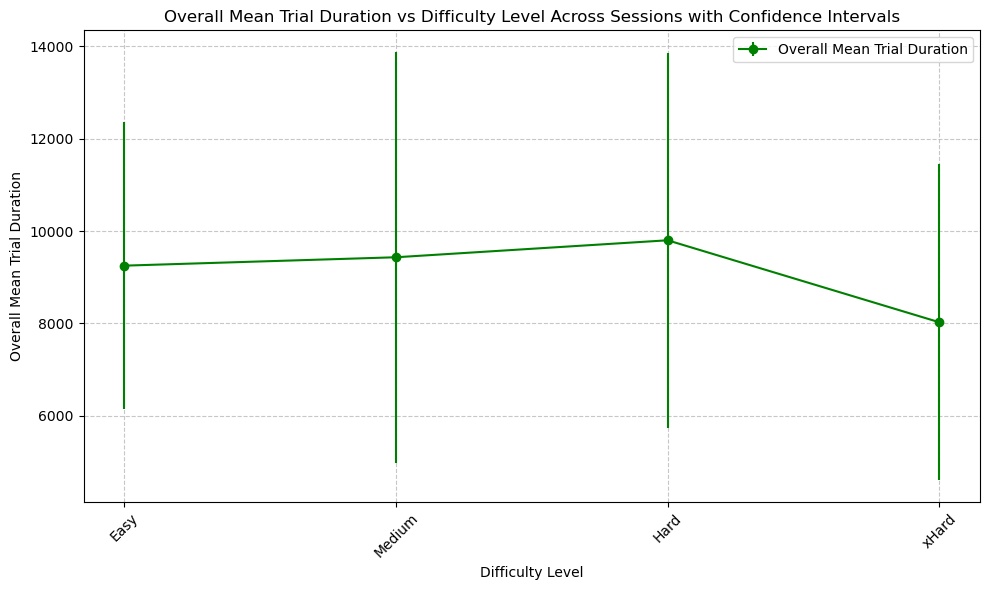

Overall Mean Trial Duration per Difficulty Level Across Sessions:
difficulty
Easy      0.615208
Medium    0.569052
Hard      0.437196
xHard     0.333056
dtype: float64


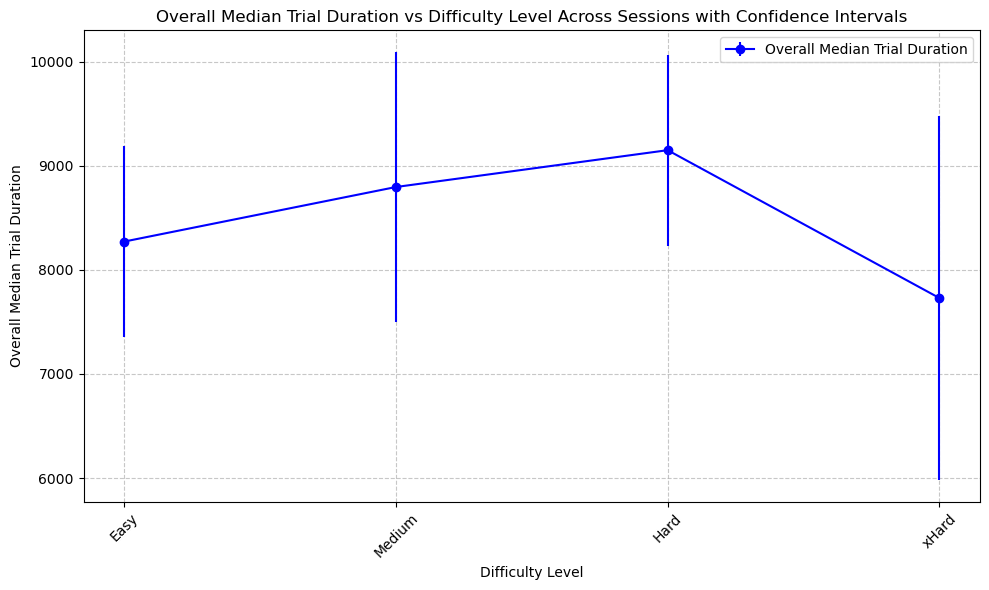


Overall Median Trial Duration per Difficulty Level Across Sessions:
difficulty
Easy      8272.200000
Medium    8796.112676
Hard      9149.808511
xHard     7730.150000
dtype: float64


In [95]:
# Means and medians across sessions (first session by session, then medians/ means of that)

total_trial_duration_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

session_mean_durPeriodTotal = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()
session_median_durPeriodTotal = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

overall_mean_durPeriodTotal = session_mean_durPeriodTotal.mean()
overall_median_durPeriodTotal = session_median_durPeriodTotal.mean()

overall_mean_durPeriodTotal = overall_mean_durPeriodTotal.reindex(difficulty_order)
overall_median_durPeriodTotal = overall_median_durPeriodTotal.reindex(difficulty_order)

session_std_durPeriodTotal = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].std().unstack()
session_count_durPeriodTotal = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_durPeriodTotal.mean() / np.sqrt(session_count_durPeriodTotal.mean())

overall_conf_interval_median = 1.96 * session_median_durPeriodTotal.std() / np.sqrt(session_median_durPeriodTotal.count())

# Mean trial duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_durPeriodTotal.index, overall_mean_durPeriodTotal.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Trial Duration')
plt.title('Overall Mean Trial Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Trial Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Trial Duration per Difficulty Level Across Sessions:")
print(overall_mean_accuracy)

# Median trial duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_durPeriodTotal.index, overall_median_durPeriodTotal.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Trial Duration')
plt.title('Overall Median Trial Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Trial Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Trial Duration per Difficulty Level Across Sessions:")
print(overall_median_durPeriodTotal)

## Duration of exploration and decision periods vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 2.9178972570534126e-24
Shapiro-Wilk test for Hard: p-value = 1.8307181863522247e-11
Shapiro-Wilk test for Medium: p-value = 3.1980767353921416e-18
Shapiro-Wilk test for xHard: p-value = 5.7035672738566524e-11
Levene's test for homogeneity of variances: p-value = 0.23702754540940968
Kruskal-Wallis test:
H-statistic: 8.97766138241408
p-value: 0.029589369742263297
Shapiro-Wilk test for Easy: p-value = 1.8666521094080364e-26
Shapiro-Wilk test for Hard: p-value = 2.931278762358757e-14
Shapiro-Wilk test for Medium: p-value = 1.5061519743592268e-22
Shapiro-Wilk test for xHard: p-value = 2.051996215992408e-11
Levene's test for homogeneity of variances: p-value = 0.9593512046687885
Kruskal-Wallis test:
H-statistic: 5.21361492506657
p-value: 0.15680703147864397
Exploration period duration
Means: 
difficulty
Easy      5742.665198
Hard      6540.969325
Medium    5922.818750
xHard     5242.774194
Name: durPeriodTotal, dtype: float64
Medians: 
difficulty
Easy   

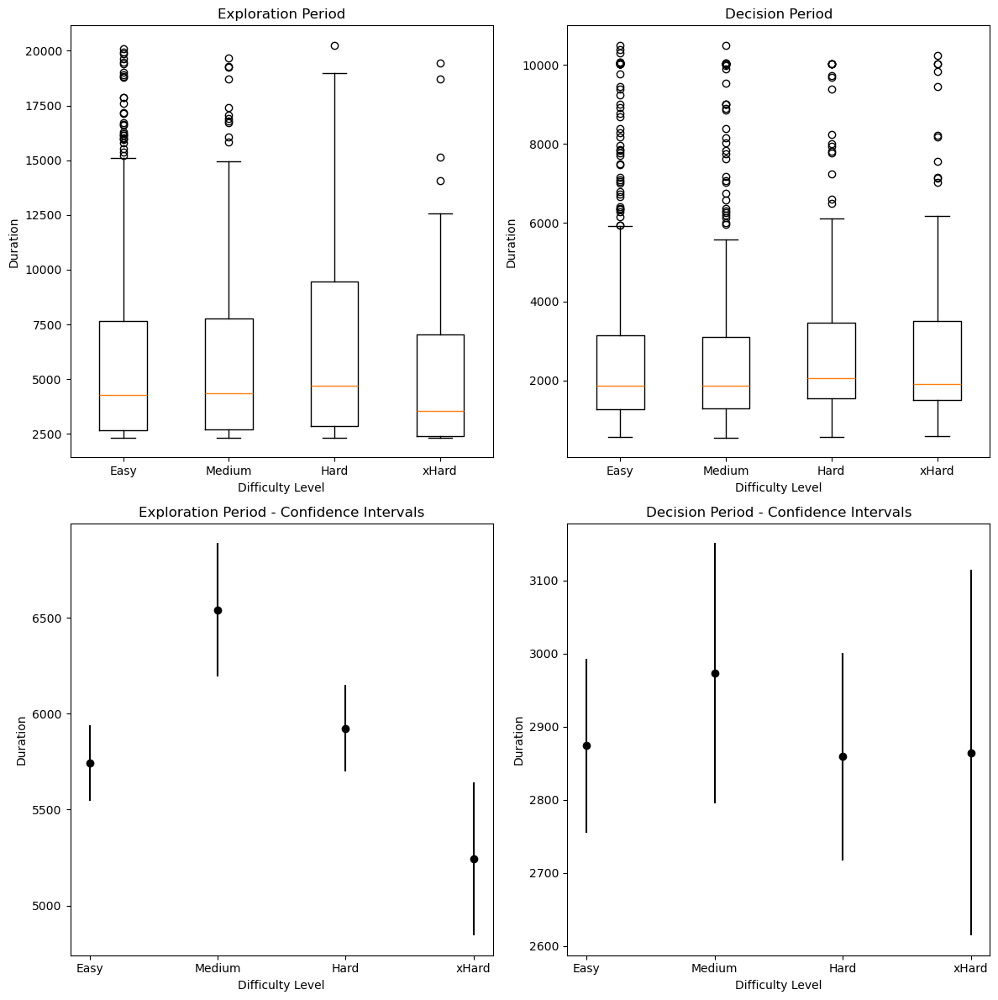

In [65]:
# Duration of both exploration and decision periods vs. difficulty level

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby('difficulty')['durPeriodTotal']
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby('difficulty')['durPeriodTotal']

# Means and standard errors of the mean for exploration and decision periods
exploration_means = exploration_grouped.mean()
exploration_medians = exploration_grouped.median()
exploration_sem = exploration_grouped.sem()
decision_means = decision_grouped.mean()
decision_medians = decision_grouped.median()
decision_sem = decision_grouped.sem()

# Shapiro-Wilk test for normality - Exploration period
for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Exploration period
stat, p = levene(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration period
H, p = kruskal(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision period
for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Decision period
stat, p = levene(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision period
H, p = kruskal(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

print("Exploration period duration")
print("Means: ")
print(exploration_means)
print("Medians: ")
print(exploration_medians)
print("Standard Errors of the Mean: ")
print(exploration_sem)
print("\nDecision period duration")
print("Means: ")
print(decision_means)
print("Standard Errors of the Mean: ")
print(decision_sem)
print("Medians: ")
print(decision_medians)


# Plots
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
exploration_data_reordered = [exploration_grouped.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 0].boxplot(exploration_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Difficulty Level')
axs[0, 0].set_ylabel('Duration')
axs[0, 0].set_xticks(np.arange(len(difficulty_order)))
axs[0, 0].set_xticklabels(difficulty_order)

# Decision Period Boxplot
decision_data_reordered = [decision_grouped.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 1].boxplot(decision_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Difficulty Level')
axs[0, 1].set_ylabel('Duration')
axs[0, 1].set_xticks(np.arange(len(difficulty_order)))
axs[0, 1].set_xticklabels(difficulty_order)

# Exploration Period Error Bars
axs[1, 0].errorbar(np.arange(len(difficulty_order)), exploration_means, yerr=exploration_sem, fmt='o', color='black')
axs[1, 0].set_title('Exploration Period - Confidence Intervals')
axs[1, 0].set_xlabel('Difficulty Level')
axs[1, 0].set_ylabel('Duration')
axs[1, 0].set_xticks(np.arange(len(difficulty_order)))
axs[1, 0].set_xticklabels(difficulty_order)

# Decision Period Error Bars
axs[1, 1].errorbar(np.arange(len(difficulty_order)), decision_means, yerr=decision_sem, fmt='o', color='black')
axs[1, 1].set_title('Decision Period - Confidence Intervals')
axs[1, 1].set_xlabel('Difficulty Level')
axs[1, 1].set_ylabel('Duration')
axs[1, 1].set_xticks(np.arange(len(difficulty_order)))
axs[1, 1].set_xticklabels(difficulty_order)

plt.tight_layout()
plt.show()

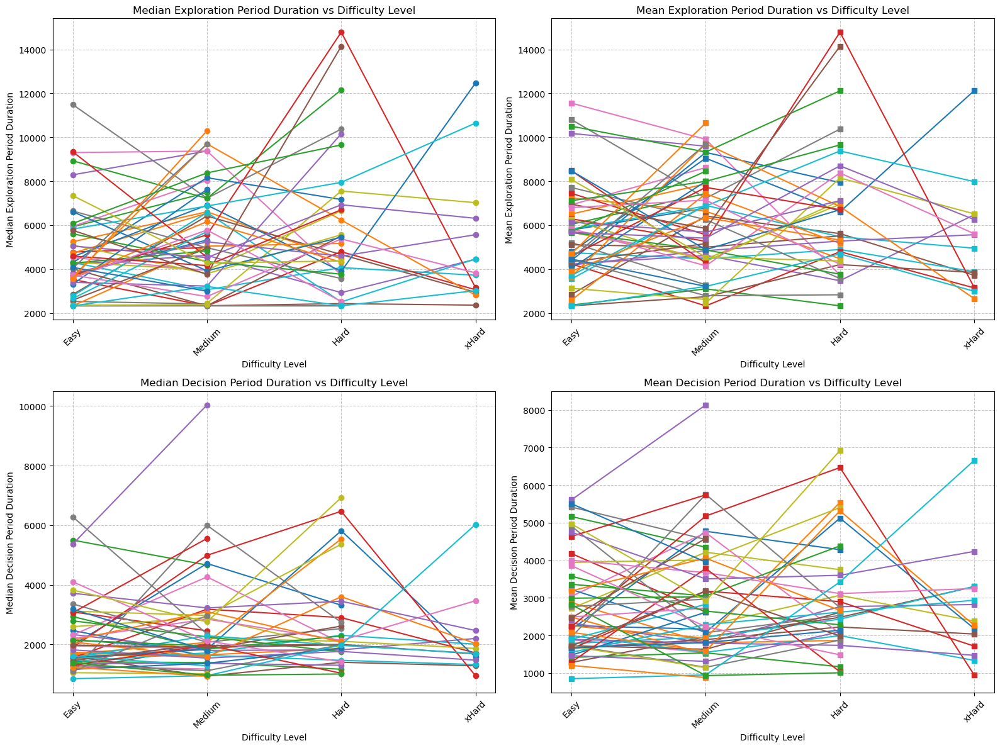

In [14]:
# Duration of both exploration and decision periods vs. difficulty level per session

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

exploration_mean_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()
decision_mean_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()

plt.figure(figsize=(16, 12))

# Median duration for exploration period per session
plt.subplot(2, 2, 1)
for session in exploration_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean duration for exploration period per session
plt.subplot(2, 2, 2)
for session in exploration_mean_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_mean_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_mean_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Median duration for decision period per session
plt.subplot(2, 2, 3)
for session in decision_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = decision_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean duration for decision period per session
plt.subplot(2, 2, 4)
for session in decision_mean_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = decision_mean_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_mean_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

plt.tight_layout()
plt.show()

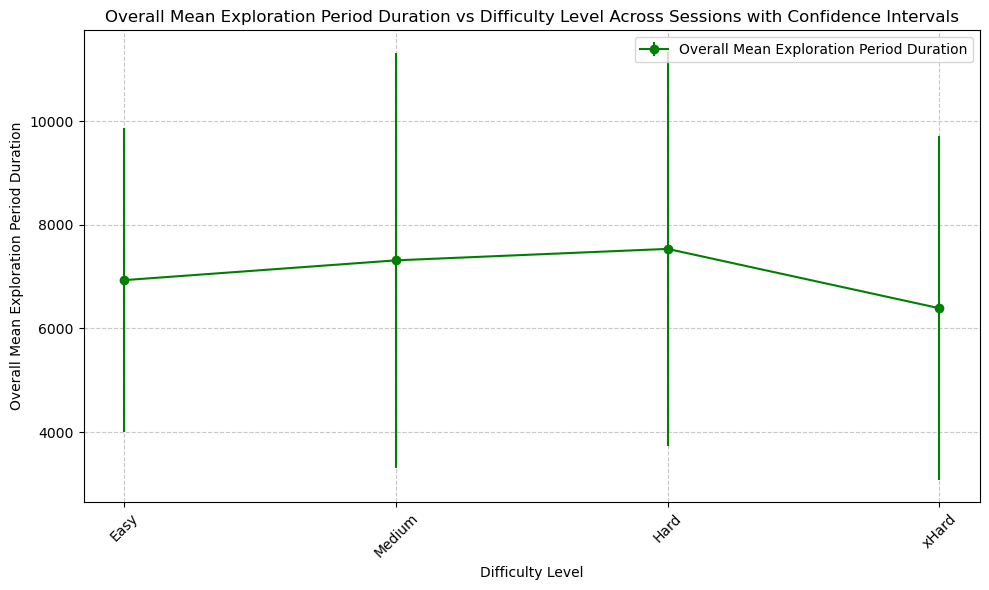

Overall Mean Exploration Period Duration per Difficulty Level Across Sessions:
difficulty
Easy      6933.163633
Medium    7314.804899
Hard      7535.735007
xHard     6391.837490
dtype: float64


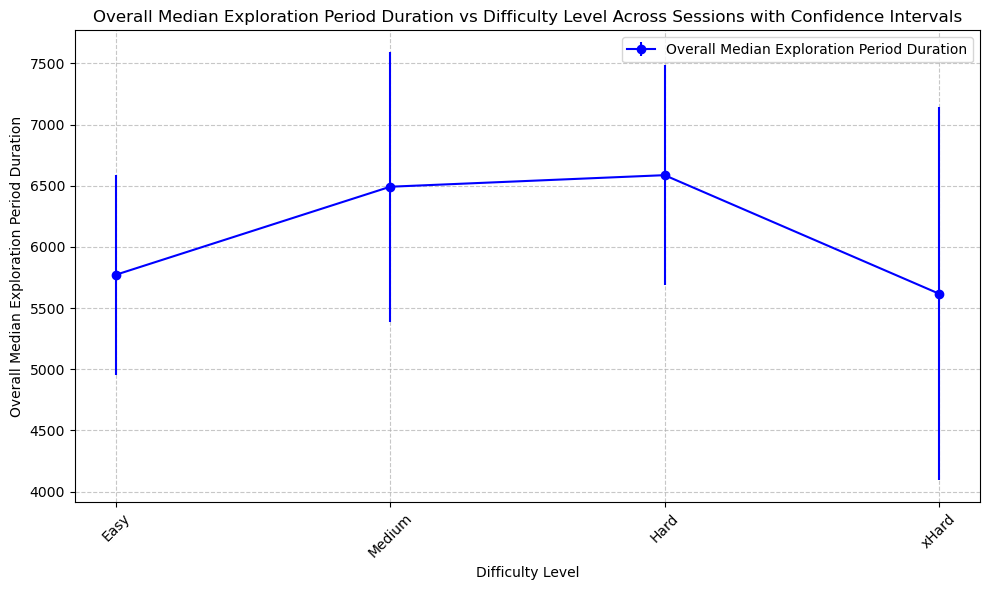


Overall Median Exploration Period Duration per Difficulty Level Across Sessions:
difficulty
Easy      5772.885714
Medium    6492.333333
Hard      6586.872340
xHard     5618.473684
dtype: float64


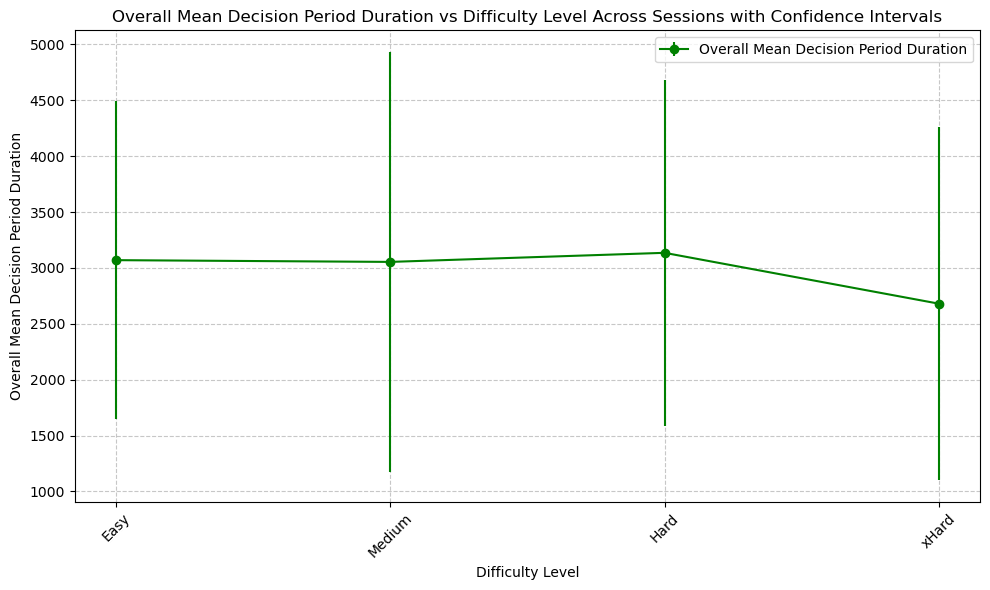

Overall Mean Decision Period Duration per Difficulty Level Across Sessions:
difficulty
Easy      3069.358662
Medium    3053.699556
Hard      3134.962838
xHard     2680.047857
dtype: float64


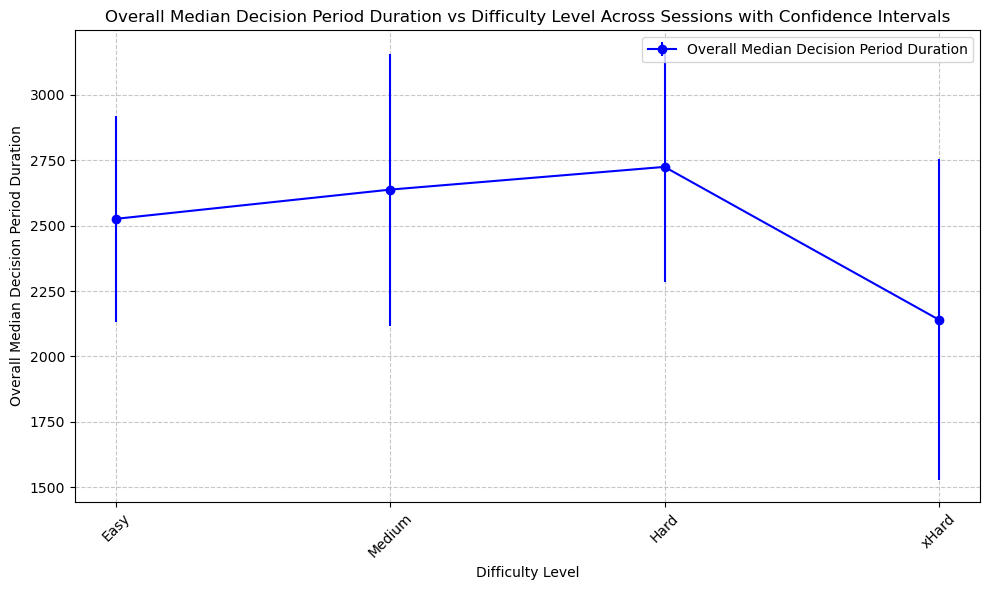


Overall Median Decision Period Duration per Difficulty Level Across Sessions:
difficulty
Easy      2526.115942
Medium    2637.830986
Hard      2724.680851
xHard     2140.600000
dtype: float64


In [16]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_period = exploration_data.groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()
session_median_exp_period = exploration_data.groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

overall_mean_exp_period = session_mean_exp_period.mean()
overall_median_exp_period = session_median_exp_period.mean()

overall_mean_exp_period = overall_mean_exp_period.reindex(difficulty_order)
overall_median_exp_period = overall_median_exp_period.reindex(difficulty_order)

session_std_exp_period = exploration_data.groupby(['session', 'difficulty'])['durPeriodTotal'].std().unstack()
session_count_exp_period = exploration_data.groupby(['session', 'difficulty'])['durPeriodTotal'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_period.mean() / np.sqrt(session_count_exp_period.mean())

overall_conf_interval_median = 1.96 * session_median_exp_period.std() / np.sqrt(session_median_exp_period.count())

# Mean exploration period duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_period.index, overall_mean_exp_period.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Exploration Period Duration')
plt.title('Overall Mean Exploration Period Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Exploration Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Exploration Period Duration per Difficulty Level Across Sessions:")
print(overall_mean_exp_period)

# Median exploration period duration sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_period.index, overall_median_exp_period.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Exploration Period Duration')
plt.title('Overall Median Exploration Period Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Exploration Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Exploration Period Duration per Difficulty Level Across Sessions:")
print(overall_median_exp_period)

session_mean_dec_period = decision_data.groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()
session_median_dec_period = decision_data.groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

overall_mean_dec_period = session_mean_dec_period.mean()
overall_median_dec_period = session_median_dec_period.mean()

overall_mean_dec_period = overall_mean_dec_period.reindex(difficulty_order)
overall_median_dec_period = overall_median_dec_period.reindex(difficulty_order)

session_std_dec_period = decision_data.groupby(['session', 'difficulty'])['durPeriodTotal'].std().unstack()
session_count_dec_period = decision_data.groupby(['session', 'difficulty'])['durPeriodTotal'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_period.mean() / np.sqrt(session_count_dec_period.mean())

overall_conf_interval_median = 1.96 * session_median_dec_period.std() / np.sqrt(session_median_dec_period.count())

# Mean decision period duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_period.index, overall_mean_dec_period.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Decision Period Duration')
plt.title('Overall Mean Decision Period Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Decision Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Decision Period Duration per Difficulty Level Across Sessions:")
print(overall_mean_dec_period)

# Median accuracy decision period duration sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_period.index, overall_median_dec_period.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Decision Period Duration')
plt.title('Overall Median Decision Period Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Decision Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Decision Period Duration per Difficulty Level Across Sessions:")
print(overall_median_dec_period)

## Look duration of bottom images (exploration period) vs. Difficulty Level
How long infants take to look at bottom cards before deiciding to look up and flip the top card for each difficulty level. 

Shapiro-Wilk test for Easy: p-value = 6.115145120810978e-19
Shapiro-Wilk test for Hard: p-value = 2.6859133949119e-11
Shapiro-Wilk test for Medium: p-value = 4.876325208936601e-15
Shapiro-Wilk test for xHard: p-value = 3.60759459119217e-07
Levene's test for homogeneity of variances: p-value = 0.10247845466206298
Kruskal-Wallis test:
H-statistic: 7.948822916796224
p-value: 0.04708130757538422
Mean Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      3264.757709
Hard      3746.404908
Medium    3225.625000
xHard     2629.483871
Name: durLookBottom, dtype: float64
Median Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      2438.0
Hard      2888.0
Medium    2444.0
xHard     2120.0
Name: durLookBottom, dtype: float64
SEM Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      122.832924
Hard      252.918052
Medium    147.748049
xHard     232.108501
Name: durLookBottom, dtype: float64


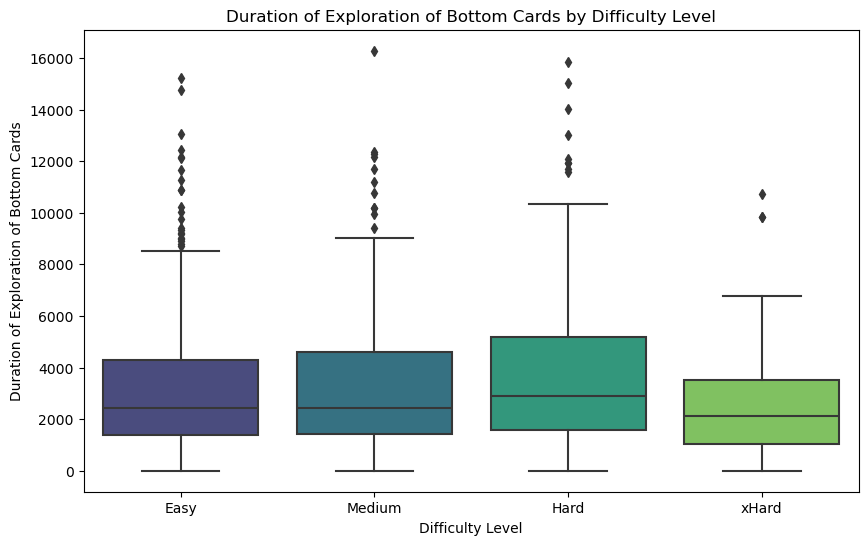

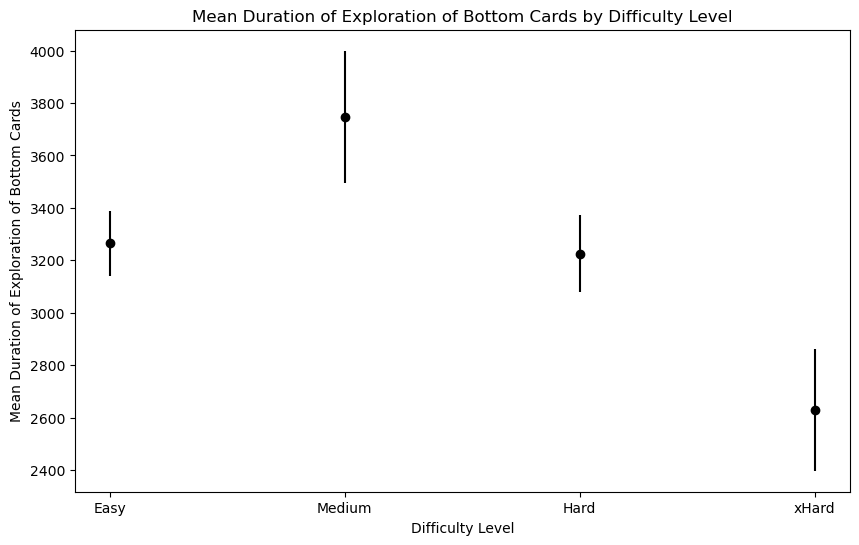

In [66]:
# durLookBottomExploration vs. difficulty
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durLookBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['durLookBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*durLookBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*durLookBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].mean()
median_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].median()
sem_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].sem()

print("Mean Duration of Exploration of bottom cards by Difficulty Level:")
print(mean_gazeduration_by_difficulty)
print("Median Duration of Exploration of bottom cards by Difficulty Level:")
print(median_gazeduration_by_difficulty)
print("SEM Duration of Exploration of bottom cards by Difficulty Level:")
print(sem_gazeduration_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='durLookBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Duration of Exploration of Bottom Cards')
plt.title('Duration of Exploration of Bottom Cards by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_gazeduration_by_difficulty))
plt.errorbar(x_gaze_positions, mean_gazeduration_by_difficulty, yerr=sem_gazeduration_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Duration of Exploration of Bottom Cards')
plt.title('Mean Duration of Exploration of Bottom Cards by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

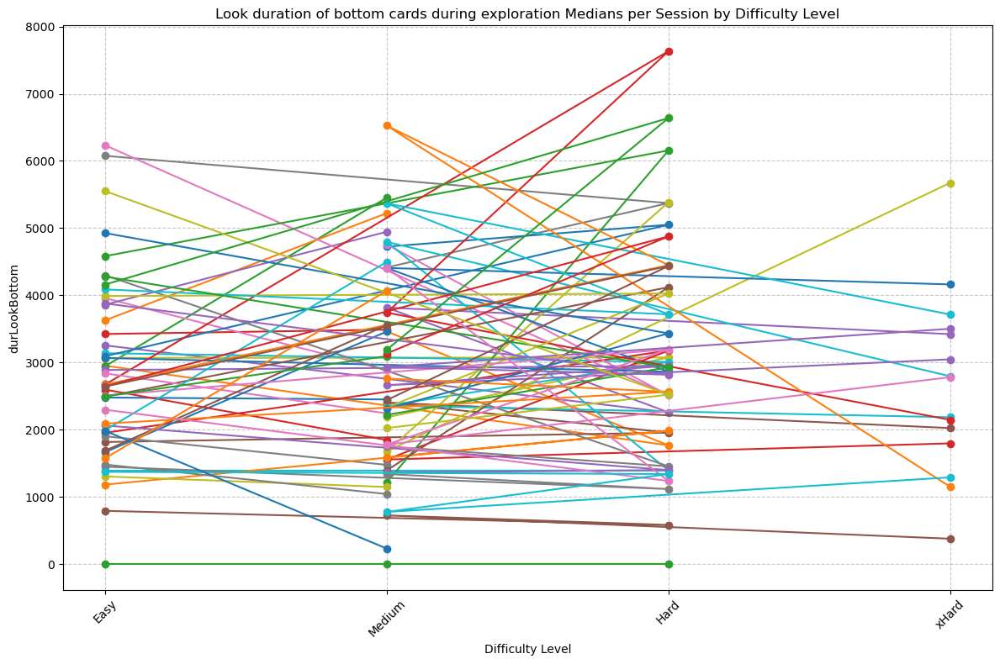

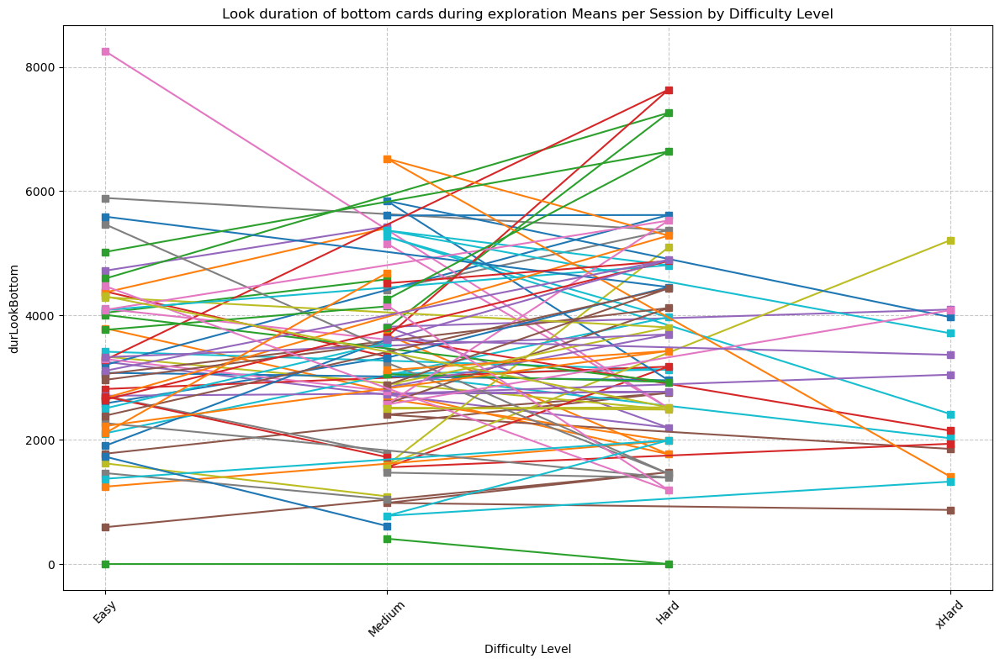

In [17]:
#look duration of bottom cards during exploration per session by difficulty level per session

#Medians
session_look_exploration = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_look_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_durLookBottom_session = session_look_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_durLookBottom_session.index, median_durLookBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_look_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_look_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_durLookBottom_session = session_look_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_durLookBottom_session.index, mean_durLookBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

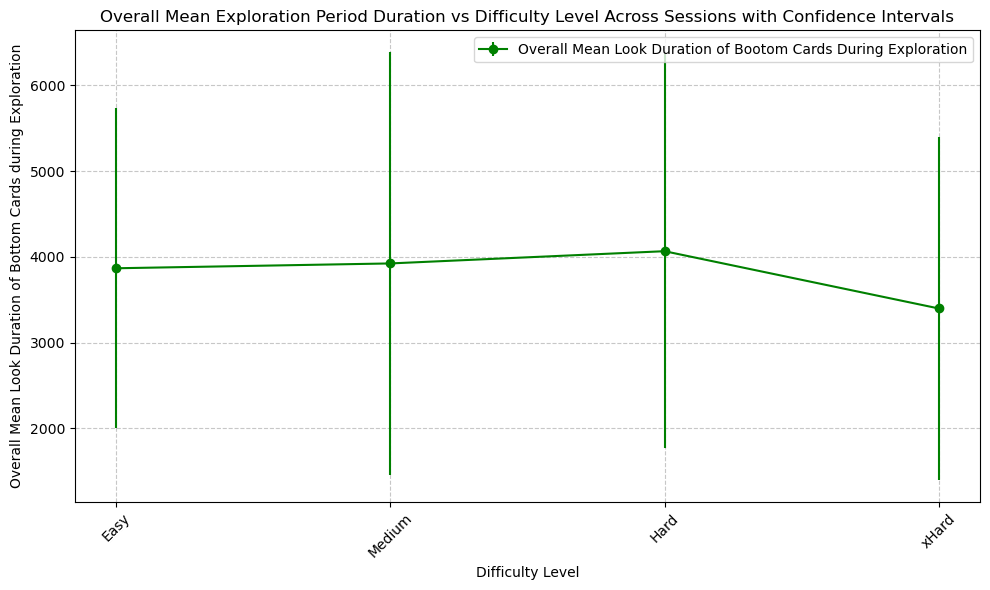

Overall Mean Look Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:
difficulty
Easy      3866.627168
Medium    3922.981939
Hard      4065.713403
xHard     3397.741164
dtype: float64


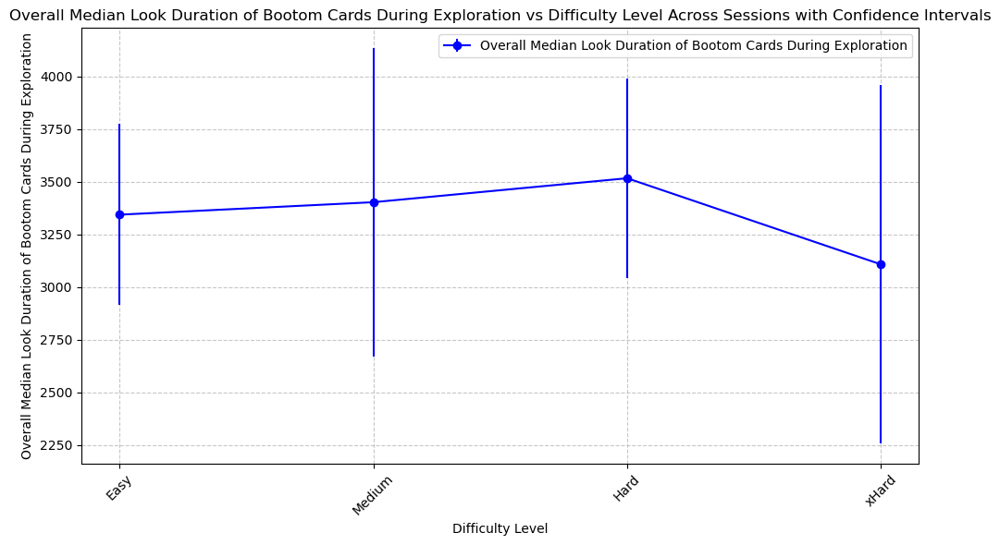


Overall Median Look Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:
difficulty
Easy      3343.542857
Medium    3402.666667
Hard      3516.319149
xHard     3107.631579
dtype: float64


In [18]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_durLookBottom = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()
session_median_exp_durLookBottom = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

overall_mean_exp_durLookBottom = session_mean_exp_durLookBottom.mean()
overall_median_exp_durLookBottom = session_median_exp_durLookBottom.mean()

overall_mean_exp_durLookBottom = overall_mean_exp_durLookBottom.reindex(difficulty_order)
overall_median_exp_durLookBottom = overall_median_exp_durLookBottom.reindex(difficulty_order)

session_std_exp_durLookBottom = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].std().unstack()
session_count_exp_durLookBottom = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_durLookBottom.mean() / np.sqrt(session_count_exp_durLookBottom.mean())

overall_conf_interval_median = 1.96 * session_median_exp_durLookBottom.std() / np.sqrt(session_median_exp_durLookBottom.count())

# Mean exploration look duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_durLookBottom.index, overall_mean_exp_durLookBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Look Duration of Bootom Cards During Exploration')
plt.title('Overall Mean Exploration Period Duration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Look Duration of Bottom Cards during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Look Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:")
print(overall_mean_exp_durLookBottom)

# Median exploration look duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_durLookBottom.index, overall_median_exp_durLookBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Look Duration of Bootom Cards During Exploration')
plt.title('Overall Median Look Duration of Bootom Cards During Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Look Duration of Bootom Cards During Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Look Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:")
print(overall_median_exp_durLookBottom)

## Look duration of bottom images (both periods) vs. Difficulty Level
How long infants take to look at bottom cards for each difficulty level

Shapiro-Wilk test for Easy: p-value = 3.095516838770787e-18
Shapiro-Wilk test for Hard: p-value = 2.7812365750070407e-11
Shapiro-Wilk test for Medium: p-value = 9.77161084510636e-15
Shapiro-Wilk test for xHard: p-value = 1.3344788738562754e-06
Levene's test for homogeneity of variances: p-value = 0.12972286056178614
Kruskal-Wallis test:
H-statistic: 7.334819156090553
p-value: 0.06195805765318944
Mean Look duration of bottom cards by Difficulty Level:
difficulty
Easy      3689.735683
Medium    3644.850000
Hard      4163.914110
xHard     3073.075269
Name: durLookBottom, dtype: float64
Median Look duration of bottom cards by Difficulty Level:
difficulty
Easy      2882.0
Medium    2907.0
Hard      3302.0
xHard     2610.0
Name: durLookBottom, dtype: float64
SEM Look duration of bottom cards by Difficulty Level:
difficulty
Easy      123.442614
Medium    149.246532
Hard      252.174652
xHard     231.165918
Name: durLookBottom, dtype: float64


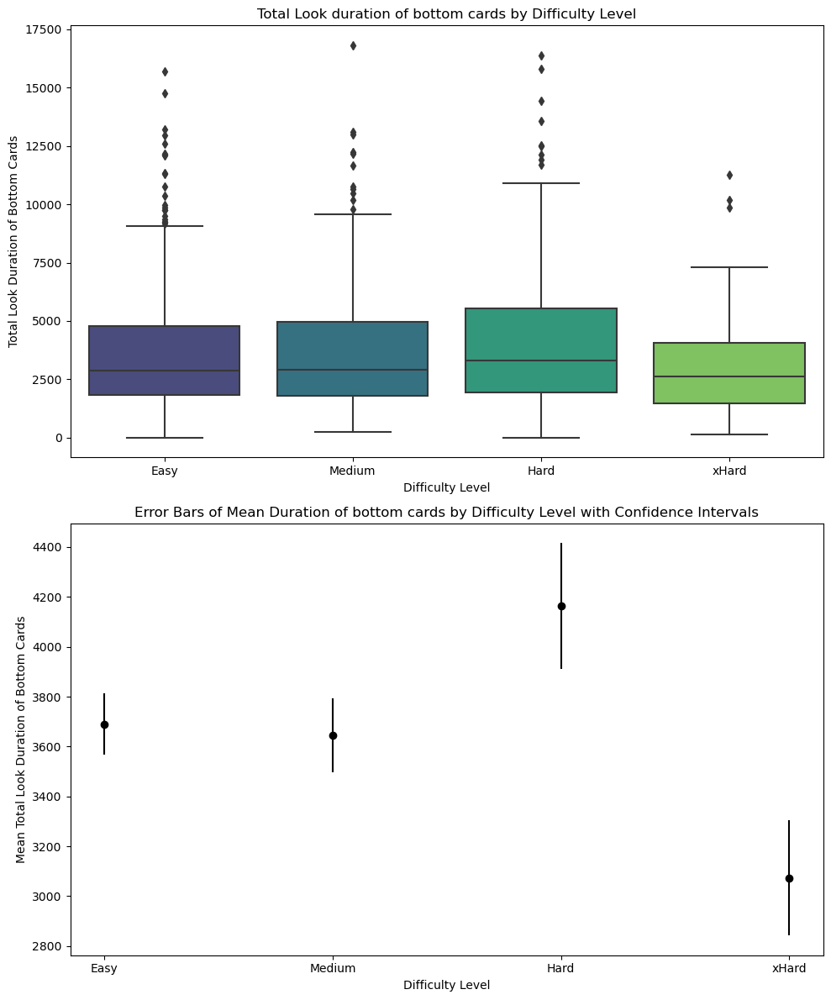

In [75]:
# Look Duration of bottom cards during both periods vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durLookBottom_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['durLookBottom'] for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['durLookBottom'] for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].mean().reindex(difficulty_order)
median_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].median().reindex(difficulty_order)
sem_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].sem().reindex(difficulty_order)
print("Mean Look duration of bottom cards by Difficulty Level:")
print(mean_totalgazeduration_by_difficulty)
print("Median Look duration of bottom cards by Difficulty Level:")
print(median_totalgazeduration_by_difficulty)
print("SEM Look duration of bottom cards by Difficulty Level:")
print(sem_totalgazeduration_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='durLookBottom', data=durLookBottom_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Look Duration of Bottom Cards')
ax1.set_title('Total Look duration of bottom cards by Difficulty Level')

ax2.errorbar(np.arange(len(mean_totalgazeduration_by_difficulty)), mean_totalgazeduration_by_difficulty, yerr=sem_totalgazeduration_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Look Duration of Bottom Cards')
ax2.set_title('Error Bars of Mean Duration of bottom cards by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_totalgazeduration_by_difficulty)))
ax2.set_xticklabels(mean_totalgazeduration_by_difficulty.index)

plt.tight_layout()
plt.show()

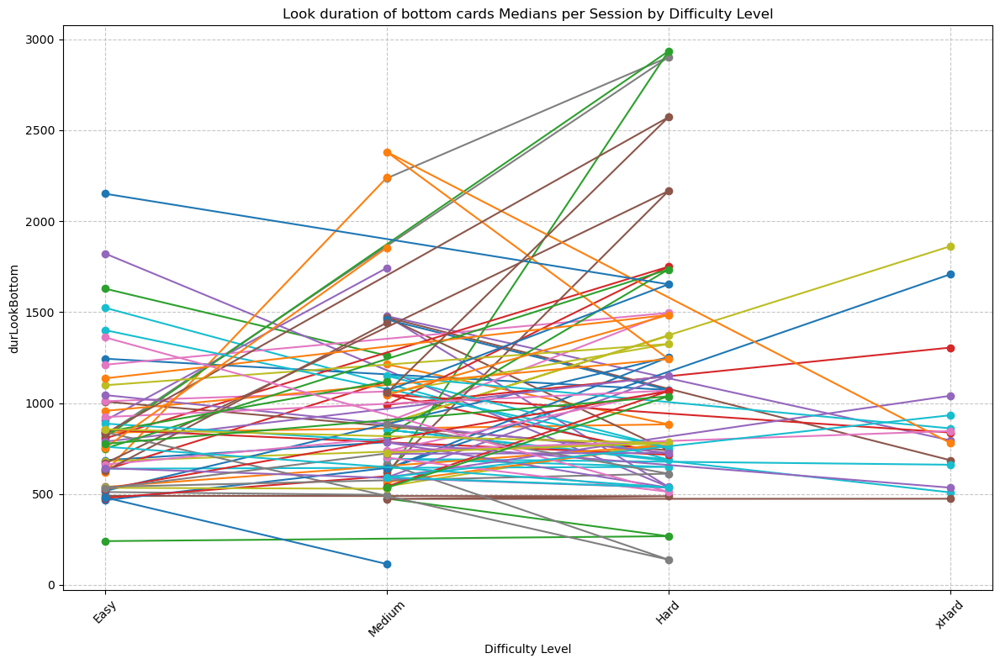

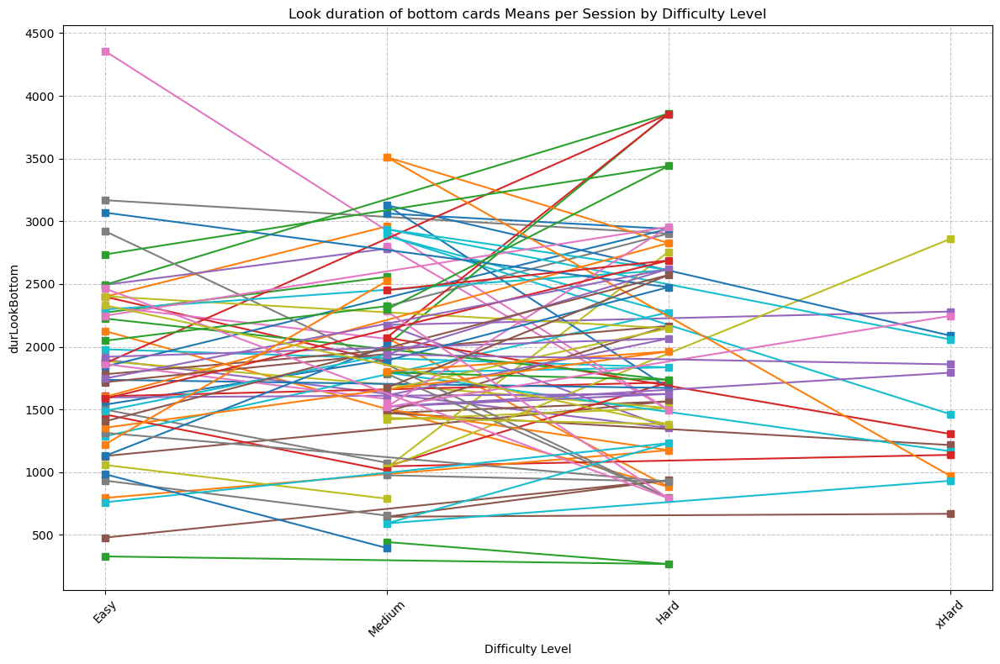

In [20]:
# Look Duration of bottom cards during both periods vs. difficulty level per session

#Medians
session_look_exploration = data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_look_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_durLookBottom_session = session_look_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_durLookBottom_session.index, median_durLookBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of bottom cards Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_look_exploration_mean = data.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_look_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_durLookBottom_session = session_look_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_durLookBottom_session.index, mean_durLookBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of bottom cards Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

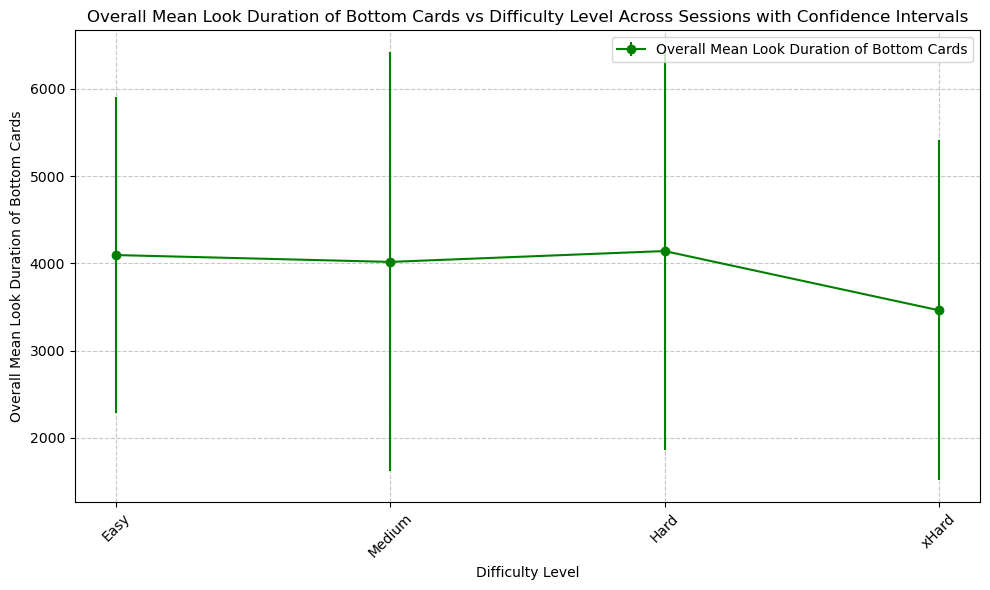

Overall Mean Look Duration of Bottom Cards per Difficulty Level Across Sessions:
difficulty
Easy      4096.000105
Medium    4017.469327
Hard      4141.933677
xHard     3463.115337
dtype: float64


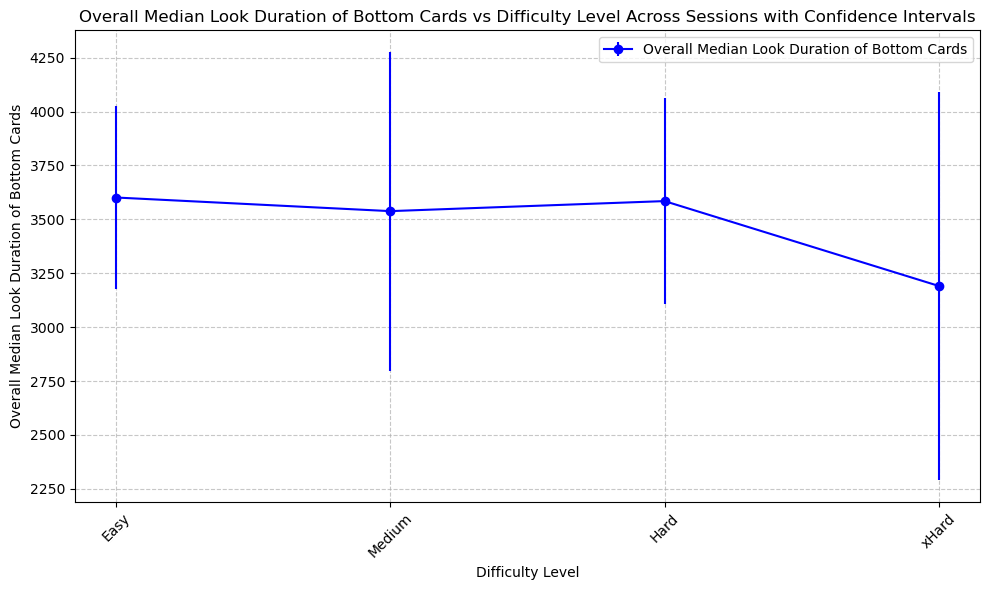


Overall Median Look Duration of Bottom Cards per Difficulty Level Across Sessions:
difficulty
Easy      3601.442857
Medium    3538.239437
Hard      3584.787234
xHard     3191.100000
dtype: float64


In [19]:
# Means and medians across sessions (first session by session, then medians/ means of that)

durLookBottom_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

session_mean_durLookBottom = durLookBottom_per_trial.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()
session_median_durLookBottom = durLookBottom_per_trial.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

overall_mean_durLookBottom = session_mean_durLookBottom.mean()
overall_median_durLookBottom = session_median_durLookBottom.mean()

overall_mean_durLookBottom = overall_mean_durLookBottom.reindex(difficulty_order)
overall_median_durLookBottom = overall_median_durLookBottom.reindex(difficulty_order)

session_std_durLookBottom = durLookBottom_per_trial.groupby(['session', 'difficulty'])['durLookBottom'].std().unstack()
session_count_durLookBottom = durLookBottom_per_trial.groupby(['session', 'difficulty'])['durLookBottom'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_durLookBottom.mean() / np.sqrt(session_count_durLookBottom.mean())

overall_conf_interval_median = 1.96 * session_median_durLookBottom.std() / np.sqrt(session_median_durLookBottom.count())

# Mean durLookBottom across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_durLookBottom.index, overall_mean_durLookBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Look Duration of Bottom Cards')
plt.title('Overall Mean Look Duration of Bottom Cards vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Look Duration of Bottom Cards')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Look Duration of Bottom Cards per Difficulty Level Across Sessions:")
print(overall_mean_durLookBottom)

# Median durLookBottom across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_durLookBottom.index, overall_median_durLookBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Look Duration of Bottom Cards')
plt.title('Overall Median Look Duration of Bottom Cards vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Look Duration of Bottom Cards')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Look Duration of Bottom Cards per Difficulty Level Across Sessions:")
print(overall_median_durLookBottom)

## Look Duration of Top card (decision period) vs. difficulty level

Shapiro-Wilk test for Easy: p-value = 2.49368645546069e-23
Shapiro-Wilk test for Hard: p-value = 6.152749243902437e-11
Shapiro-Wilk test for Medium: p-value = 4.356622668381719e-19
Shapiro-Wilk test for xHard: p-value = 6.241215107518201e-10
Levene's test for homogeneity of variances: p-value = 0.7139761274105348
Kruskal-Wallis test:
H-statistic: 3.2804650901879002
p-value: 0.35037080808973814
Mean LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy      1527.325991
Hard      1601.042945
Medium    1434.368750
xHard     1418.430108
Name: LookTotDurInT, dtype: float64
Median LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy      1035.0
Hard      1200.0
Medium    1072.0
xHard     1104.0
Name: LookTotDurInT, dtype: float64
SEM LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy       69.578898
Hard      108.887590
Medium     76.458334
xHard     138.334918
Name: LookTotDurInT, dtype: float64


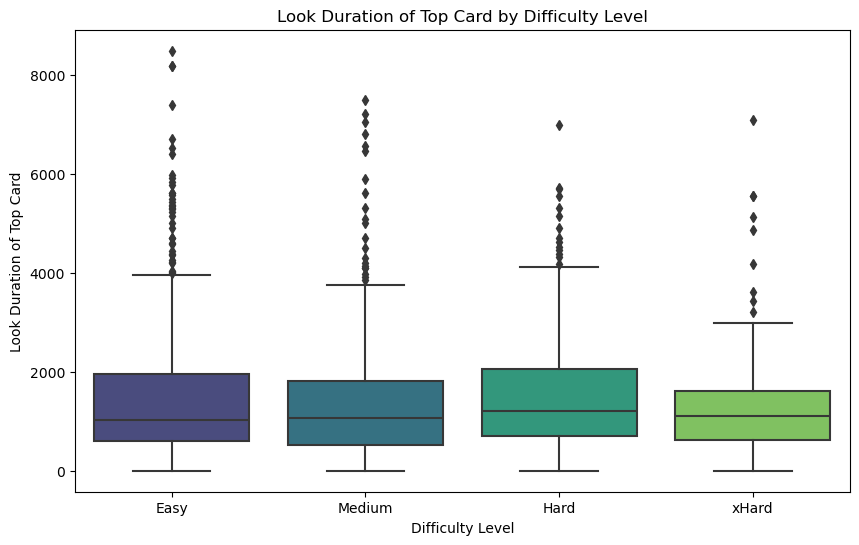

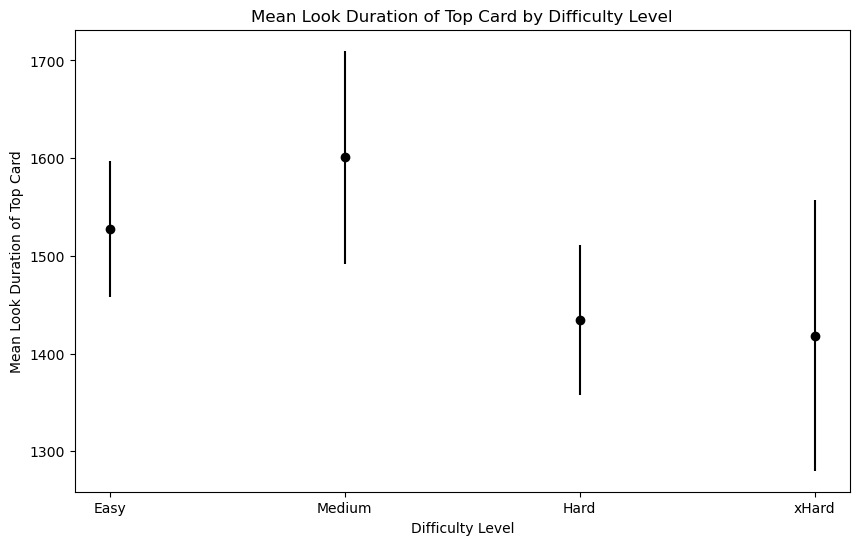

In [67]:
# Look duration of top card (decision period) vs. difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

LookTotDurInT_by_difficulty = [decision_data[decision_data['difficulty'] == level]['LookTotDurInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['LookTotDurInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*LookTotDurInT_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*LookTotDurInT_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].mean()
median_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].median()
sem_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].sem()

print("Mean LookTotDurInT (decision) by Difficulty Level:")
print(mean_LookTotDurInT_by_difficulty)
print("Median LookTotDurInT (decision) by Difficulty Level:")
print(median_LookTotDurInT_by_difficulty)
print("SEM LookTotDurInT (decision) by Difficulty Level:")
print(sem_LookTotDurInT_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='LookTotDurInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Look Duration of Top Card')
plt.title('Look Duration of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_LookTotDurInT_by_difficulty))
plt.errorbar(x_gaze_positions, mean_LookTotDurInT_by_difficulty, yerr=sem_LookTotDurInT_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Look Duration of Top Card')
plt.title('Mean Look Duration of Top Card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

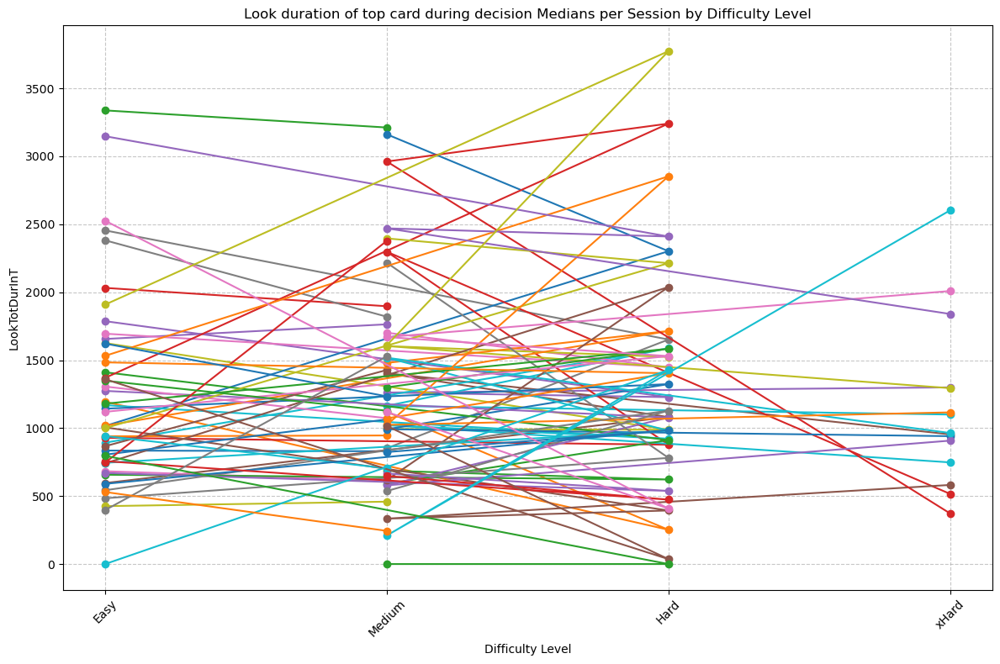

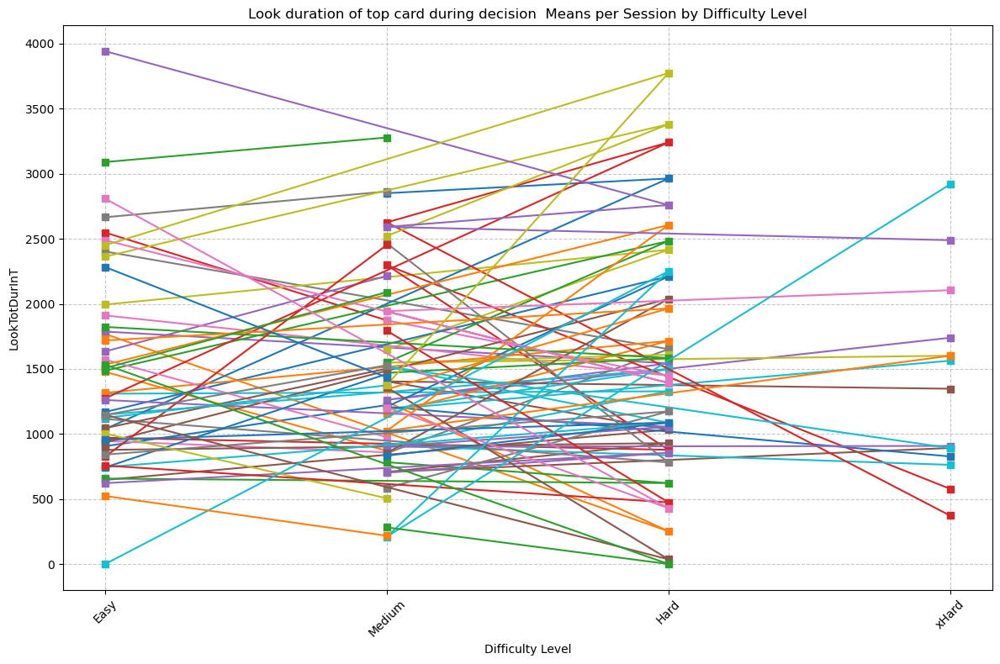

In [22]:
# Look duration of top card (decision period) vs. difficulty levels per session

#Medians
session_durlookT_decision = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_durlookT_decision.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_durlookT_session = session_durlookT_decision.loc[session][available_difficulty_levels]
        plt.plot(median_durlookT_session.index,median_durlookT_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of top card during decision Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('LookTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_durlookT_decision_mean = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_durlookT_decision_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_durlookT_session = session_durlookT_decision_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_durlookT_session.index, mean_durlookT_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of top card during decision  Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('LookTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

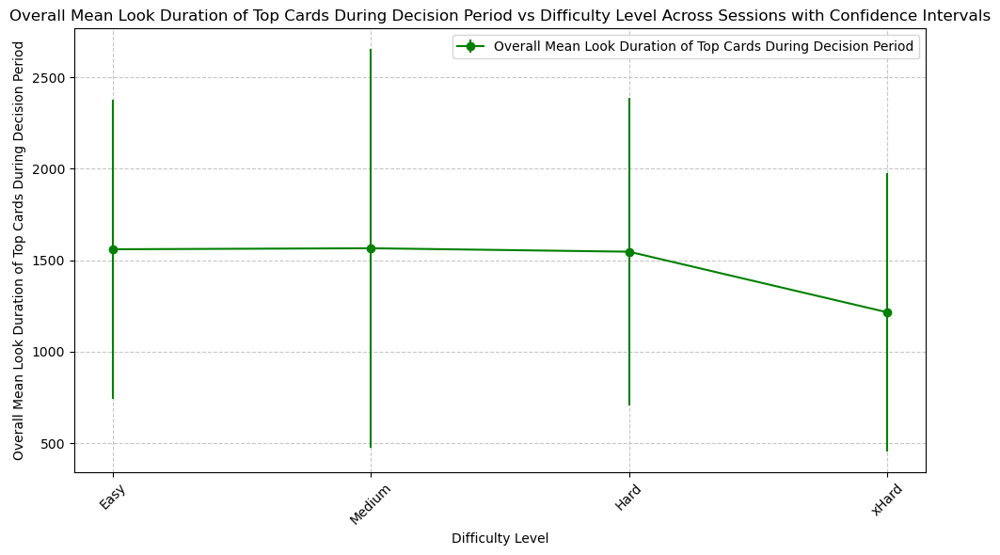

Overall Mean Look Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      1560.146176
Medium    1565.720181
Hard      1546.737434
xHard     1215.852460
dtype: float64


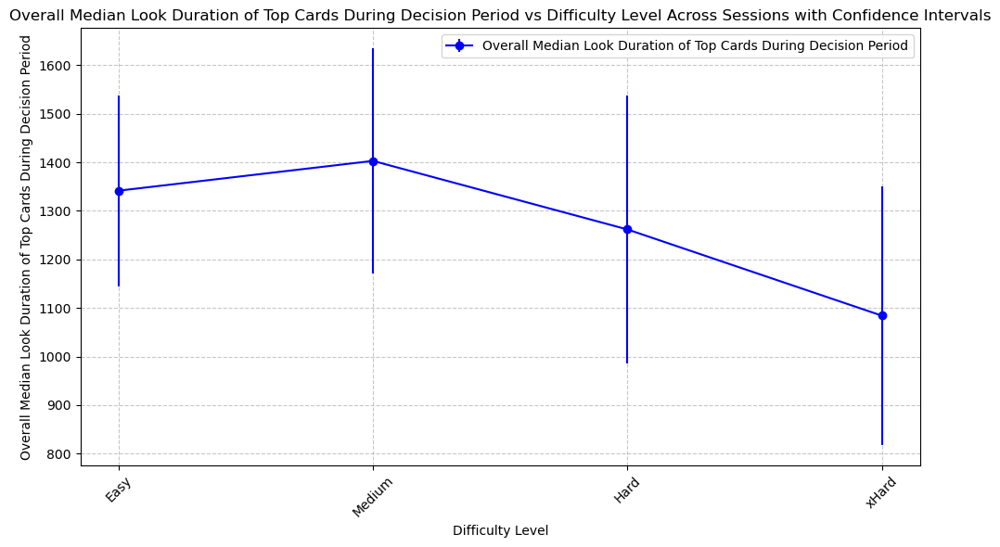


Overall Median Look Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      1341.492754
Medium    1402.788732
Hard      1261.659574
xHard     1084.150000
dtype: float64


In [20]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_dec_LookTotDurInT = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].mean().unstack()
session_median_dec_LookTotDurInT = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].median().unstack()

overall_mean_dec_LookTotDurInT = session_mean_dec_LookTotDurInT.mean()
overall_median_dec_LookTotDurInT = session_median_dec_LookTotDurInT.mean()

overall_mean_dec_LookTotDurInT = overall_mean_dec_LookTotDurInT.reindex(difficulty_order)
overall_median_dec_LookTotDurInT = overall_median_dec_LookTotDurInT.reindex(difficulty_order)

session_std_dec_LookTotDurInT = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].std().unstack()
session_count_dec_LookTotDurInT = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_LookTotDurInT.mean() / np.sqrt(session_count_dec_LookTotDurInT.mean())

overall_conf_interval_median = 1.96 * session_median_dec_LookTotDurInT.std() / np.sqrt(session_median_dec_LookTotDurInT.count())

# Mean LookTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_LookTotDurInT.index, overall_mean_dec_LookTotDurInT.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Look Duration of Top Cards During Decision Period')
plt.title('Overall Mean Look Duration of Top Cards During Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Look Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Look Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:")
print(overall_mean_dec_LookTotDurInT)

# Median LookTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_LookTotDurInT.index, overall_median_dec_LookTotDurInT.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Look Duration of Top Cards During Decision Period')
plt.title('Overall Median Look Duration of Top Cards During Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Look Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Look Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:")
print(overall_median_dec_LookTotDurInT)

## Number of fixations of bottom cards during exploration vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 1.7131809466218468e-19
Shapiro-Wilk test for Hard: p-value = 3.044833000184286e-09
Shapiro-Wilk test for Medium: p-value = 1.4994592983143136e-16
Shapiro-Wilk test for xHard: p-value = 1.4817875354392723e-06
Levene's test for homogeneity of variances: p-value = 0.22565246075484177
Kruskal-Wallis test:
H-statistic: 8.871453629556337
p-value: 0.031049715002661453
Mean FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy       8.680617
Hard      10.067485
Medium     8.878125
xHard      7.419355
Name: FixNbInBottom, dtype: float64
Median FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy      7.0
Hard      8.0
Medium    7.0
xHard     6.0
Name: FixNbInBottom, dtype: float64
SEM FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy      0.314906
Hard      0.611444
Medium    0.407563
xHard     0.627841
Name: FixNbInBottom, dtype: float64


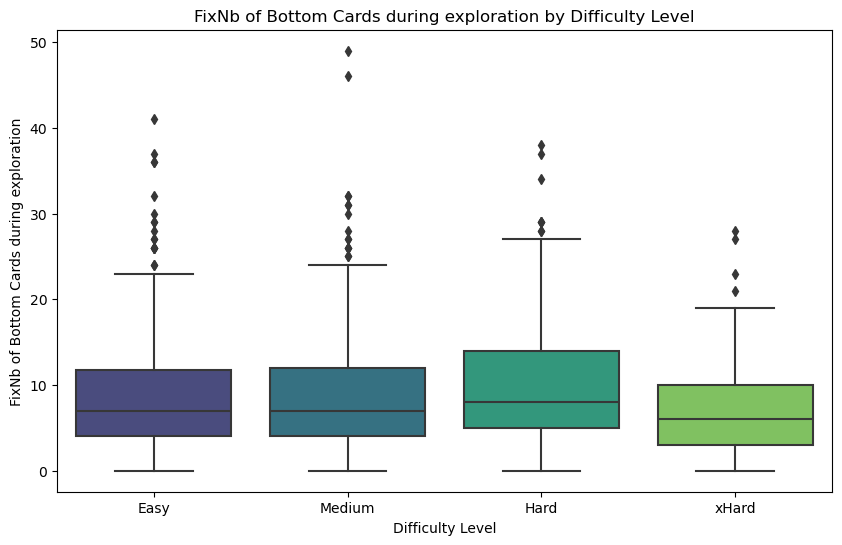

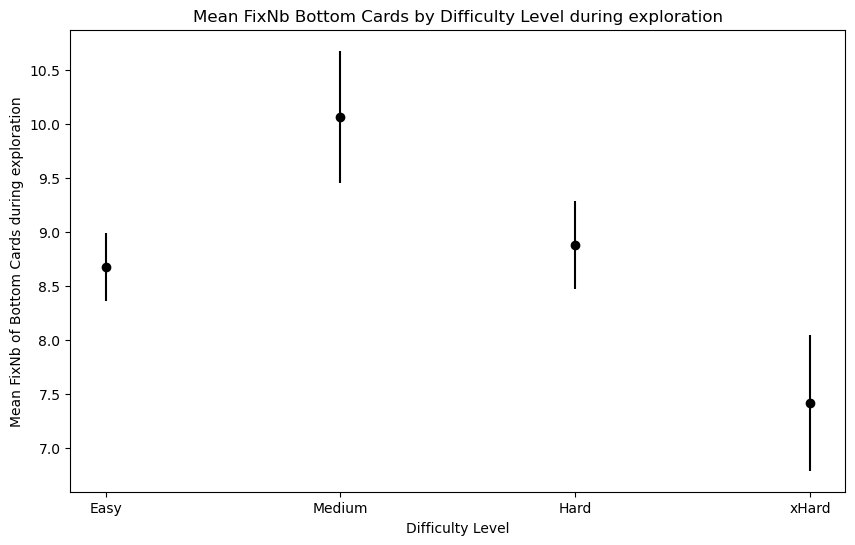

In [69]:
# Fix Number of bottom cards (exploration period) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['FixNbInBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixNbInBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Median and SEM of duration of exploration of bottom cards by difficulty level
mean_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].mean()
median_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].median()
sem_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].sem()

print("Mean FixNb of bottom cards during exploration by Difficulty Level:")
print(mean_FixNbB_by_difficulty)
print("Median FixNb of bottom cards during exploration by Difficulty Level:")
print(median_FixNbB_by_difficulty)
print("SEM FixNb of bottom cards during exploration by Difficulty Level:")
print(sem_FixNbB_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixNbInBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb of Bottom Cards during exploration')
plt.title('FixNb of Bottom Cards during exploration by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_fix_positions = np.arange(len(mean_FixNbB_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixNbB_by_difficulty, yerr=sem_FixNbB_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean FixNb of Bottom Cards during exploration')
plt.title('Mean FixNb Bottom Cards by Difficulty Level during exploration')
plt.xticks(x_fix_positions, difficulty_order)
plt.show()

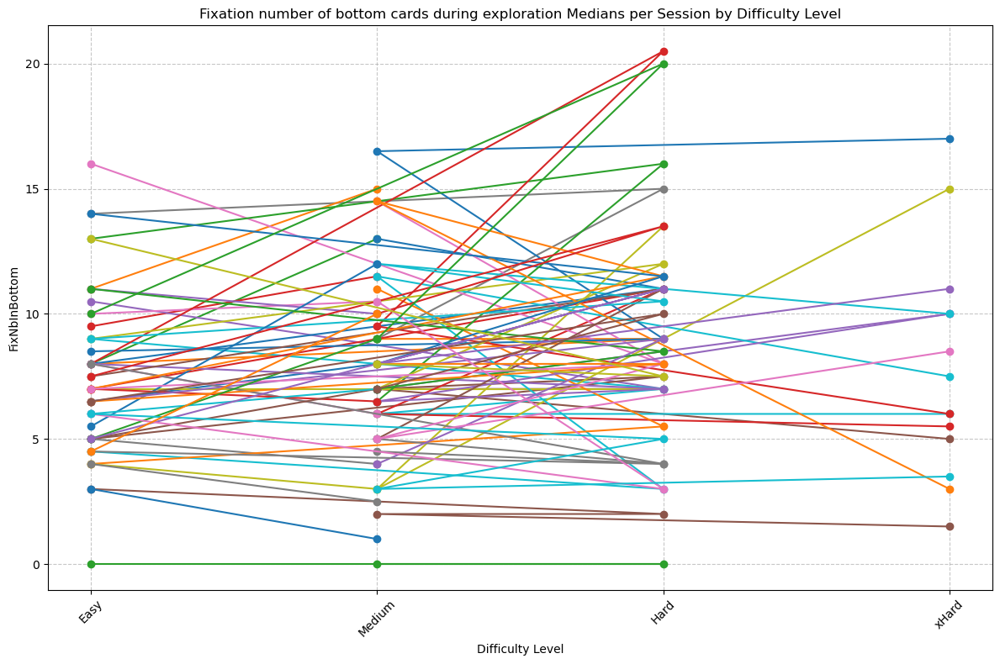

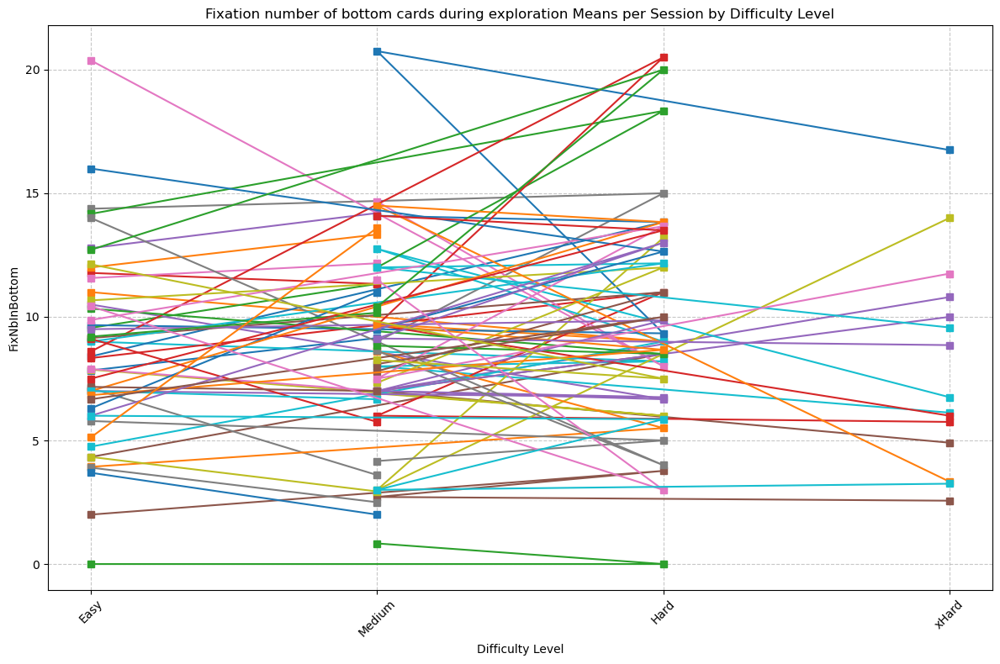

In [24]:
# Fix Number of bottom cards (exploration period) vs. difficulty level per session

#Medians
session_fix_nb_exploration = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fix_nb_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixnbBottom_session = session_fix_nb_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_fixnbBottom_session.index, median_fixnbBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_nb_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fix_nb_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixnbBottom_session = session_fix_nb_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixnbBottom_session.index, mean_fixnbBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number of bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

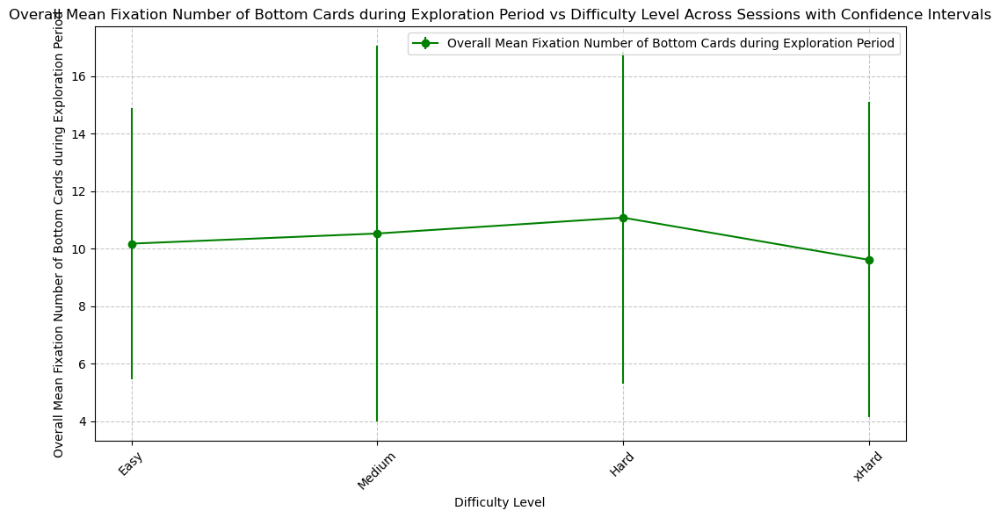

Overall Mean Fixation Number of Bottom Cards during Exploration Period per Difficulty Level Across Sessions:
difficulty
Easy      10.175363
Medium    10.528014
Hard      11.079847
xHard      9.612182
dtype: float64


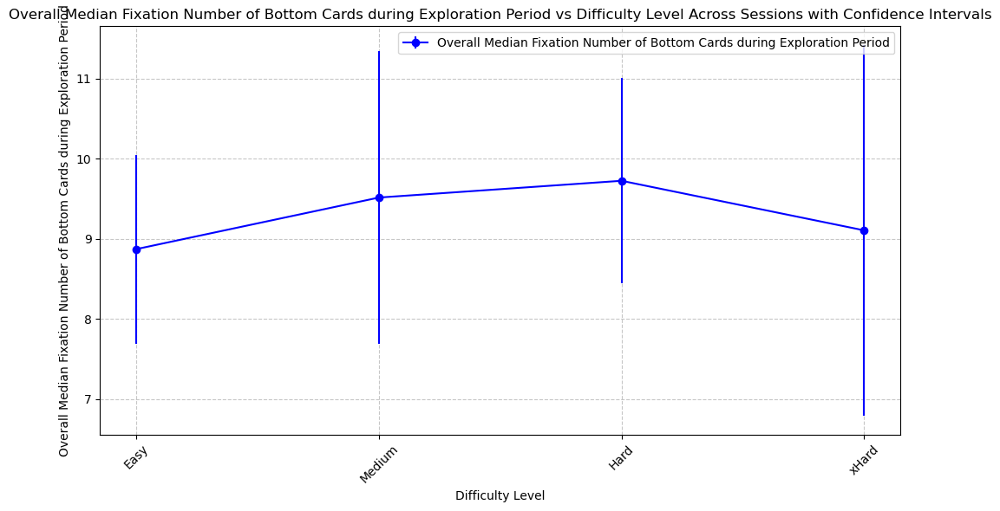


Overall Median Fixation Number of Bottom Cards during Exploration Period per Difficulty Level Across Sessions:
difficulty
Easy      8.871429
Medium    9.514493
Hard      9.723404
xHard     9.105263
dtype: float64


In [21]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_FixNbInBottom = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].mean().unstack()
session_median_exp_FixNbInBottom = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

overall_mean_exp_FixNbInBottom = session_mean_exp_FixNbInBottom.mean()
overall_median_exp_FixNbInBottom = session_median_exp_FixNbInBottom.mean()

overall_mean_exp_FixNbInBottom = overall_mean_exp_FixNbInBottom.reindex(difficulty_order)
overall_median_exp_FixNbInBottom = overall_median_exp_FixNbInBottom.reindex(difficulty_order)

session_std_exp_FixNbInBottom = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].std().unstack()
session_count_exp_FixNbInBottom = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_FixNbInBottom.mean() / np.sqrt(session_count_exp_FixNbInBottom.mean())

overall_conf_interval_median = 1.96 * session_median_exp_FixNbInBottom.std() / np.sqrt(session_median_exp_FixNbInBottom.count())

# Mean exploration fixation number of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_FixNbInBottom.index, overall_mean_exp_FixNbInBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number of Bottom Cards during Exploration Period')
plt.title('Overall Mean Fixation Number of Bottom Cards during Exploration Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Number of Bottom Cards during Exploration Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number of Bottom Cards during Exploration Period per Difficulty Level Across Sessions:")
print(overall_mean_exp_FixNbInBottom)

# Median exploration fixation number of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_FixNbInBottom.index, overall_median_exp_FixNbInBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number of Bottom Cards during Exploration Period')
plt.title('Overall Median Fixation Number of Bottom Cards during Exploration Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Number of Bottom Cards during Exploration Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number of Bottom Cards during Exploration Period per Difficulty Level Across Sessions:")
print(overall_median_exp_FixNbInBottom)

## Number of fixations of bottom cards (both periods) vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 5.671099770400566e-19
Shapiro-Wilk test for Hard: p-value = 5.246578566441293e-09
Shapiro-Wilk test for Medium: p-value = 2.883541532374853e-16
Shapiro-Wilk test for xHard: p-value = 4.233474278771004e-06
Levene's test for homogeneity of variances: p-value = 0.18016397583693677
Kruskal-Wallis test:
H-statistic: 8.431382627011718
p-value: 0.03788893366066824
Mean FixNb of bottom cards by Difficulty Level:
difficulty
Easy       9.964758
Medium    10.103125
Hard      11.306748
xHard      8.655914
Name: FixNbInBottom, dtype: float64
SEM FixNb of bottom cards by Difficulty Level:
difficulty
Easy      0.315668
Medium    0.410668
Hard      0.612076
xHard     0.620006
Name: FixNbInBottom, dtype: float64


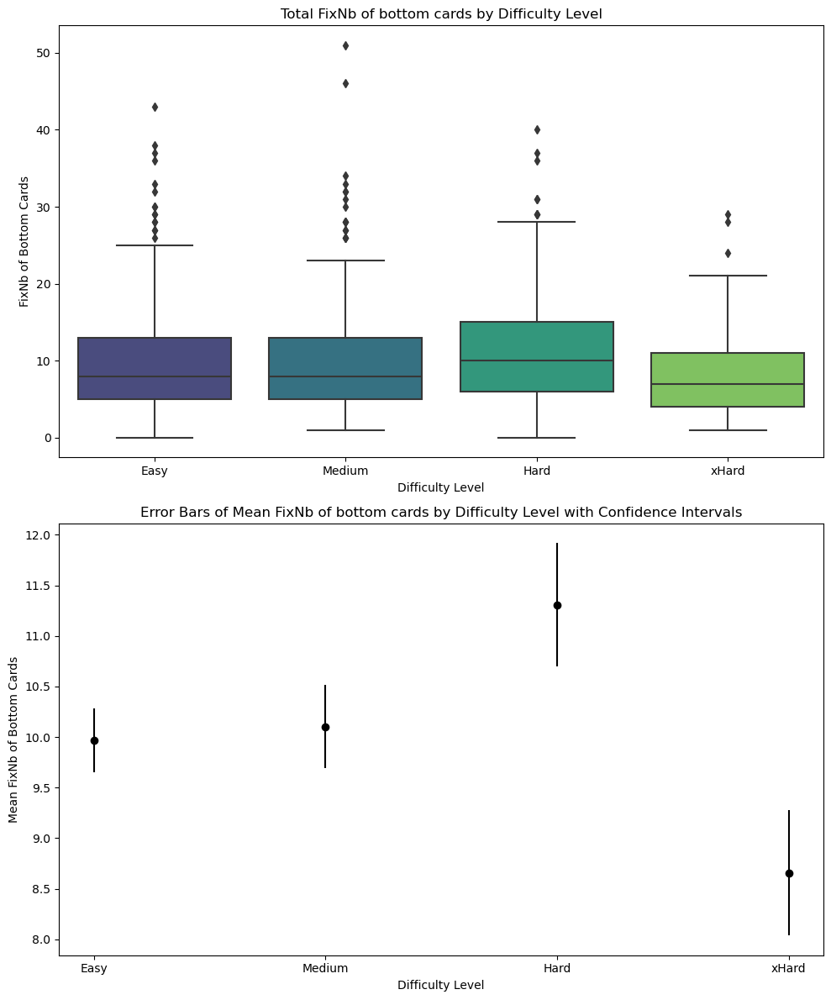

In [25]:
# Fix Number of bottom cards (both periods) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInBottom_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['FixNbInBottom'] for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['FixNbInBottom'] for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_FixNbInBottom_by_difficulty = FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom'].mean().reindex(difficulty_order)
sem_FixNbInBottom_by_difficulty = FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom'].sem().reindex(difficulty_order)
print("Mean FixNb of bottom cards by Difficulty Level:")
print(mean_FixNbInBottom_by_difficulty)
print("SEM FixNb of bottom cards by Difficulty Level:")
print(sem_FixNbInBottom_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='FixNbInBottom', data=FixNbInBottom_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('FixNb of Bottom Cards')
ax1.set_title('Total FixNb of bottom cards by Difficulty Level')

ax2.errorbar(np.arange(len(mean_FixNbInBottom_by_difficulty)), mean_FixNbInBottom_by_difficulty, yerr=sem_FixNbInBottom_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean FixNb of Bottom Cards')
ax2.set_title('Error Bars of Mean FixNb of bottom cards by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInBottom_by_difficulty)))
ax2.set_xticklabels(mean_FixNbInBottom_by_difficulty.index)

plt.tight_layout()
plt.show()

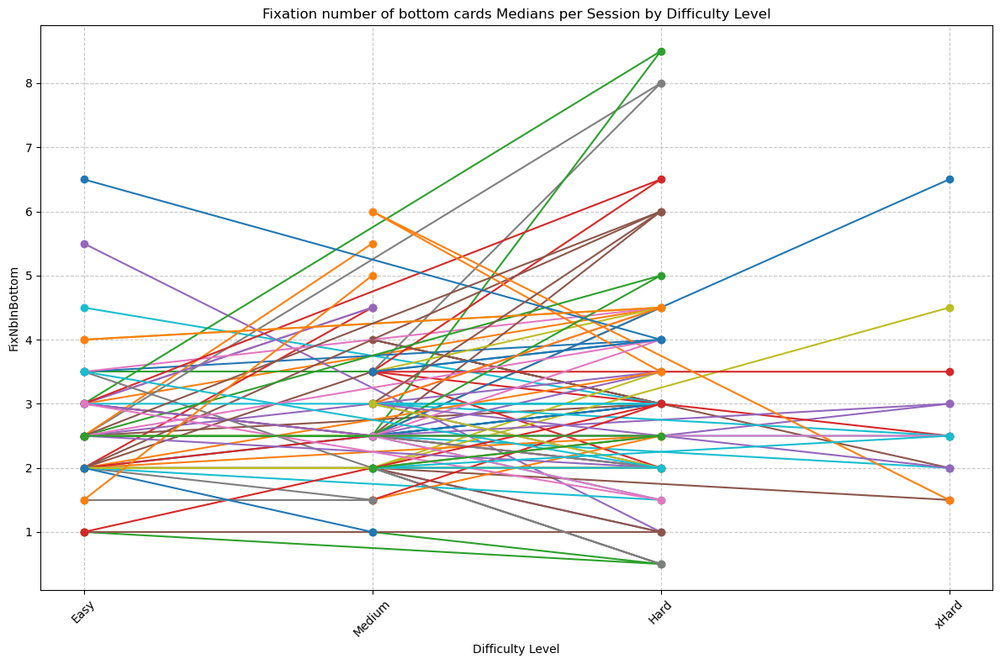

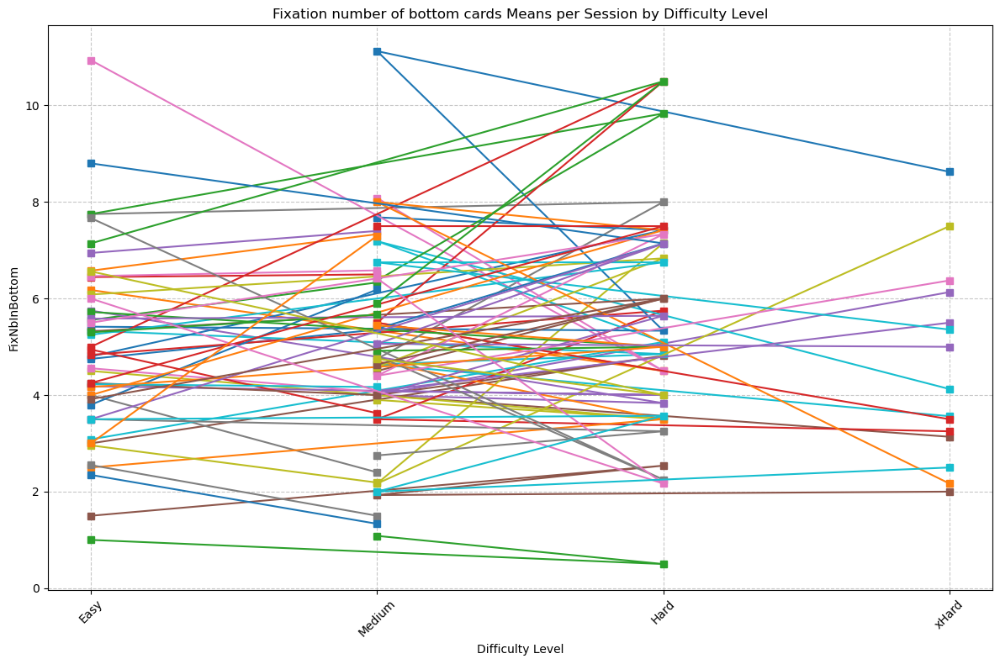

In [26]:
# Fix Number of bottom cards (both periods) vs. difficulty level per session

#Medians
session_fix_nb = data.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fix_nb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixnbBottom_session = session_fix_nb.loc[session][available_difficulty_levels]
        plt.plot(median_fixnbBottom_session.index, median_fixnbBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of bottom cards Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_nb_mean = data.groupby(['session', 'difficulty'])['FixNbInBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fix_nb_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixnbBottom_session = session_fix_nb_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixnbBottom_session.index, mean_fixnbBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number of bottom cards Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

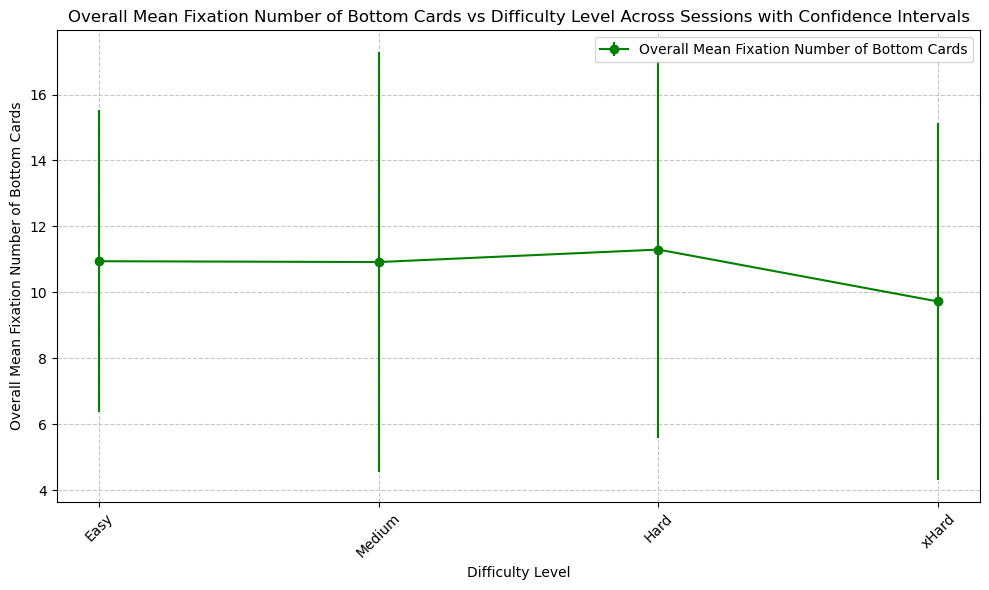

Overall Mean Fixation Number of Bottom Cards per Difficulty Level Across Sessions:
difficulty
Easy      10.943588
Medium    10.918291
Hard      11.296859
xHard      9.721835
dtype: float64


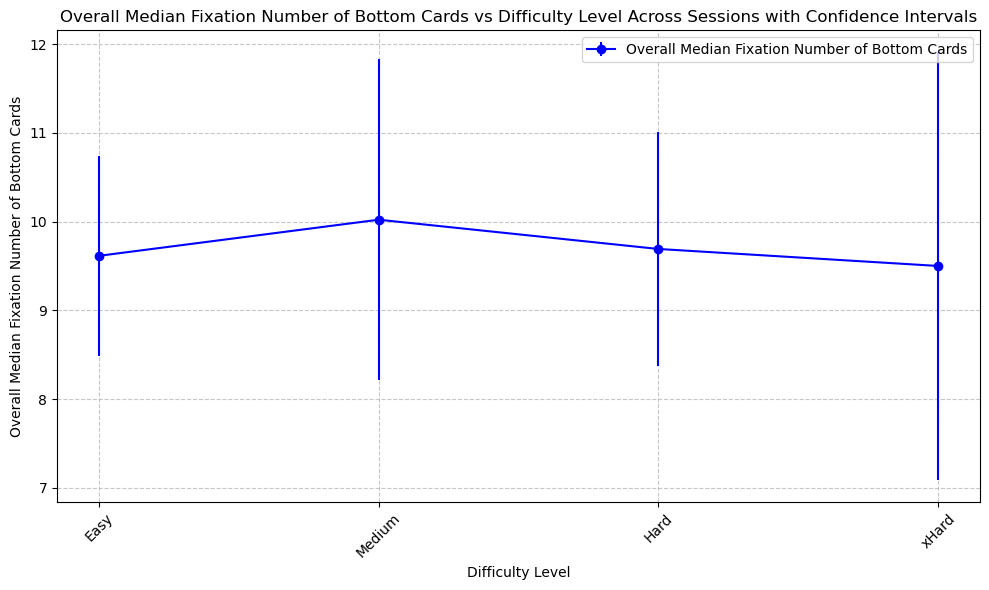


Overall Median Fixation Number of Bottom Cards per Difficulty Level Across Sessions:
difficulty
Easy       9.614286
Medium    10.021127
Hard       9.691489
xHard      9.500000
dtype: float64


In [22]:
# Means and medians across sessions (first session by session, then medians/ means of that)

FixNbInBottom_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

session_mean_FixNbInBottom = FixNbInBottom_per_trial.groupby(['session', 'difficulty'])['FixNbInBottom'].mean().unstack()
session_median_FixNbInBottom = FixNbInBottom_per_trial.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

overall_mean_FixNbInBottom = session_mean_FixNbInBottom.mean()
overall_median_FixNbInBottom = session_median_FixNbInBottom.mean()

overall_mean_FixNbInBottom = overall_mean_FixNbInBottom.reindex(difficulty_order)
overall_median_FixNbInBottom = overall_median_FixNbInBottom.reindex(difficulty_order)

session_std_FixNbInBottom = FixNbInBottom_per_trial.groupby(['session', 'difficulty'])['FixNbInBottom'].std().unstack()
session_count_FixNbInBottom = FixNbInBottom_per_trial.groupby(['session', 'difficulty'])['FixNbInBottom'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_FixNbInBottom.mean() / np.sqrt(session_count_FixNbInBottom.mean())

overall_conf_interval_median = 1.96 * session_median_FixNbInBottom.std() / np.sqrt(session_median_FixNbInBottom.count())

# Mean FixNbInBottom across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_FixNbInBottom.index, overall_mean_FixNbInBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number of Bottom Cards')
plt.title('Overall Mean Fixation Number of Bottom Cards vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Number of Bottom Cards')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number of Bottom Cards per Difficulty Level Across Sessions:")
print(overall_mean_FixNbInBottom)

# Median FixNbInBottom across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_FixNbInBottom.index, overall_median_FixNbInBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number of Bottom Cards')
plt.title('Overall Median Fixation Number of Bottom Cards vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Number of Bottom Cards')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number of Bottom Cards per Difficulty Level Across Sessions:")
print(overall_median_FixNbInBottom)

## Number of fixations (both periods) vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 8.464338519785012e-16
Shapiro-Wilk test for Hard: p-value = 1.0136970585682769e-05
Shapiro-Wilk test for Medium: p-value = 5.612559703126125e-15
Shapiro-Wilk test for xHard: p-value = 1.4455213298317546e-05
Levene's test for homogeneity of variances: p-value = 0.17777256175481518
Kruskal-Wallis test:
H-statistic: 8.370987751827881
p-value: 0.03893557669452082
Mean Fixation Number by Difficulty Level:
difficulty
Easy      15.581498
Medium    15.612500
Hard      17.092025
xHard     14.225806
Name: FixNb, dtype: float64
Median Fixation Number by Difficulty Level:
difficulty
Easy      14.0
Medium    14.0
Hard      16.0
xHard     14.0
Name: FixNb, dtype: float64
SEM Fixation Number by Difficulty Level:
difficulty
Easy      0.371111
Medium    0.492458
Hard      0.679819
xHard     0.701986
Name: FixNb, dtype: float64


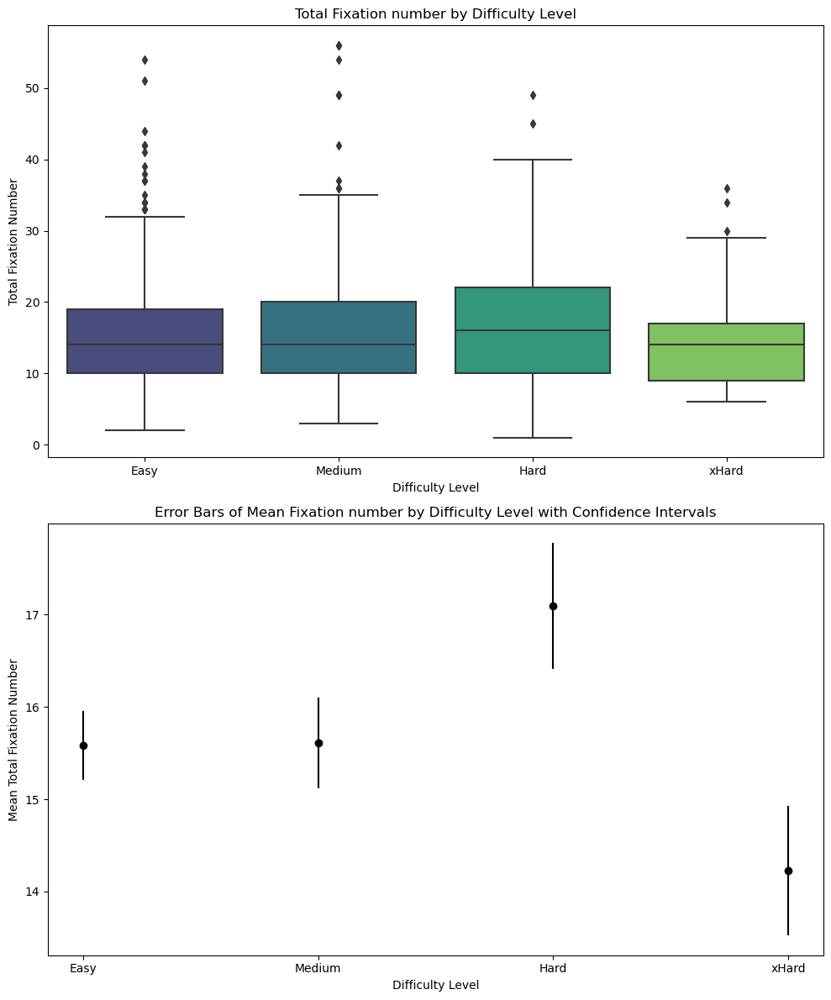

In [68]:
# Fixation  number for both periods vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

Fixnb_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in Fixnb_total_by_difficulty.groupby('difficulty')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['FixNb'] for group_name, group_data in Fixnb_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['FixNb'] for group_name, group_data in Fixnb_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_totalfixnb_by_difficulty = Fixnb_total_by_difficulty.groupby('difficulty')['FixNb'].mean().reindex(difficulty_order)
median_totalfixnb_by_difficulty = Fixnb_total_by_difficulty.groupby('difficulty')['FixNb'].median().reindex(difficulty_order)
sem_totalfixnb_by_difficulty = Fixnb_total_by_difficulty.groupby('difficulty')['FixNb'].sem().reindex(difficulty_order)
print("Mean Fixation Number by Difficulty Level:")
print(mean_totalfixnb_by_difficulty)
print("Median Fixation Number by Difficulty Level:")
print(median_totalfixnb_by_difficulty)
print("SEM Fixation Number by Difficulty Level:")
print(sem_totalfixnb_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='FixNb', data=Fixnb_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Fixation Number')
ax1.set_title('Total Fixation number by Difficulty Level')

ax2.errorbar(np.arange(len(mean_totalfixnb_by_difficulty)), mean_totalfixnb_by_difficulty, yerr=sem_totalfixnb_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Fixation Number')
ax2.set_title('Error Bars of Mean Fixation number by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_totalfixnb_by_difficulty)))
ax2.set_xticklabels(mean_totalfixnb_by_difficulty.index)

plt.tight_layout()
plt.show()

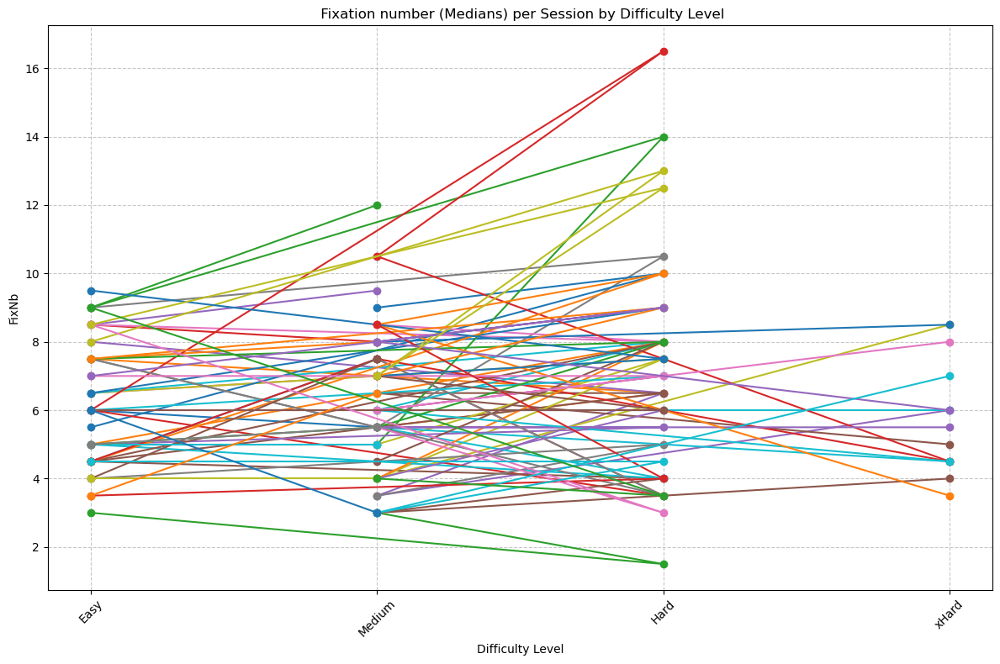

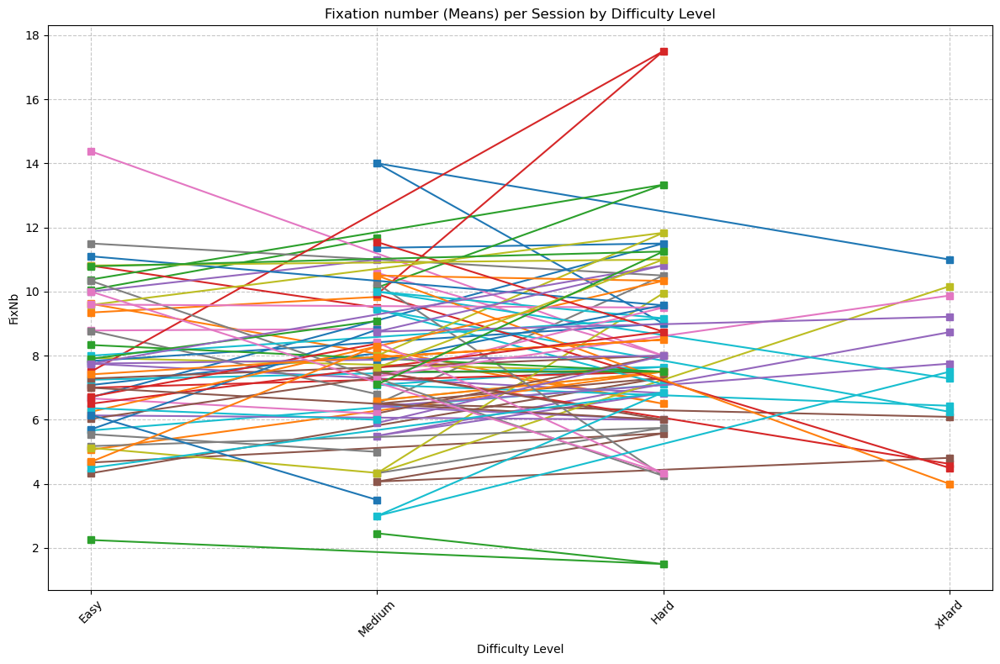

In [28]:
# Total fixation number during both periods vs. difficulty level per session

#Medians
session_fixnb = data.groupby(['session', 'difficulty'])['FixNb'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fixnb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixnb_session = session_fixnb.loc[session][available_difficulty_levels]
        plt.plot(median_fixnb_session.index, median_fixnb_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title(' Fixation number (Medians) per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fixnb_mean = data.groupby(['session', 'difficulty'])['FixNb'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fixnb_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixnb_session = session_fixnb_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixnb_session.index, mean_fixnb_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number (Means) per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

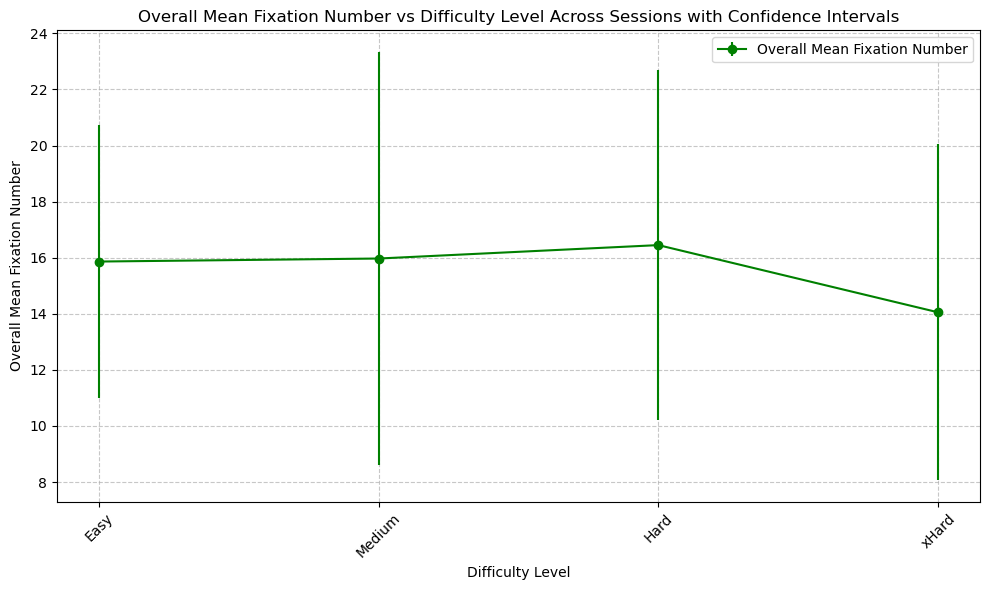

Overall Mean Fixation Number per Difficulty Level Across Sessions:
difficulty
Easy      15.863029
Medium    15.970959
Hard      16.449294
xHard     14.052956
dtype: float64


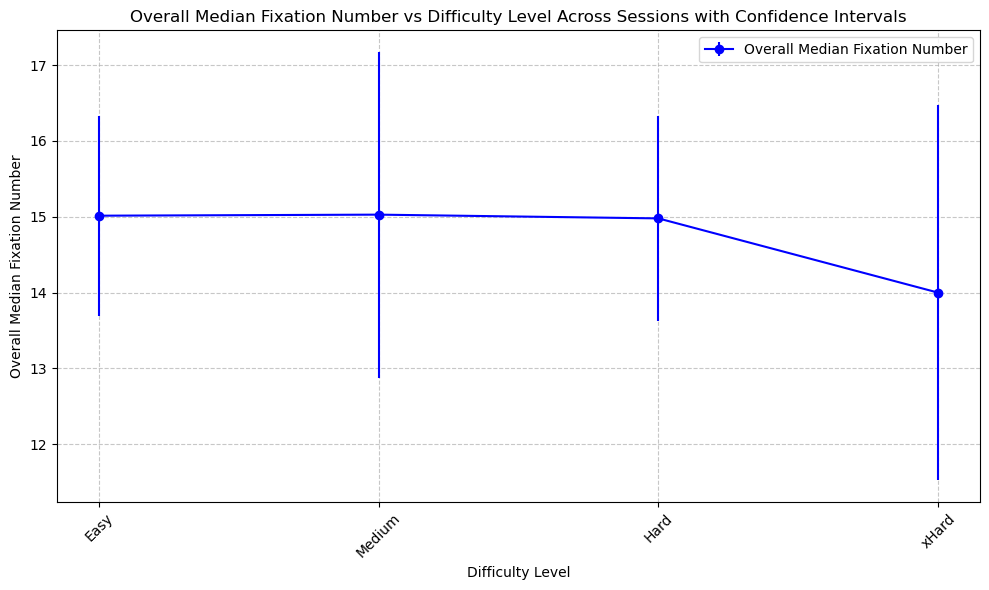


Overall Median Fixation Number per Difficulty Level Across Sessions:
difficulty
Easy      15.014286
Medium    15.028169
Hard      14.978723
xHard     14.000000
dtype: float64


In [23]:
# Means and medians across sessions (first session by session, then medians/ means of that)

FixNb_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

session_mean_FixNb = FixNb_per_trial.groupby(['session', 'difficulty'])['FixNb'].mean().unstack()
session_median_FixNb = FixNb_per_trial.groupby(['session', 'difficulty'])['FixNb'].median().unstack()

overall_mean_FixNb = session_mean_FixNb.mean()
overall_median_FixNb = session_median_FixNb.mean()

overall_mean_FixNb = overall_mean_FixNb.reindex(difficulty_order)
overall_median_FixNb = overall_median_FixNb.reindex(difficulty_order)

session_std_FixNb = FixNb_per_trial.groupby(['session', 'difficulty'])['FixNb'].std().unstack()
session_count_FixNb= FixNb_per_trial.groupby(['session', 'difficulty'])['FixNb'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_FixNb.mean() / np.sqrt(session_count_FixNb.mean())

overall_conf_interval_median = 1.96 * session_median_FixNb.std() / np.sqrt(session_median_FixNb.count())

# Mean FixNb across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_FixNb.index, overall_mean_FixNb.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number')
plt.title('Overall Mean Fixation Number vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Number')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number per Difficulty Level Across Sessions:")
print(overall_mean_FixNb)

# Median FixNb across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_FixNb.index, overall_median_FixNb.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number')
plt.title('Overall Median Fixation Number vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Number')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number per Difficulty Level Across Sessions:")
print(overall_median_FixNb)

## Number of fixations of top card (decision period) vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 4.7059790515259286e-23
Shapiro-Wilk test for Hard: p-value = 7.861580275993125e-12
Shapiro-Wilk test for Medium: p-value = 3.700511436009353e-21
Shapiro-Wilk test for xHard: p-value = 2.258521615700087e-10
Levene's test for homogeneity of variances: p-value = 0.7564362237448998
Kruskal-Wallis test:
H-statistic: 1.9914753352652865
p-value: 0.5741779146084256
Mean Fixation number of Top card (decision) by Difficulty Level:
difficulty
Easy      3.792952
Hard      3.834356
Medium    3.631250
xHard     3.430108
Name: FixNbInT, dtype: float64
Median Fixation number of Top card (decision) by Difficulty Level:
difficulty
Easy      3.0
Hard      3.0
Medium    3.0
xHard     3.0
Name: FixNbInT, dtype: float64
SEM Fixation number of Top card (decision) by Difficulty Level:
difficulty
Easy      0.158896
Hard      0.250163
Medium    0.191883
xHard     0.313853
Name: FixNbInT, dtype: float64


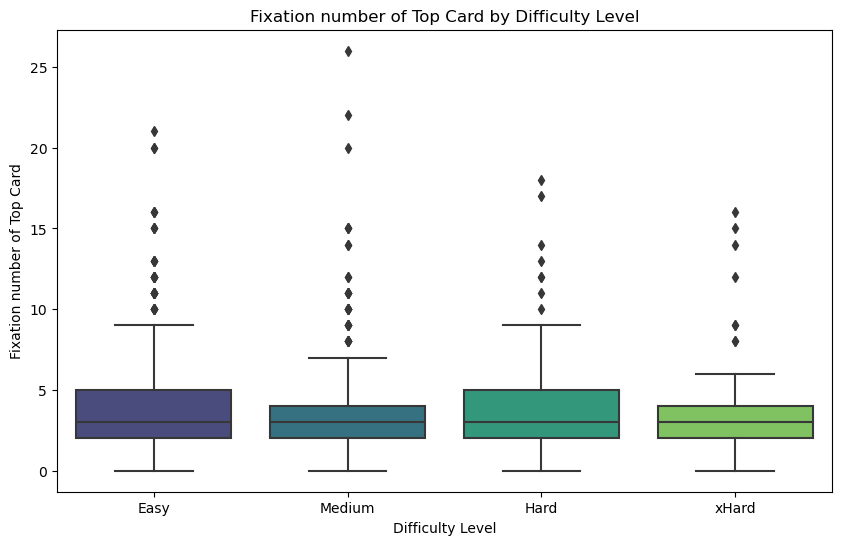

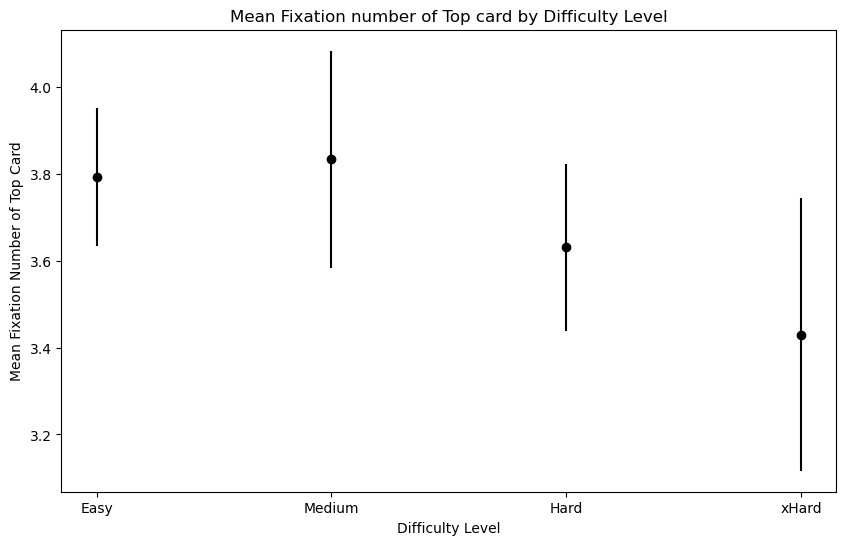

In [70]:
# Top card fixation number (decision period) vs. difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInt_by_difficulty = [decision_data[decision_data['difficulty'] == level]['FixNbInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['FixNbInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInt_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixNbInt_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of fixation number of top card by difficulty level
mean_FixNbInt_by_difficulty = decision_data.groupby('difficulty')['FixNbInT'].mean()
median_FixNbInt_by_difficulty = decision_data.groupby('difficulty')['FixNbInT'].median()
sem_FixNbInt_by_difficulty = decision_data.groupby('difficulty')['FixNbInT'].sem()

print("Mean Fixation number of Top card (decision) by Difficulty Level:")
print(mean_FixNbInt_by_difficulty)
print("Median Fixation number of Top card (decision) by Difficulty Level:")
print(median_FixNbInt_by_difficulty)
print("SEM Fixation number of Top card (decision) by Difficulty Level:")
print(sem_FixNbInt_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixNbInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Fixation number of Top Card')
plt.title('Fixation number of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_FixNbInt_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixNbInt_by_difficulty, yerr=sem_FixNbInt_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Fixation Number of Top Card')
plt.title('Mean Fixation number of Top card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

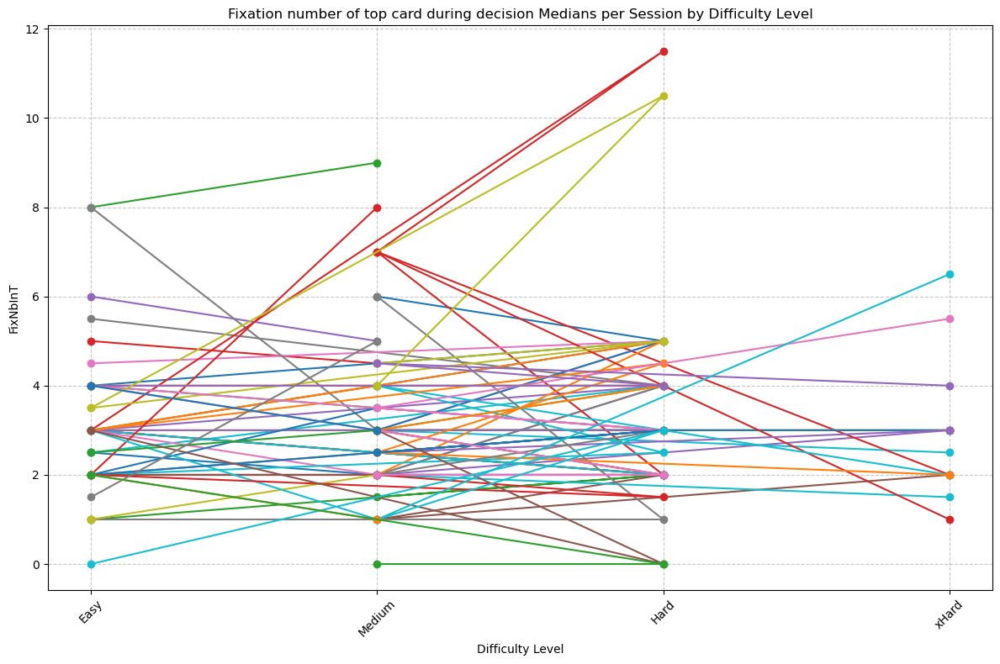

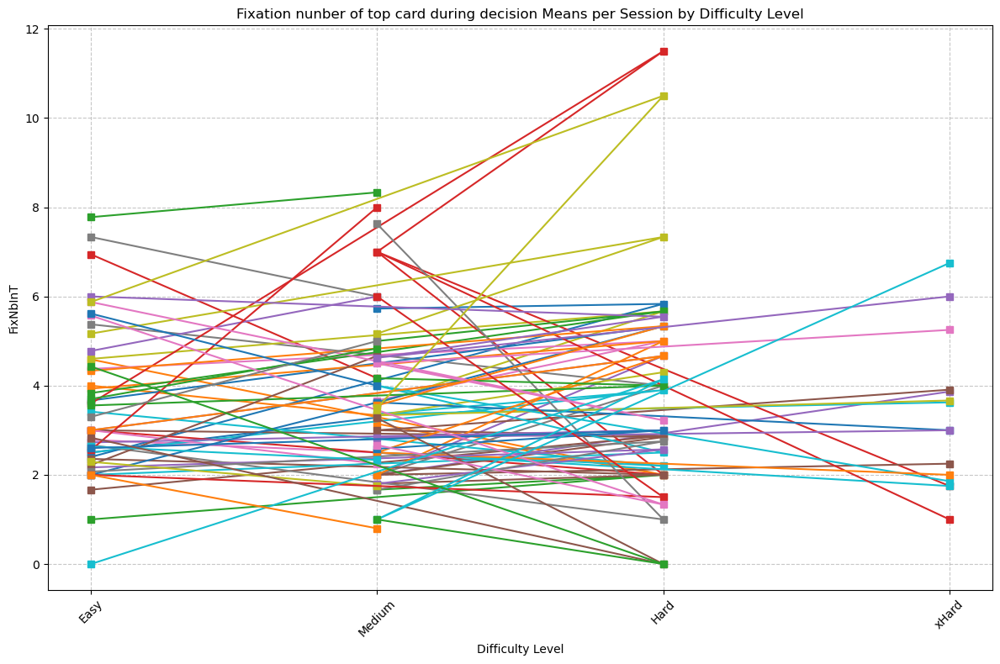

In [30]:
# Fixation number of top card (decision period) vs. difficulty levels per session

#Medians
session_FixNbInT_decision = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_FixNbInT_decision.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_FixNbInT_session = session_FixNbInT_decision.loc[session][available_difficulty_levels]
        plt.plot(median_FixNbInT_session.index,median_FixNbInT_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of top card during decision Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_FixNbInT_decision_mean = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_FixNbInT_decision_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_FixNbInT_session = session_FixNbInT_decision_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_FixNbInT_session.index, mean_FixNbInT_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation nunber of top card during decision Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

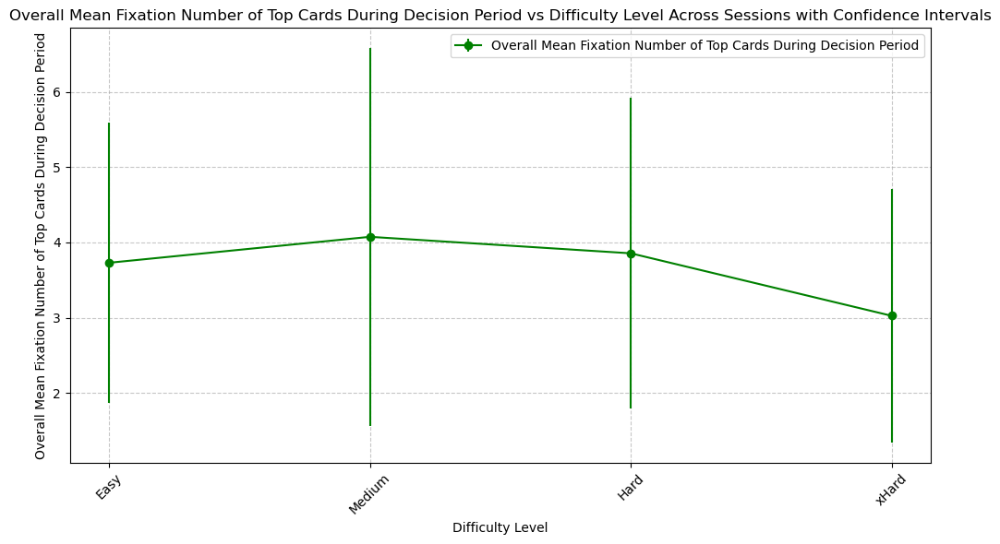

Overall Mean Fixation Number of Top Cards During Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      3.730543
Medium    4.075116
Hard      3.856020
xHard     3.025635
dtype: float64


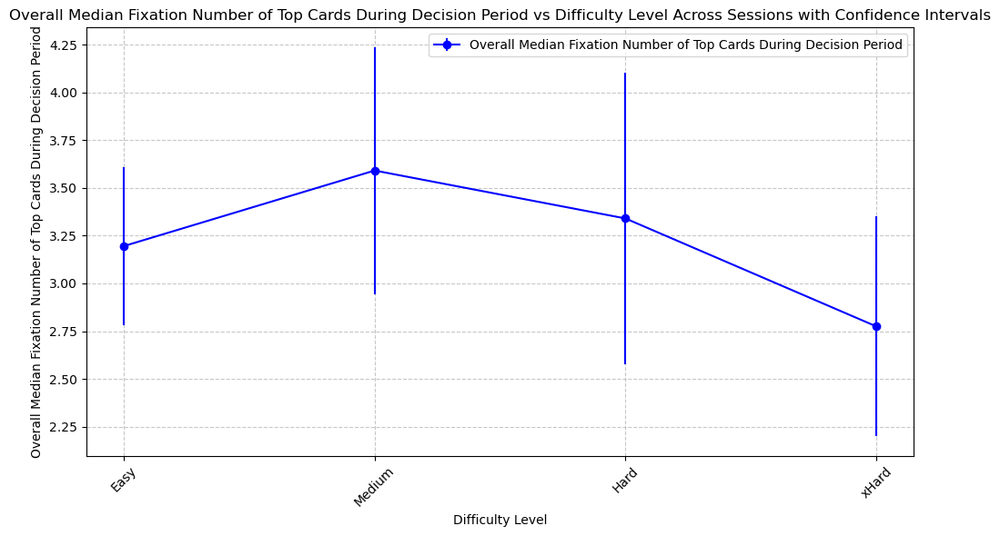


Overall Median Fixation Number of Top Cards During Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      3.195652
Medium    3.591549
Hard      3.340426
xHard     2.775000
dtype: float64


In [24]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_dec_FixNbInT = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].mean().unstack()
session_median_dec_FixNbInT = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].median().unstack()

overall_mean_dec_FixNbInT = session_mean_dec_FixNbInT.mean()
overall_median_dec_FixNbInT = session_median_dec_FixNbInT.mean()

overall_mean_dec_FixNbInT = overall_mean_dec_FixNbInT.reindex(difficulty_order)
overall_median_dec_FixNbInT = overall_median_dec_FixNbInT.reindex(difficulty_order)

session_std_dec_FixNbInT = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].std().unstack()
session_count_dec_FixNbInT = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_FixNbInT.mean() / np.sqrt(session_count_dec_FixNbInT.mean())

overall_conf_interval_median = 1.96 * session_median_dec_FixNbInT.std() / np.sqrt(session_median_dec_FixNbInT.count())

# Mean FixNbInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_FixNbInT.index, overall_mean_dec_FixNbInT.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number of Top Cards During Decision Period')
plt.title('Overall Mean Fixation Number of Top Cards During Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Number of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number of Top Cards During Decision Period per Difficulty Level Across Sessions:")
print(overall_mean_dec_FixNbInT)

# Median FixNbInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_FixNbInT.index, overall_median_dec_FixNbInT.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number of Top Cards During Decision Period')
plt.title('Overall Median Fixation Number of Top Cards During Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Number of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number of Top Cards During Decision Period per Difficulty Level Across Sessions:")
print(overall_median_dec_FixNbInT)

## Number of fixations in exploration and decision periods vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 2.500588925689916e-19
Shapiro-Wilk test for Hard: p-value = 8.923506040484495e-09
Shapiro-Wilk test for Medium: p-value = 2.673131478063995e-16
Shapiro-Wilk test for xHard: p-value = 1.9134579352484543e-07
Levene's test for homogeneity of variances: p-value = 0.18753888619140205
Kruskal-Wallis test:
H-statistic: 9.208493994087329
p-value: 0.02664351691532505
Shapiro-Wilk test for Easy: p-value = 1.0361206190378001e-22
Shapiro-Wilk test for Hard: p-value = 1.357789333929136e-10
Shapiro-Wilk test for Medium: p-value = 1.4846435376590337e-19
Shapiro-Wilk test for xHard: p-value = 1.060864169103688e-09
Levene's test for homogeneity of variances: p-value = 0.8367121175513262
Kruskal-Wallis test:
H-statistic: 2.1373375714193923
p-value: 0.5443961271075408
Exploration Fixation Number
Means: 
difficulty
Easy      10.374449
Hard      11.865031
Medium    10.643750
xHard      9.376344
Name: FixNb, dtype: float64
Standard Errors of the Mean: 
difficulty
Easy  

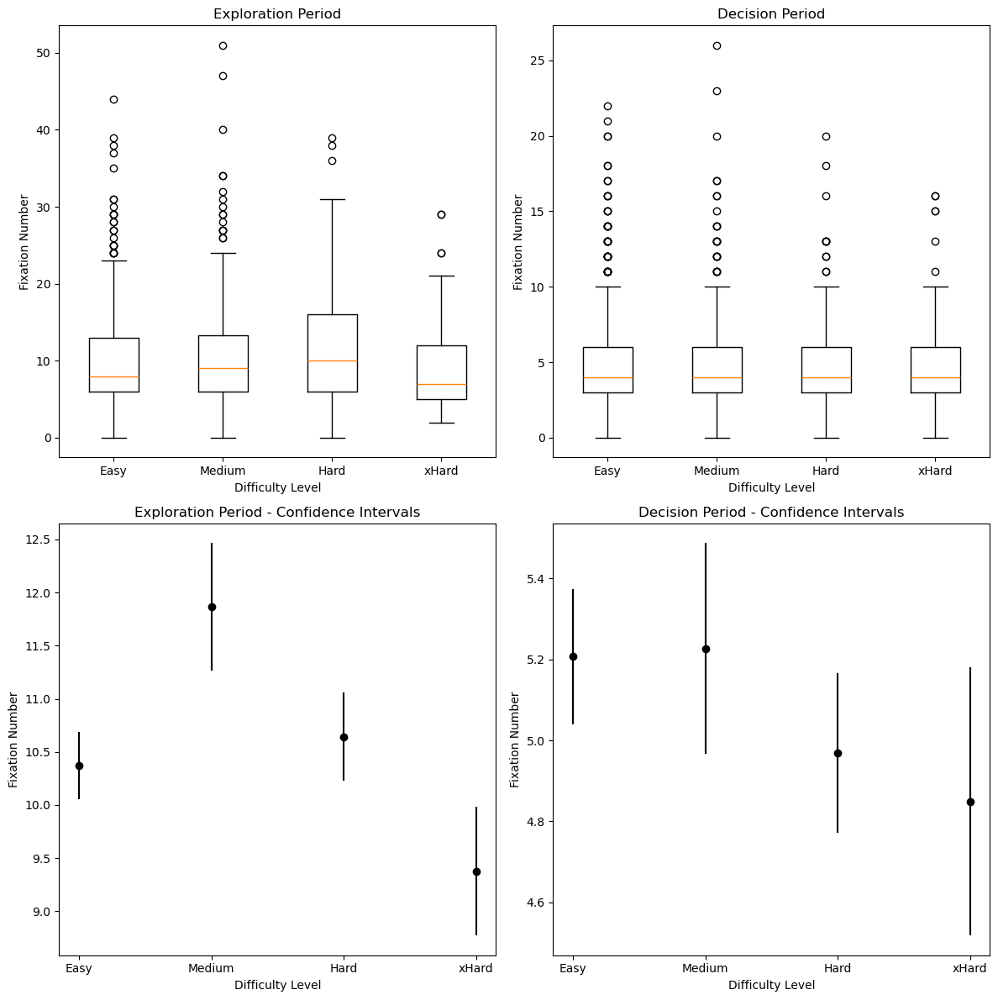

In [31]:
# Fixation number of both exploration and decision periods vs. difficulty level

exploration_fixnb = data[data['period_in_trial'] == 'exploration'].groupby('difficulty')['FixNb']
decision_fixnb = data[data['period_in_trial'] == 'decision'].groupby('difficulty')['FixNb']

# Means and standard errors of the mean for exploration and decision periods
exploration_means = exploration_fixnb.mean()
exploration_sem = exploration_fixnb.sem()
decision_means = decision_fixnb.mean()
decision_sem = decision_fixnb.sem()

# Shapiro-Wilk test for normality - Exploration period
for group_name, group_data in exploration_data.groupby('difficulty')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Exploration period
stat, p = levene(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['FixNb']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration period
H, p = kruskal(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['FixNb']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision period
for group_name, group_data in decision_data.groupby('difficulty')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Decision period
stat, p = levene(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['FixNb']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision period
H, p = kruskal(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['FixNb']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

print("Exploration Fixation Number")
print("Means: ")
print(exploration_means)
print("Standard Errors of the Mean: ")
print(exploration_sem)
print("\nDecision Fixation Number")
print("Means: ")
print(decision_means)
print("Standard Errors of the Mean: ")
print(decision_sem)

# Plots
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
exploration_data_reordered = [exploration_fixnb.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 0].boxplot(exploration_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Difficulty Level')
axs[0, 0].set_ylabel('Fixation Number')
axs[0, 0].set_xticks(np.arange(len(difficulty_order)))
axs[0, 0].set_xticklabels(difficulty_order)

# Decision Period Boxplot
decision_data_reordered = [decision_fixnb.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 1].boxplot(decision_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Difficulty Level')
axs[0, 1].set_ylabel('Fixation Number')
axs[0, 1].set_xticks(np.arange(len(difficulty_order)))
axs[0, 1].set_xticklabels(difficulty_order)

# Exploration Period Error Bars
axs[1, 0].errorbar(np.arange(len(difficulty_order)), exploration_means, yerr=exploration_sem, fmt='o', color='black')
axs[1, 0].set_title('Exploration Period - Confidence Intervals')
axs[1, 0].set_xlabel('Difficulty Level')
axs[1, 0].set_ylabel('Fixation Number')
axs[1, 0].set_xticks(np.arange(len(difficulty_order)))
axs[1, 0].set_xticklabels(difficulty_order)

# Decision Period Error Bars
axs[1, 1].errorbar(np.arange(len(difficulty_order)), decision_means, yerr=decision_sem, fmt='o', color='black')
axs[1, 1].set_title('Decision Period - Confidence Intervals')
axs[1, 1].set_xlabel('Difficulty Level')
axs[1, 1].set_ylabel('Fixation Number')
axs[1, 1].set_xticks(np.arange(len(difficulty_order)))
axs[1, 1].set_xticklabels(difficulty_order)

plt.tight_layout()
plt.show()

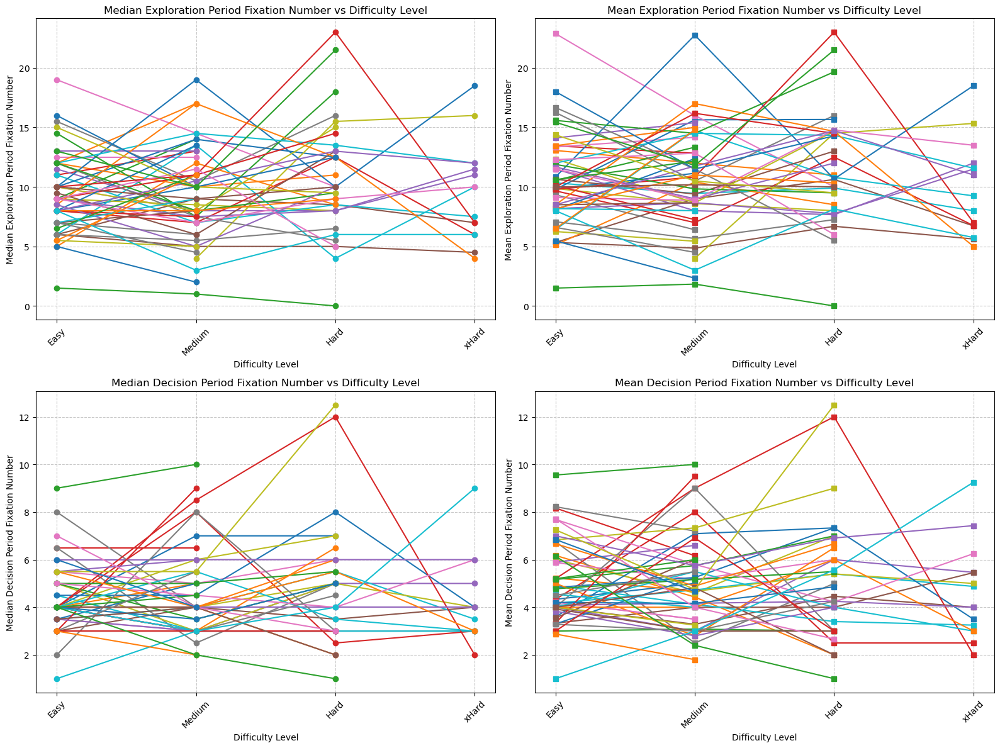

In [32]:
# Fixation number of both exploration and decision periods vs. difficulty level per session

exploration_FixNb = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['FixNb'].median().unstack()
decision_FixNb = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['FixNb'].median().unstack()

exploration_mean_FixNb = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['FixNb'].mean().unstack()
decision_mean_FixNb = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['FixNb'].mean().unstack()

plt.figure(figsize=(16, 12))

# Median fixation number for exploration period per session
plt.subplot(2, 2, 1)
for session in exploration_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Exploration Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Exploration Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean Fixation Number for exploration period per session
plt.subplot(2, 2, 2)
for session in exploration_mean_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_mean_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_mean_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Exploration Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Exploration Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Median Fixation Number for decision period per session
plt.subplot(2, 2, 3)
for session in decision_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = decision_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Decision Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Decision Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean Fixation Number for decision period per session
plt.subplot(2, 2, 4)
for session in decision_mean_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = decision_mean_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_mean_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Decision Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Decision Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

plt.tight_layout()
plt.show()

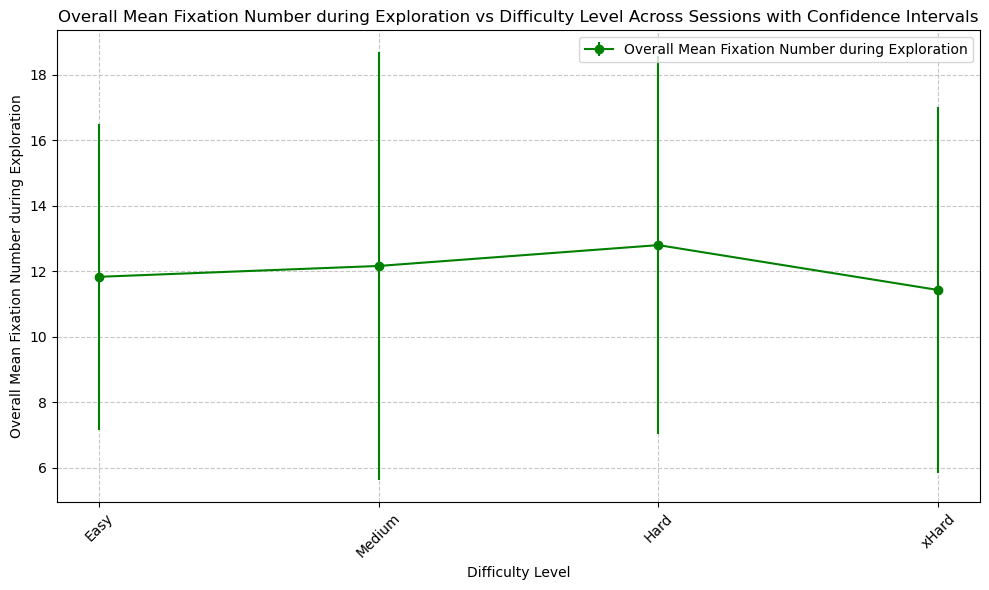

Overall Mean Fixation Number during Exploration per Difficulty Level Across Sessions:
difficulty
Easy      11.828042
Medium    12.159339
Hard      12.795848
xHard     11.426007
dtype: float64


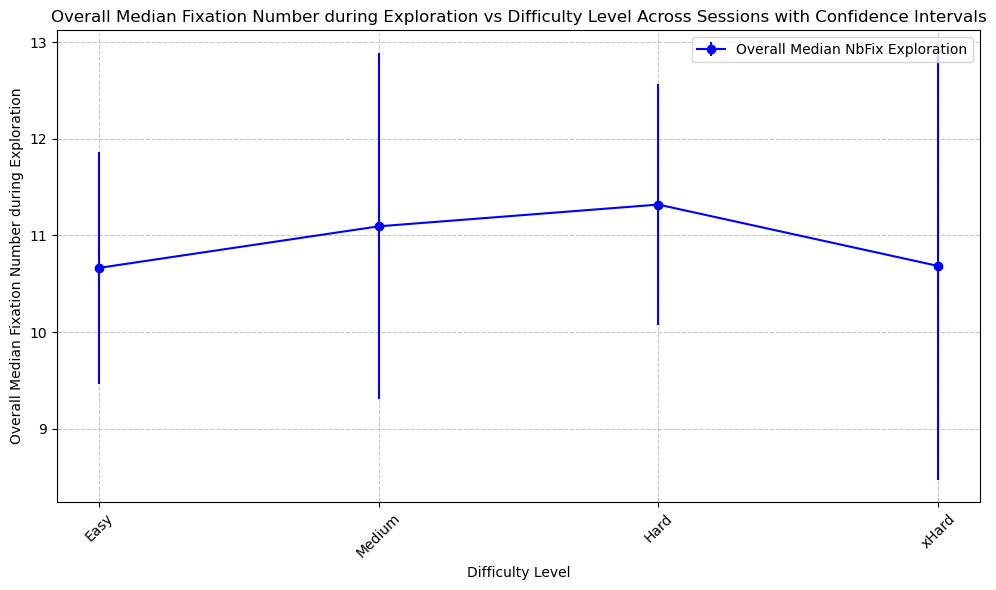


Overall Median Fixation Number during Exploration per Difficulty Level Across Sessions:
difficulty
Easy      10.664286
Medium    11.094203
Hard      11.319149
xHard     10.684211
dtype: float64


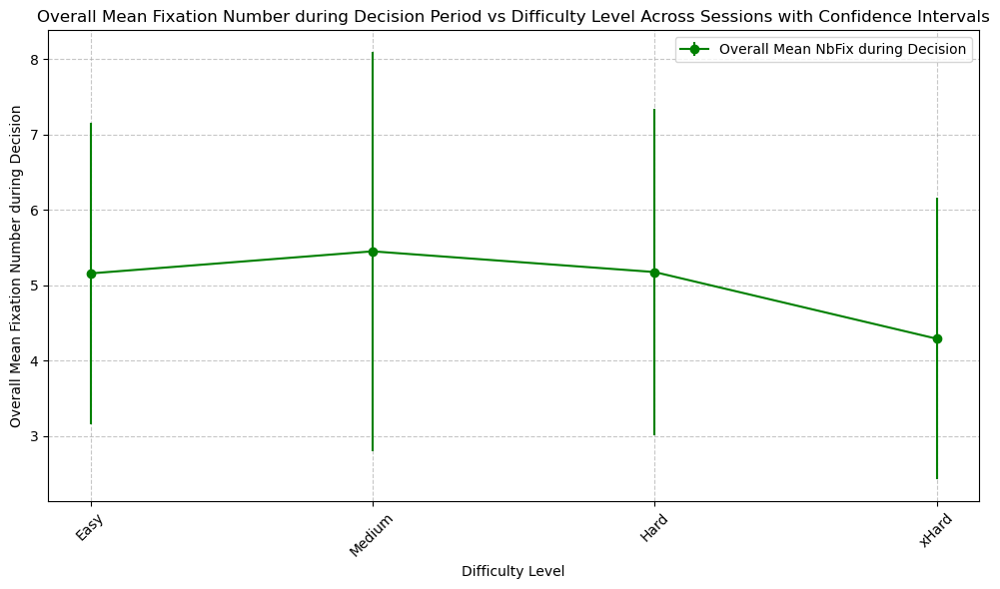

Overall Mean Fixation Number during Decision per Difficulty Level Across Sessions:
difficulty
Easy      5.155467
Medium    5.448624
Hard      5.173688
xHard     4.288929
dtype: float64


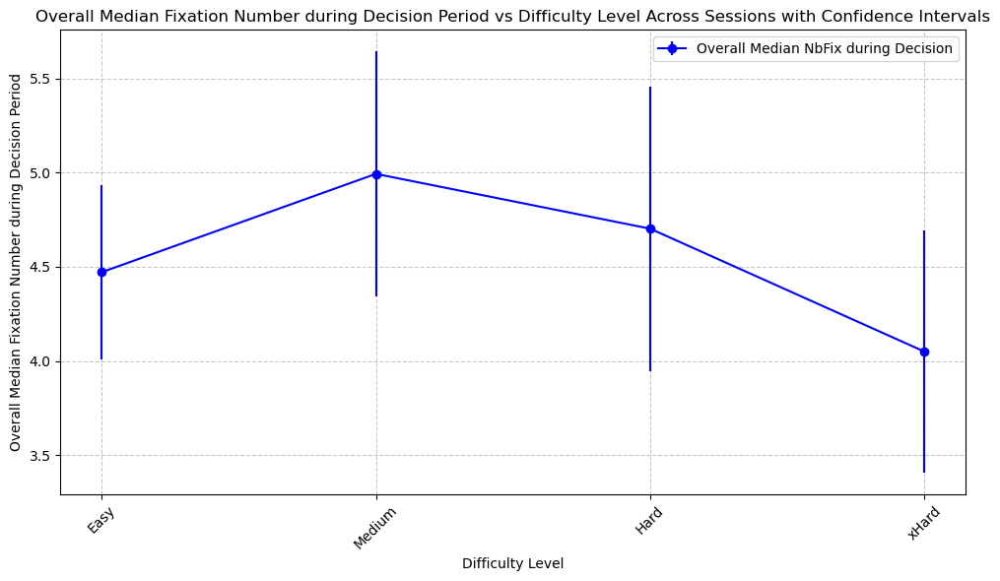


Overall Median Fixation Number during Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      4.471014
Medium    4.992958
Hard      4.702128
xHard     4.050000
dtype: float64


In [26]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_NbFix = exploration_data.groupby(['session', 'difficulty'])['FixNb'].mean().unstack()  
session_median_exp_NbFix = exploration_data.groupby(['session', 'difficulty'])['FixNb'].median().unstack()

overall_mean_exp_NbFix = session_mean_exp_NbFix.mean()
overall_median_exp_NbFix = session_median_exp_NbFix.mean()

overall_mean_exp_NbFix = overall_mean_exp_NbFix.reindex(difficulty_order)
overall_median_exp_NbFix = overall_median_exp_NbFix.reindex(difficulty_order)

session_std_exp_NbFix = exploration_data.groupby(['session', 'difficulty'])['FixNb'].std().unstack()
session_count_exp_NbFix = exploration_data.groupby(['session', 'difficulty'])['FixNb'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_NbFix.mean() / np.sqrt(session_count_exp_NbFix.mean())

overall_conf_interval_median = 1.96 * session_median_exp_NbFix.std() / np.sqrt(session_median_exp_NbFix.count())

# Mean NbFix during exploration period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_NbFix.index, overall_mean_exp_NbFix.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number during Exploration')
plt.title('Overall Mean Fixation Number during Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Number during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number during Exploration per Difficulty Level Across Sessions:")
print(overall_mean_exp_NbFix)

# Median NbFix during exploration period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_NbFix.index, overall_median_exp_NbFix.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median NbFix Exploration')
plt.title('Overall Median Fixation Number during Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Number during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number during Exploration per Difficulty Level Across Sessions:")
print(overall_median_exp_NbFix)

session_mean_dec_NbFix = decision_data.groupby(['session', 'difficulty'])['FixNb'].mean().unstack()
session_median_dec_NbFix = decision_data.groupby(['session', 'difficulty'])['FixNb'].median().unstack()

overall_mean_dec_NbFix = session_mean_dec_NbFix.mean()
overall_median_dec_NbFix = session_median_dec_NbFix.mean()

overall_mean_dec_NbFix = overall_mean_dec_NbFix.reindex(difficulty_order)
overall_median_dec_NbFix = overall_median_dec_NbFix.reindex(difficulty_order)

session_std_dec_NbFix = decision_data.groupby(['session', 'difficulty'])['FixNb'].std().unstack()
session_count_dec_NbFix = decision_data.groupby(['session', 'difficulty'])['FixNb'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_NbFix.mean() / np.sqrt(session_count_dec_NbFix.mean())

overall_conf_interval_median = 1.96 * session_median_dec_NbFix.std() / np.sqrt(session_median_dec_NbFix.count())

# Mean NbFix during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_NbFix.index, overall_mean_dec_NbFix.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean NbFix during Decision')
plt.title('Overall Mean Fixation Number during Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Number during Decision')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number during Decision per Difficulty Level Across Sessions:")
print(overall_mean_dec_NbFix)

# Median NbFix during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_NbFix.index, overall_median_dec_NbFix.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median NbFix during Decision')
plt.title('Overall Median Fixation Number during Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Number during Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number during Decision Period per Difficulty Level Across Sessions:")
print(overall_median_dec_NbFix)

## Fixation Duration of Top Card (Decision Period) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 2.6090504692147061e-23
Shapiro-Wilk test for Hard: p-value = 4.275569542118089e-11
Shapiro-Wilk test for Medium: p-value = 5.300051585912577e-19
Shapiro-Wilk test for xHard: p-value = 7.675484493652583e-10
Levene's test for homogeneity of variances: p-value = 0.7453991101290953
Kruskal-Wallis test:
H-statistic: 3.29251816368831
p-value: 0.3486853353101833
Mean FixTotDurInT (decision) by Difficulty Level:
difficulty
Easy      1360.189427
Hard      1431.926380
Medium    1273.500000
xHard     1282.709677
Name: FixTotDurInT, dtype: float64
Median FixTotDurInT (decision) by Difficulty Level:
difficulty
Easy       908.0
Hard      1068.0
Medium     947.0
xHard      960.0
Name: FixTotDurInT, dtype: float64
SEM FixTotDurInT (decision) by Difficulty Level:
difficulty
Easy       61.427834
Hard       97.393180
Medium     67.000125
xHard     124.137652
Name: FixTotDurInT, dtype: float64


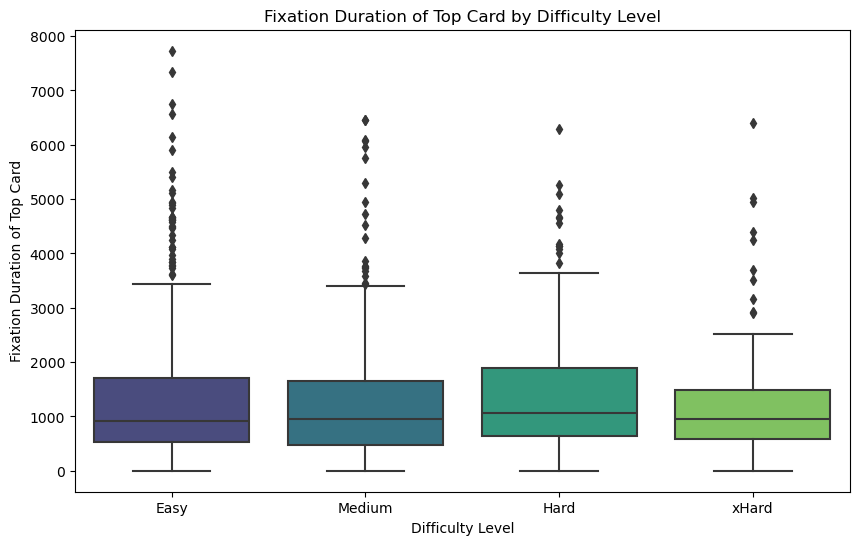

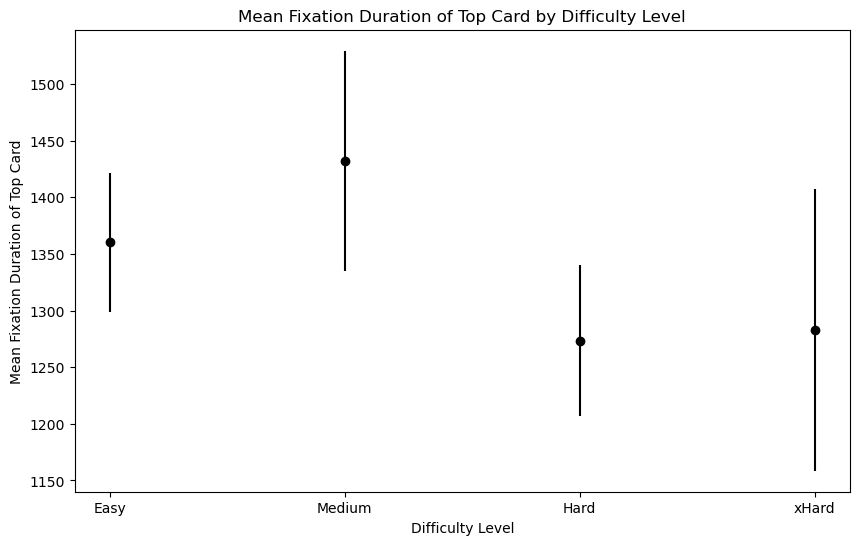

In [71]:
# Fixation duration of top card (decision period) vs. difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixTotDurInT_by_difficulty = [decision_data[decision_data['difficulty'] == level]['FixTotDurInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['FixTotDurInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixTotDurInT_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixTotDurInT_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of fixation duration of decision of top card by difficulty level
mean_FixTotDurInT_by_difficulty = decision_data.groupby('difficulty')['FixTotDurInT'].mean()
median_FixTotDurInT_by_difficulty = decision_data.groupby('difficulty')['FixTotDurInT'].median()
sem_FixTotDurInT_by_difficulty = decision_data.groupby('difficulty')['FixTotDurInT'].sem()

print("Mean FixTotDurInT (decision) by Difficulty Level:")
print(mean_FixTotDurInT_by_difficulty)
print("Median FixTotDurInT (decision) by Difficulty Level:")
print(median_FixTotDurInT_by_difficulty)
print("SEM FixTotDurInT (decision) by Difficulty Level:")
print(sem_FixTotDurInT_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixTotDurInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Fixation Duration of Top Card')
plt.title('Fixation Duration of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_FixTotDurInT_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixTotDurInT_by_difficulty, yerr=sem_FixTotDurInT_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Fixation Duration of Top Card')
plt.title('Mean Fixation Duration of Top Card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

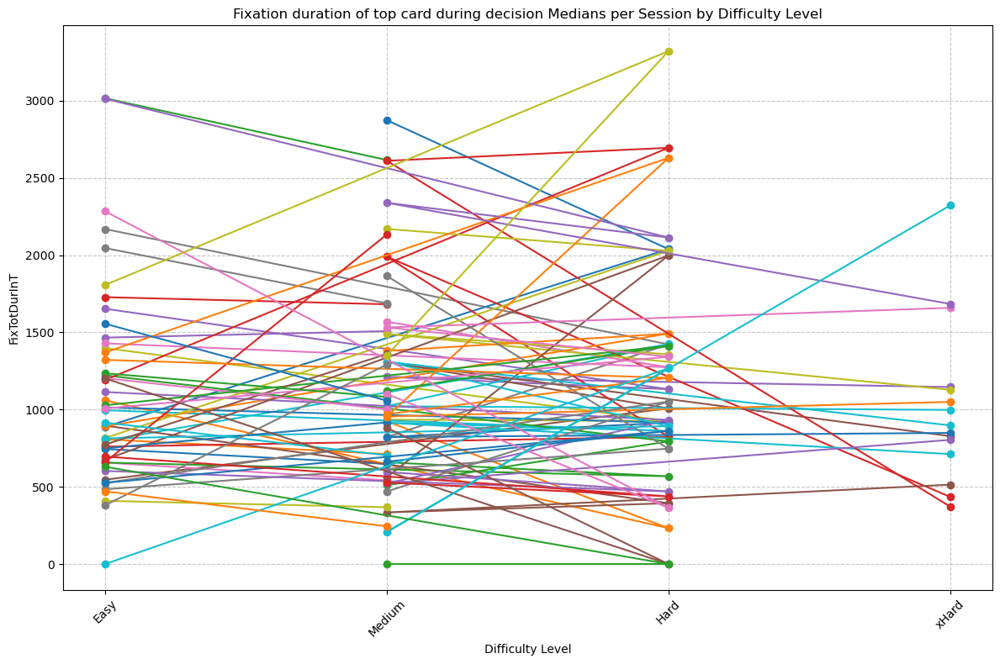

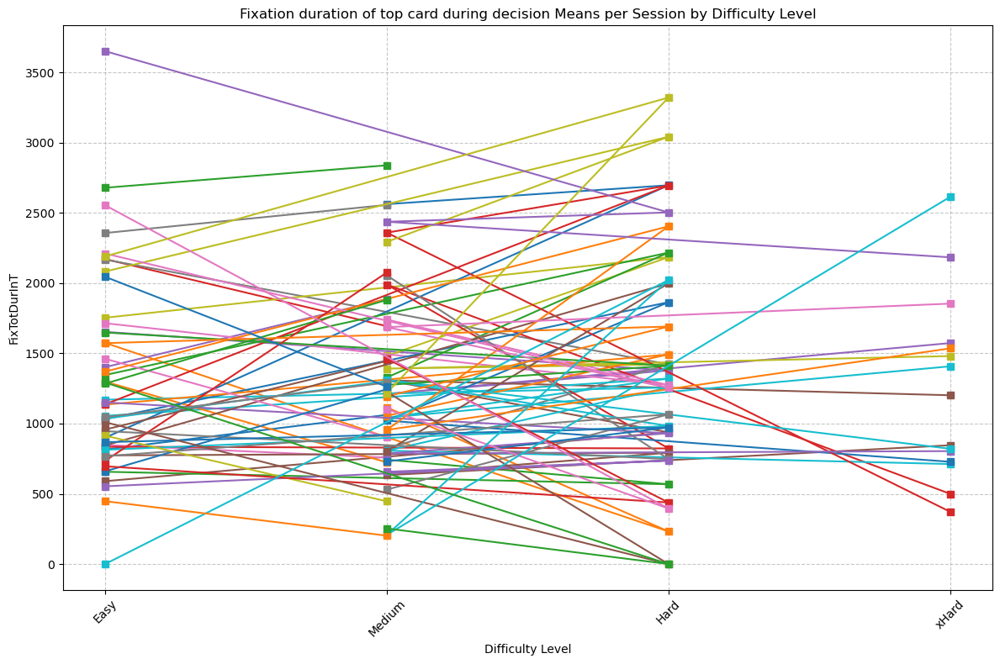

In [34]:
# Fixation duration of top card (decision period) vs. difficulty levels per session

#Medians
session_FixTotDurInT_decision = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_FixTotDurInT_decision.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_FixTotDurInT_session = session_FixTotDurInT_decision.loc[session][available_difficulty_levels]
        plt.plot(median_FixTotDurInT_session.index,median_FixTotDurInT_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation duration of top card during decision Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_FixTotDurInT_decision_mean = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_FixTotDurInT_decision_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_FixTotDurInT_session = session_FixTotDurInT_decision_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_FixTotDurInT_session.index, mean_FixTotDurInT_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation duration of top card during decision Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

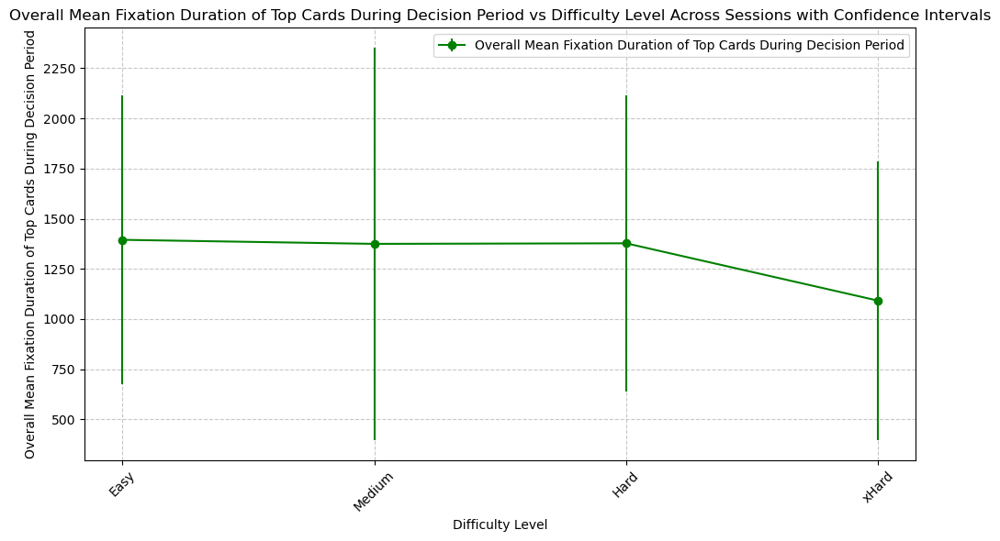

Overall Mean Fixation Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      1394.842287
Medium    1374.665248
Hard      1377.536896
xHard     1091.907063
dtype: float64


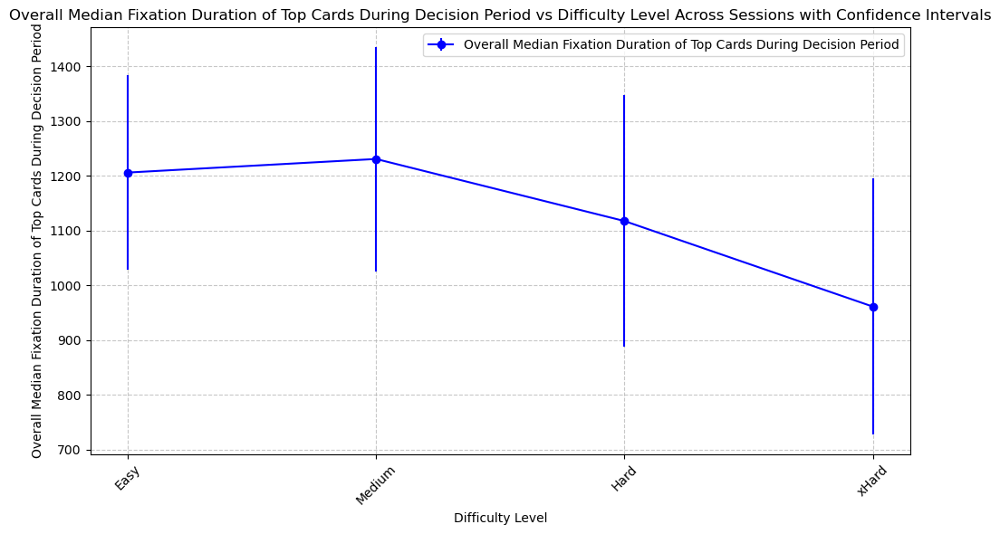


Overall Median Fixation Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:
difficulty
Easy      1205.985507
Medium    1230.760563
Hard      1117.489362
xHard      961.300000
dtype: float64


In [27]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_dec_FixTotDurInT = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].mean().unstack()
session_median_dec_FixTotDurInT = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].median().unstack()

overall_mean_dec_FixTotDurInT = session_mean_dec_FixTotDurInT.mean()
overall_median_dec_FixTotDurInT = session_median_dec_FixTotDurInT.mean()

overall_mean_dec_FixTotDurInT = overall_mean_dec_FixTotDurInT.reindex(difficulty_order)
overall_median_dec_FixTotDurInT = overall_median_dec_FixTotDurInT.reindex(difficulty_order)

session_std_dec_FixTotDurInT = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].std().unstack()
session_count_dec_FixTotDurInT = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_FixTotDurInT.mean() / np.sqrt(session_count_dec_FixTotDurInT.mean())

overall_conf_interval_median = 1.96 * session_median_dec_FixTotDurInT.std() / np.sqrt(session_median_dec_FixTotDurInT.count())

# Mean FixTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_FixTotDurInT.index, overall_mean_dec_FixTotDurInT.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Duration of Top Cards During Decision Period')
plt.title('Overall Mean Fixation Duration of Top Cards During Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:")
print(overall_mean_dec_FixTotDurInT)

# Median FixTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_FixTotDurInT.index, overall_median_dec_FixTotDurInT.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Duration of Top Cards During Decision Period')
plt.title('Overall Median Fixation Duration of Top Cards During Decision Period vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Duration of Top Cards During Decision Period per Difficulty Level Across Sessions:")
print(overall_median_dec_FixTotDurInT)

## Fixation Duration of Bottom Cards (Exploration Period) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 6.393705535059799e-19
Shapiro-Wilk test for Hard: p-value = 2.4924376601446874e-11
Shapiro-Wilk test for Medium: p-value = 9.46013979848981e-15
Shapiro-Wilk test for xHard: p-value = 4.982938217561036e-07
Levene's test for homogeneity of variances: p-value = 0.07500738238354769
Kruskal-Wallis test:
H-statistic: 8.340848127951306
p-value: 0.03946840037489772
Mean Fixation Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      2955.612335
Hard      3400.699387
Medium    2916.181250
xHard     2357.870968
Name: durfixBottom, dtype: float64
Median Fixation Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      2232.0
Hard      2580.0
Medium    2255.0
xHard     1970.0
Name: durfixBottom, dtype: float64
SEM Fixation Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      111.354820
Hard      230.754390
Medium    133.181094
xHard     207.468952
Name: durfixBottom, dtype: float6

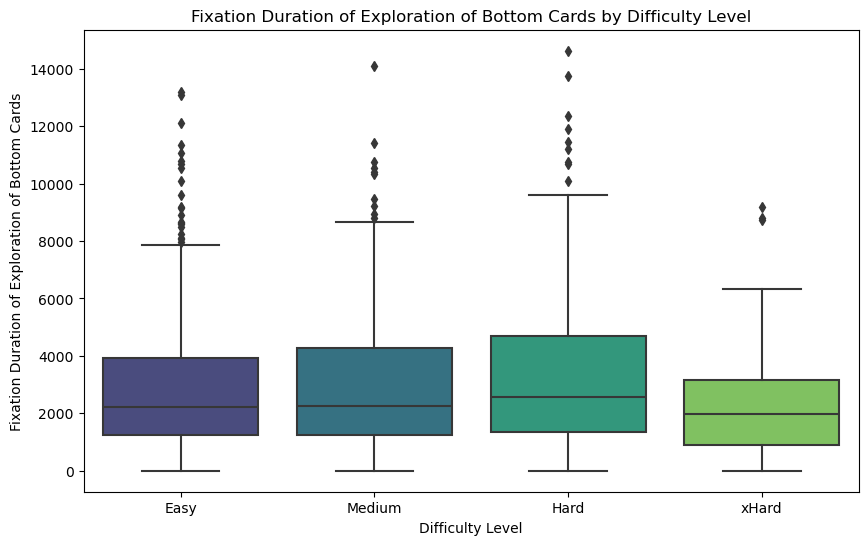

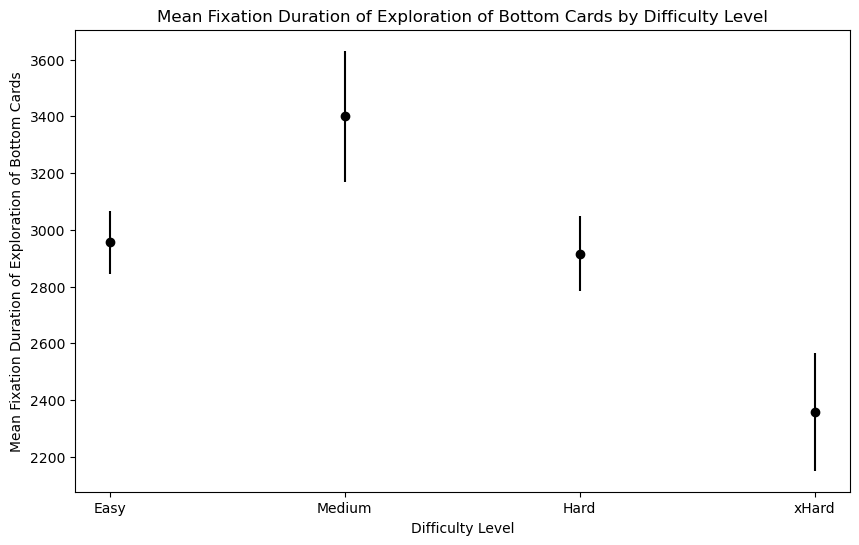

In [72]:
# durLookBottomExploration vs. difficulty
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durfixBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['durfixBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['durfixBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*durfixBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*durfixBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of Fixation duration of exploration of bottom cards by difficulty level
mean_fixationduration_by_difficulty = exploration_data.groupby('difficulty')['durfixBottom'].mean()
median_fixationduration_by_difficulty = exploration_data.groupby('difficulty')['durfixBottom'].median()
sem_fixationduration_by_difficulty = exploration_data.groupby('difficulty')['durfixBottom'].sem()

print("Mean Fixation Duration of Exploration of bottom cards by Difficulty Level:")
print(mean_fixationduration_by_difficulty)
print("Median Fixation Duration of Exploration of bottom cards by Difficulty Level:")
print(median_fixationduration_by_difficulty)
print("SEM Fixation Duration of Exploration of bottom cards by Difficulty Level:")
print(sem_fixationduration_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='durfixBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Fixation Duration of Exploration of Bottom Cards')
plt.title('Fixation Duration of Exploration of Bottom Cards by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_fixationduration_by_difficulty))
plt.errorbar(x_gaze_positions, mean_fixationduration_by_difficulty, yerr=sem_fixationduration_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Fixation Duration of Exploration of Bottom Cards')
plt.title('Mean Fixation Duration of Exploration of Bottom Cards by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

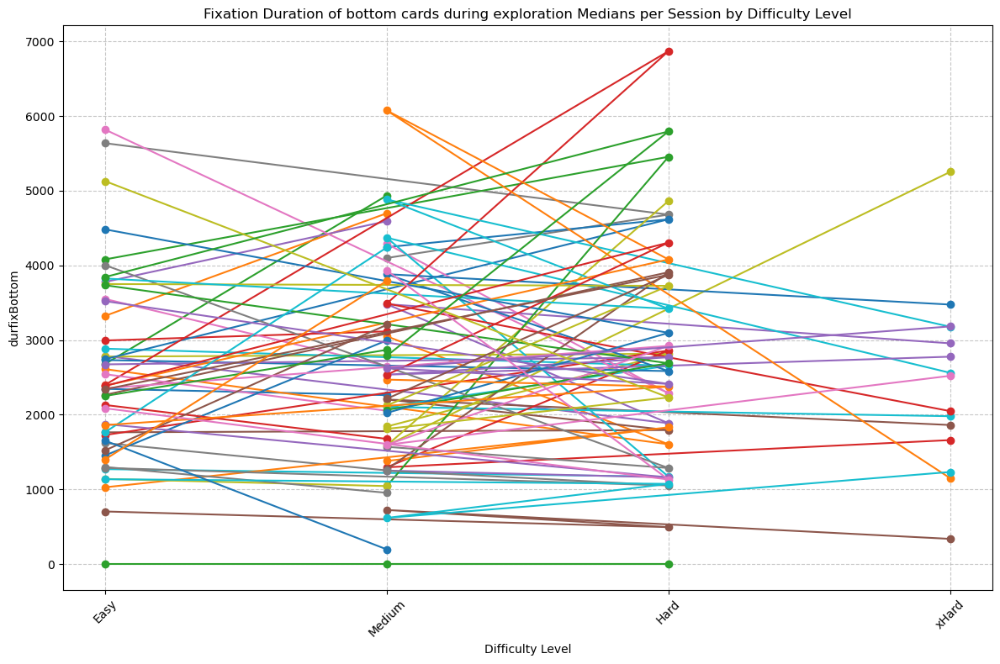

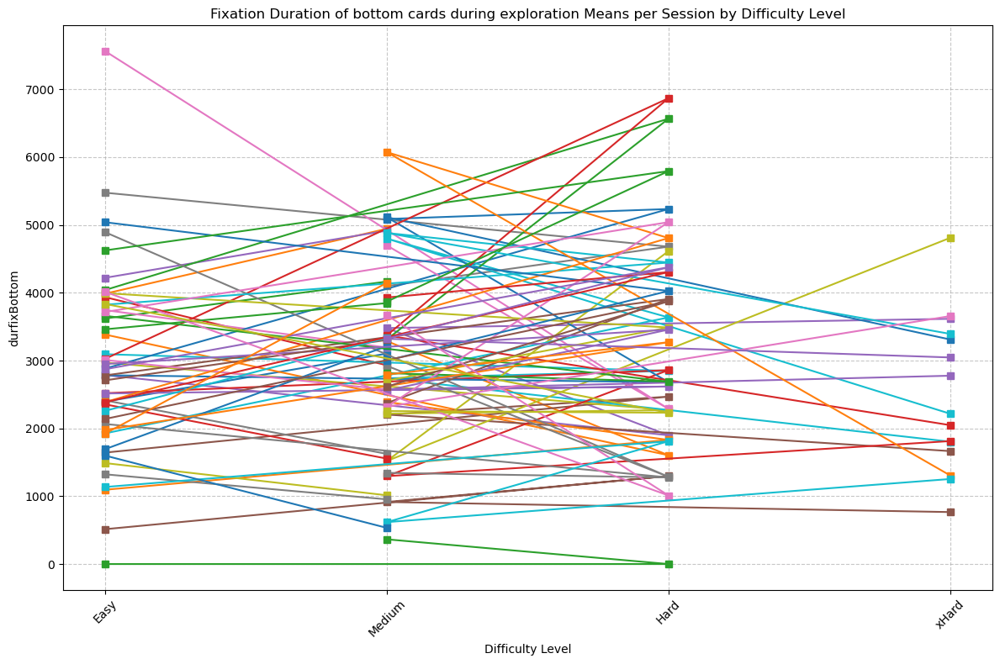

In [36]:
# durLookBottomExploration vs. difficulty per session

#Medians
session_fix_dur_exploration = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fix_dur_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixdurBottom_session = session_fix_dur_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_fixdurBottom_session.index, median_fixdurBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation Duration of bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durfixBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_dur_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fix_dur_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixdurBottom_session = session_fix_dur_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixdurBottom_session.index, mean_fixdurBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation Duration of bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durfixBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

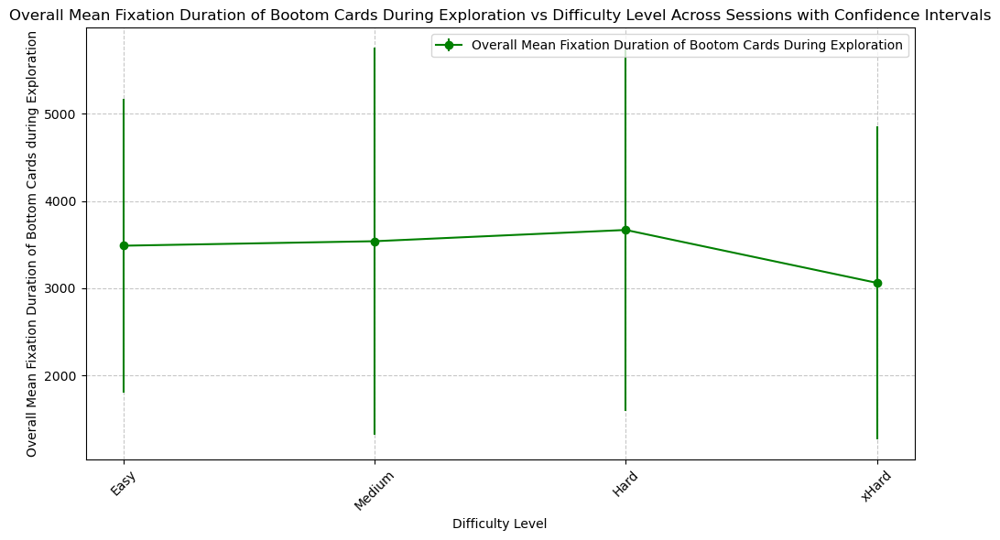

Overall Mean Fixation Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:
difficulty
Easy      3866.627168
Medium    3922.981939
Hard      4065.713403
xHard     3397.741164
dtype: float64


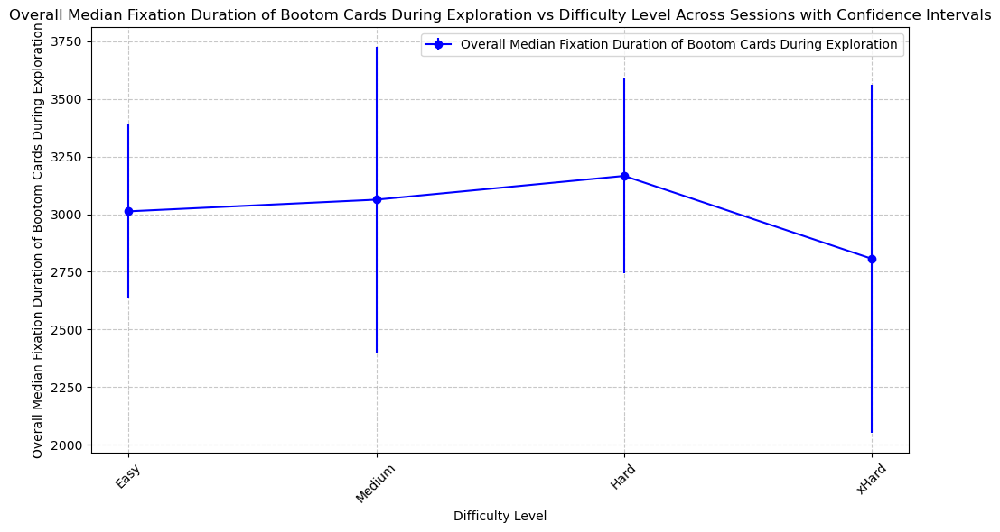


Overall Median Fixation Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:
difficulty
Easy      3012.471429
Medium    3063.101449
Hard      3166.170213
xHard     2806.473684
dtype: float64


In [28]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_durfixBottom = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].mean().unstack()
session_median_exp_durfixBottom = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].median().unstack()

overall_mean_exp_durfixBottom = session_mean_exp_durfixBottom.mean()
overall_median_exp_durfixBottom = session_median_exp_durfixBottom.mean()

overall_mean_exp_durfixBottom = overall_mean_exp_durfixBottom.reindex(difficulty_order)
overall_median_exp_durfixBottom = overall_median_exp_durfixBottom.reindex(difficulty_order)

session_std_exp_durfixBottom = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].std().unstack()
session_count_exp_durfixBottom = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_durfixBottom.mean() / np.sqrt(session_count_exp_durfixBottom.mean())

overall_conf_interval_median = 1.96 * session_median_exp_durfixBottom.std() / np.sqrt(session_median_exp_durfixBottom.count())

# Mean exploration fixation duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_durfixBottom.index, overall_mean_exp_durfixBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Duration of Bootom Cards During Exploration')
plt.title('Overall Mean Fixation Duration of Bootom Cards During Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Fixation Duration of Bottom Cards during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:")
print(overall_mean_exp_durLookBottom)

# Median exploration Fixation duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_durfixBottom.index, overall_median_exp_durfixBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Duration of Bootom Cards During Exploration')
plt.title('Overall Median Fixation Duration of Bootom Cards During Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Fixation Duration of Bootom Cards During Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Duration of Bootom Cards During Exploration per Difficulty Level Across Sessions:")
print(overall_median_exp_durfixBottom)

## Number of Switches between bottom cards (exploration period) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 1.3652075796705874e-20
Shapiro-Wilk test for Hard: p-value = 3.3575260997093865e-08
Shapiro-Wilk test for Medium: p-value = 1.3560817785586675e-15
Shapiro-Wilk test for xHard: p-value = 8.208907073026806e-09
Levene's test for homogeneity of variances: p-value = 0.0455813793625484
Kruskal-Wallis test:
H-statistic: 9.087467066600466
p-value: 0.028150286831524967
Mean NbSwitches during exploration by Difficulty Level:
difficulty
Easy      2.202643
Hard      2.490798
Medium    2.253125
xHard     1.989247
Name: NbSwitches, dtype: float64
Median NbSwitches during exploration by Difficulty Level:
difficulty
Easy      2.0
Hard      2.0
Medium    2.0
xHard     2.0
Name: NbSwitches, dtype: float64
SEM NbSwitches during exploration by Difficulty Level:
difficulty
Easy      0.060039
Hard      0.119127
Medium    0.078840
xHard     0.127455
Name: NbSwitches, dtype: float64


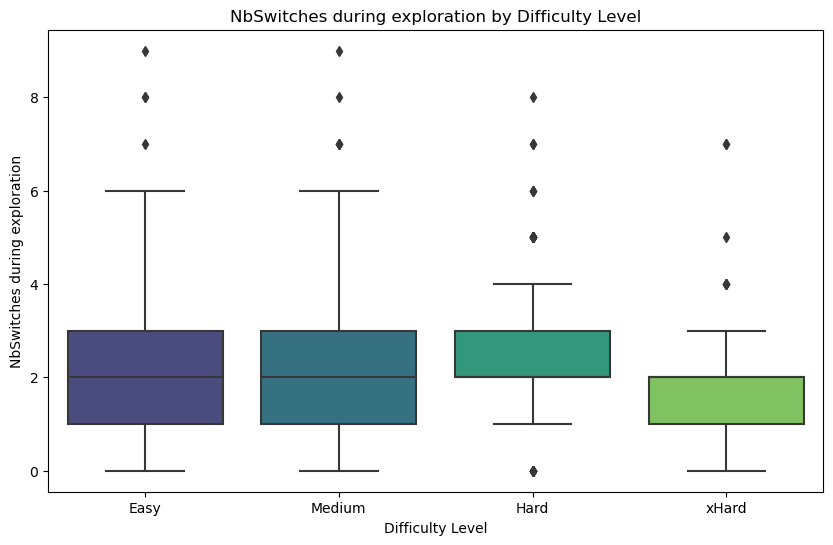

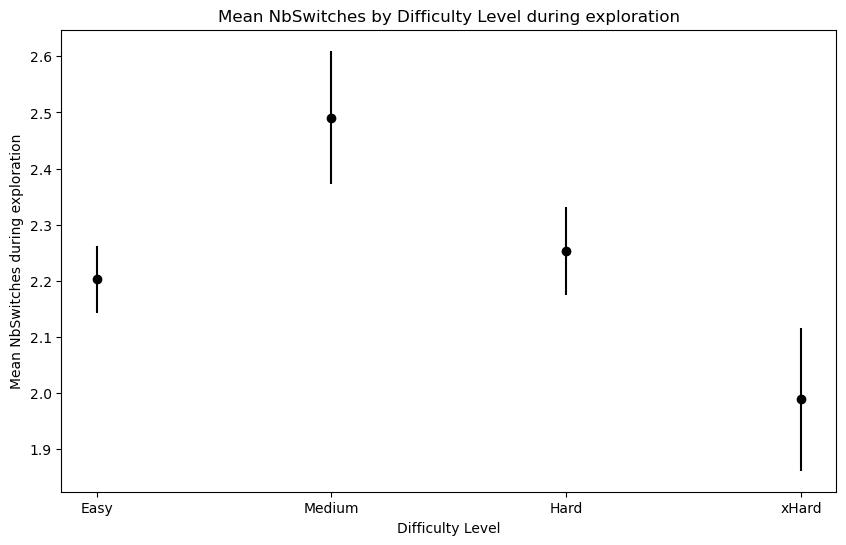

In [73]:
# Number of Switches between bottom cards (exploration) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

NbSwitches_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['NbSwitches'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].mean()
median_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].median()
sem_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].sem()

print("Mean NbSwitches during exploration by Difficulty Level:")
print(mean_NbSwitches_by_difficulty)
print("Median NbSwitches during exploration by Difficulty Level:")
print(median_NbSwitches_by_difficulty)
print("SEM NbSwitches during exploration by Difficulty Level:")
print(sem_NbSwitches_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='NbSwitches', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches during exploration')
plt.title('NbSwitches during exploration by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_sw_positions = np.arange(len(mean_NbSwitches_by_difficulty))
plt.errorbar(x_sw_positions, mean_NbSwitches_by_difficulty, yerr=sem_NbSwitches_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean NbSwitches during exploration')
plt.title('Mean NbSwitches by Difficulty Level during exploration')
plt.xticks(x_sw_positions, difficulty_order)
plt.show()

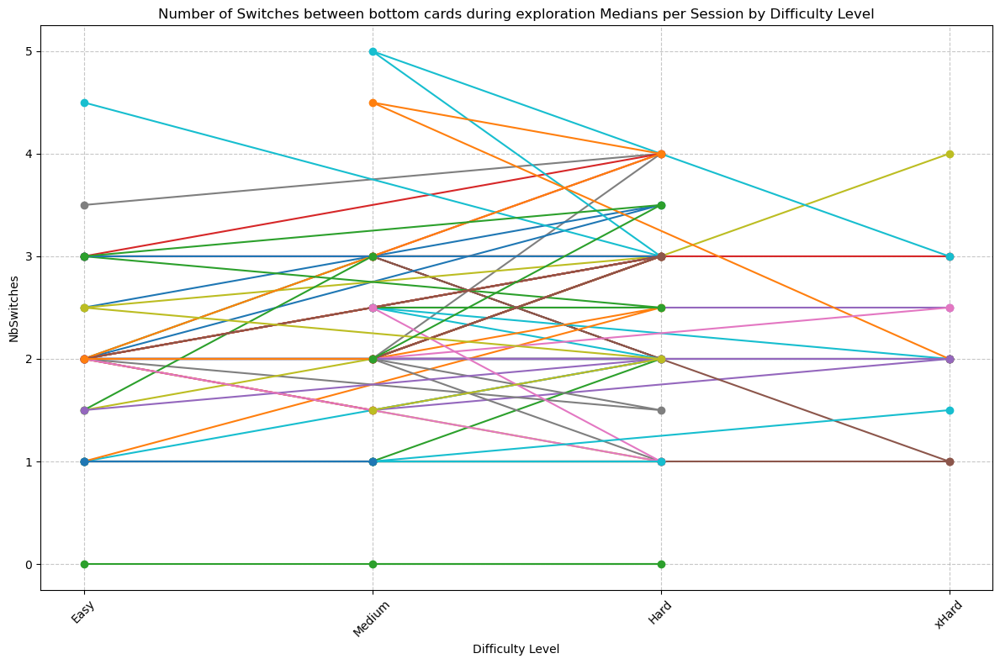

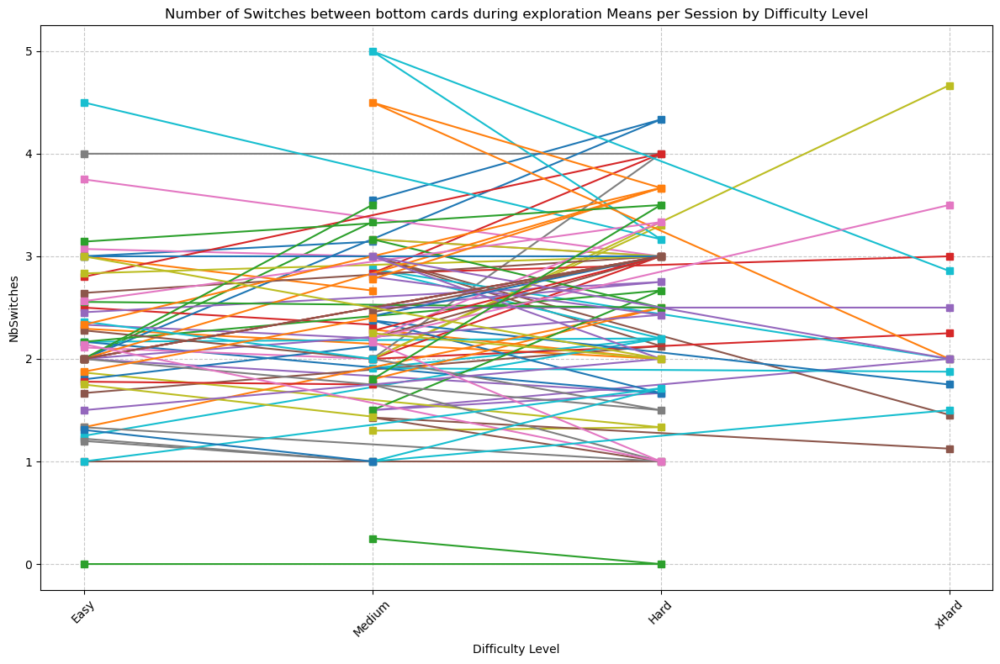

In [38]:
# Number of Switches between bottom cards (exploration) vs. difficulty level per session

#Medians
session_switches_exploration = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_switches_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_switches_session = session_switches_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_switches_session.index, median_switches_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Number of Switches between bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_switches_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_switches_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_switches_session = session_switches_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_switches_session.index, mean_switches_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Number of Switches between bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

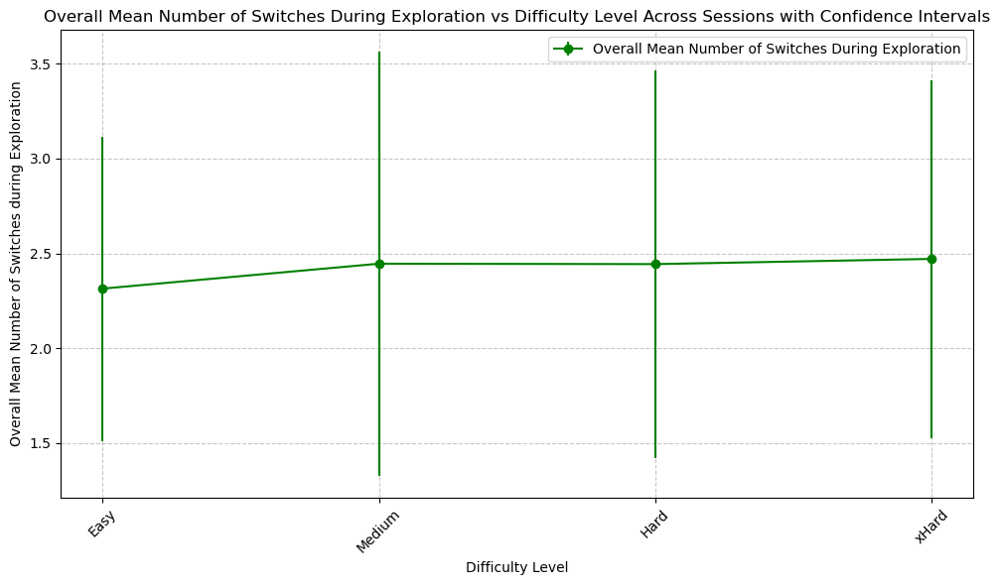

Overall Mean Number of Switches During Exploration per Difficulty Level Across Sessions:
difficulty
Easy      2.314106
Medium    2.445462
Hard      2.443311
xHard     2.470720
dtype: float64


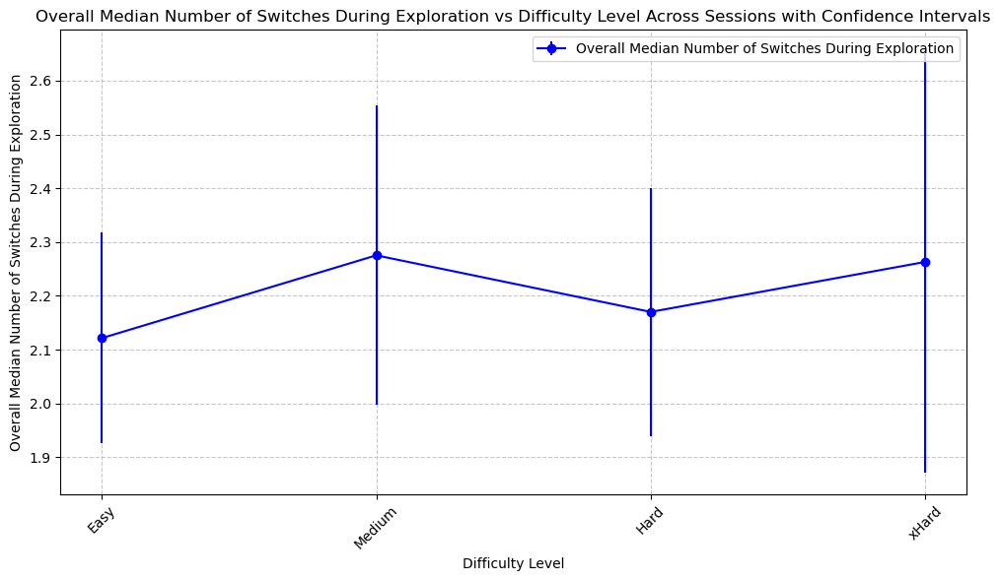


Overall Median Number of Switches During Exploration per Difficulty Level Across Sessions:
difficulty
Easy      2.121429
Medium    2.275362
Hard      2.170213
xHard     2.263158
dtype: float64


In [29]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_NbSwitches = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].mean().unstack()
session_median_exp_NbSwitches = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

overall_mean_exp_NbSwitches = session_mean_exp_NbSwitches.mean()
overall_median_exp_NbSwitches = session_median_exp_NbSwitches.mean()

overall_mean_exp_NbSwitches = overall_mean_exp_NbSwitches.reindex(difficulty_order)
overall_median_exp_NbSwitches = overall_median_exp_NbSwitches.reindex(difficulty_order)

session_std_exp_NbSwitches = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].std().unstack()
session_count_exp_NbSwitches = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_NbSwitches.mean() / np.sqrt(session_count_exp_NbSwitches.mean())

overall_conf_interval_median = 1.96 * session_median_exp_NbSwitches.std() / np.sqrt(session_median_exp_NbSwitches.count())

# Mean exploration NbSwitches during exploration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_NbSwitches.index, overall_mean_exp_NbSwitches.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Number of Switches During Exploration')
plt.title('Overall Mean Number of Switches During Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Number of Switches during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Number of Switches During Exploration per Difficulty Level Across Sessions:")
print(overall_mean_exp_NbSwitches)

# Median NbSwitches during exploration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_NbSwitches.index, overall_median_exp_NbSwitches.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Number of Switches During Exploration')
plt.title('Overall Median Number of Switches During Exploration vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Number of Switches During Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Number of Switches During Exploration per Difficulty Level Across Sessions:")
print(overall_median_exp_NbSwitches)

## Total number of Switches (both periods) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 1.7981333860755233e-29
Shapiro-Wilk test for Hard: p-value = 1.0701636790254585e-17
Shapiro-Wilk test for Medium: p-value = 8.612378706802515e-26
Shapiro-Wilk test for xHard: p-value = 6.430551670615763e-14
Levene's test for homogeneity of variances: p-value = 0.012961787568935219
Kruskal-Wallis test:
H-statistic: 2.6976872522602395
p-value: 0.4406204646998817
Mean NbSwitches by Difficulty Level:
difficulty
Easy      1.354626
Hard      1.481595
Medium    1.339063
xHard     1.220430
Name: NbSwitches, dtype: float64
Median NbSwitches by Difficulty Level:
difficulty
Easy      1.0
Hard      1.0
Medium    1.0
xHard     1.0
Name: NbSwitches, dtype: float64
SEM NbSwitches by Difficulty Level:
difficulty
Easy      0.043324
Hard      0.084549
Medium    0.055670
xHard     0.089877
Name: NbSwitches, dtype: float64


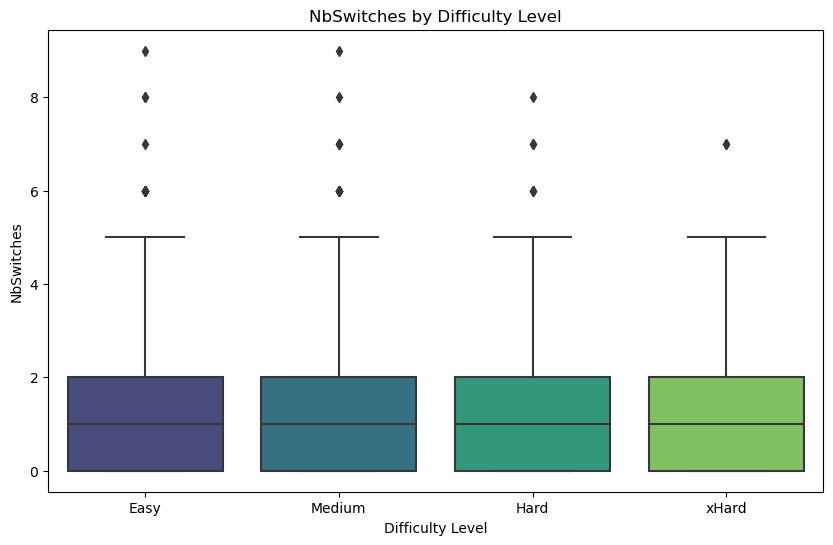

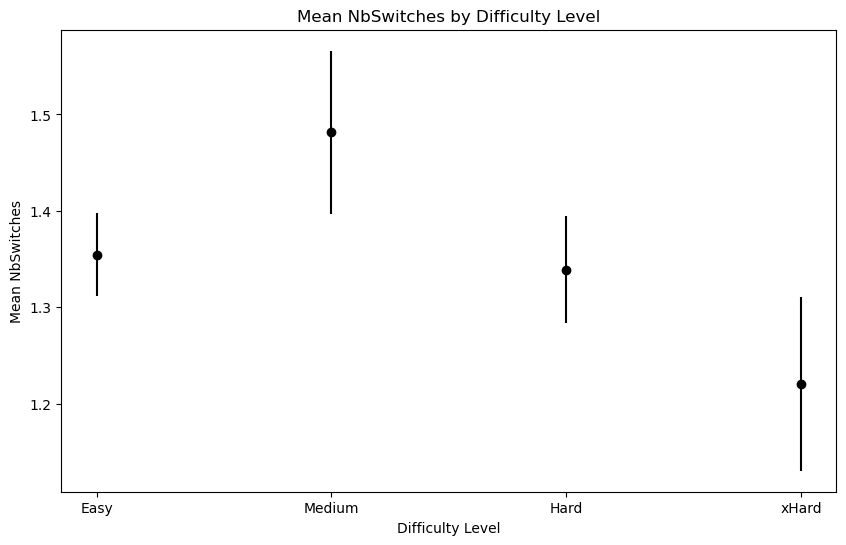

In [74]:
# Number of Switches between bottom cards (total - both periods) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

NbSwitches_by_difficulty = [data[data['difficulty'] == level]['NbSwitches'] for level in data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('difficulty')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total switches between bottom cards by difficulty level
mean_NbSwitches_by_difficulty = data.groupby('difficulty')['NbSwitches'].mean()
median_NbSwitches_by_difficulty = data.groupby('difficulty')['NbSwitches'].median()
sem_NbSwitches_by_difficulty = data.groupby('difficulty')['NbSwitches'].sem()

print("Mean NbSwitches by Difficulty Level:")
print(mean_NbSwitches_by_difficulty)
print("Median NbSwitches by Difficulty Level:")
print(median_NbSwitches_by_difficulty)
print("SEM NbSwitches by Difficulty Level:")
print(sem_NbSwitches_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='NbSwitches', data=data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.title('NbSwitches by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_sw_positions = np.arange(len(mean_NbSwitches_by_difficulty))
plt.errorbar(x_sw_positions, mean_NbSwitches_by_difficulty, yerr=sem_NbSwitches_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean NbSwitches')
plt.title('Mean NbSwitches by Difficulty Level')
plt.xticks(x_sw_positions, difficulty_order)
plt.show()

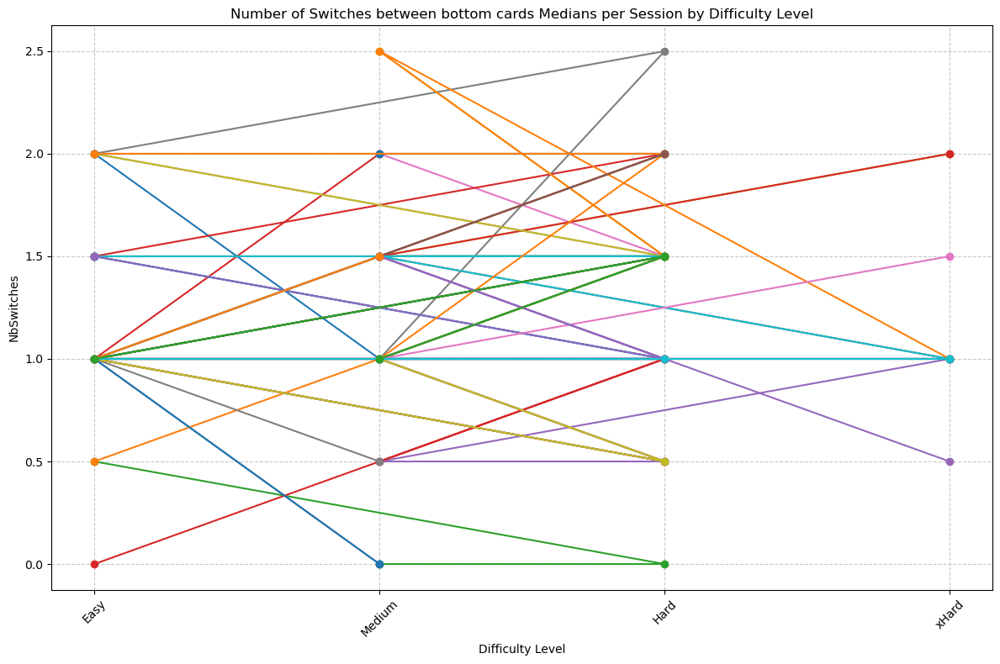

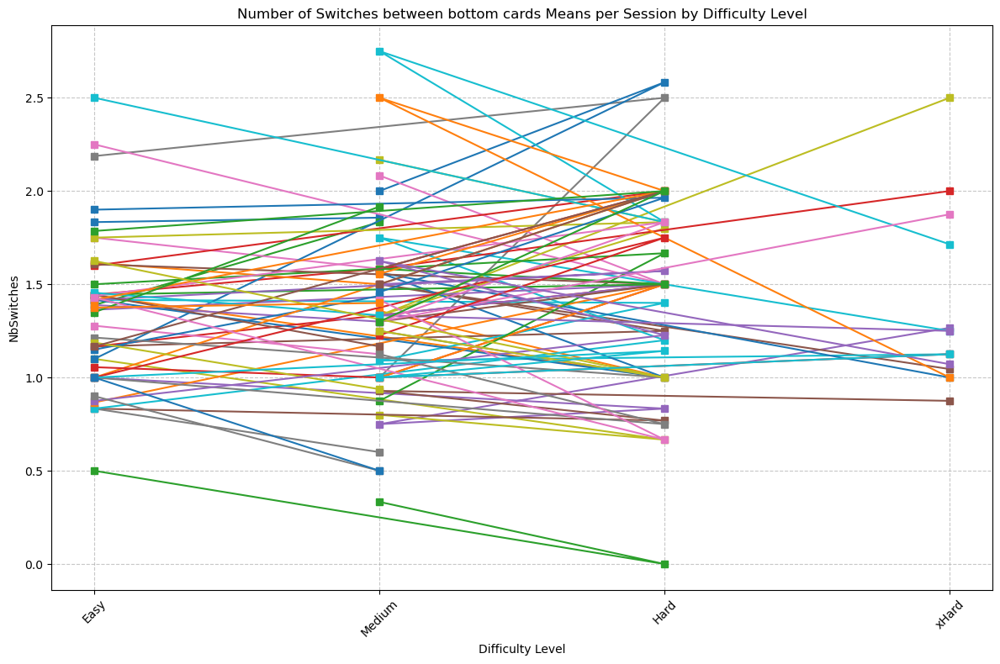

In [40]:
# Number of Switches between bottom cards (both periods) vs. difficulty level per session

#Medians
session_switches = data.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_switches.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_switches_session = session_switches.loc[session][available_difficulty_levels]
        plt.plot(median_switches_session.index, median_switches_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Number of Switches between bottom cards Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_switches_mean = data.groupby(['session', 'difficulty'])['NbSwitches'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_switches_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_switches_session = session_switches_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_switches_session.index, mean_switches_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Number of Switches between bottom cards Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

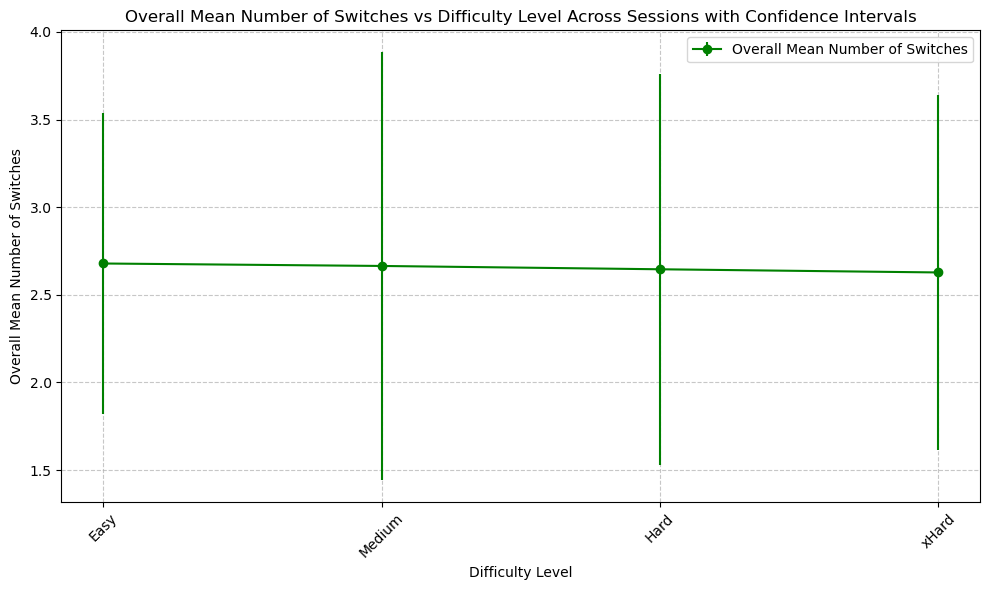

Overall Mean Number of Switches per Difficulty Level Across Sessions:
difficulty
Easy      2.678478
Medium    2.664443
Hard      2.645514
xHard     2.627381
dtype: float64


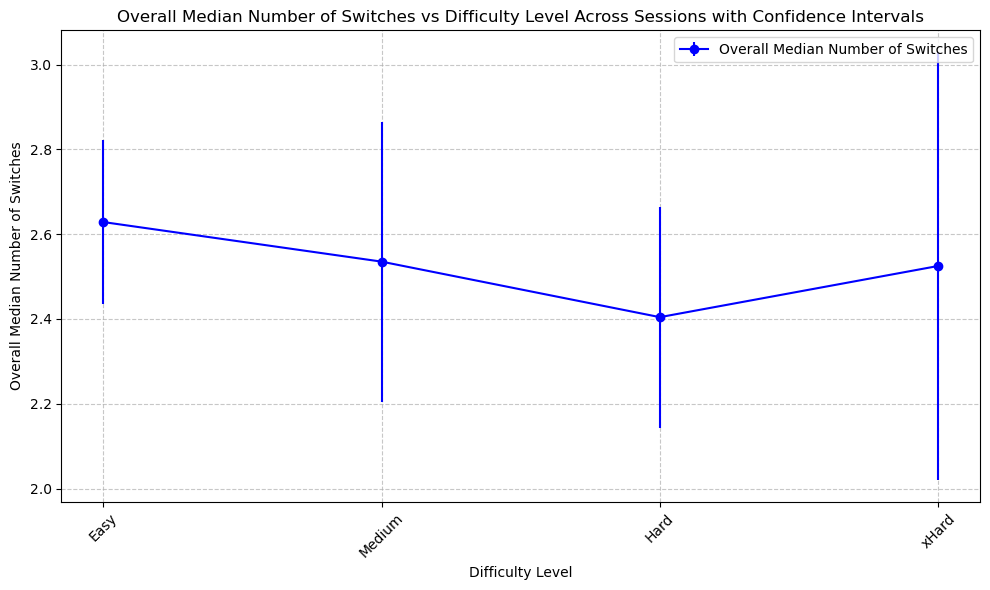


Overall Median Number of Switches per Difficulty Level Across Sessions:
difficulty
Easy      2.628571
Medium    2.535211
Hard      2.404255
xHard     2.525000
dtype: float64


In [30]:
# Means and medians across sessions (first session by session, then medians/ means of that)

NbSwitches_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()

session_mean_NbSwitches = NbSwitches_per_trial.groupby(['session', 'difficulty'])['NbSwitches'].mean().unstack()
session_median_NbSwitches = NbSwitches_per_trial.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

overall_mean_NbSwitches = session_mean_NbSwitches.mean()
overall_median_NbSwitches = session_median_NbSwitches.mean()

overall_mean_NbSwitches = overall_mean_NbSwitches.reindex(difficulty_order)
overall_median_NbSwitches = overall_median_NbSwitches.reindex(difficulty_order)

session_std_NbSwitches = NbSwitches_per_trial.groupby(['session', 'difficulty'])['NbSwitches'].std().unstack()
session_count_NbSwitches= NbSwitches_per_trial.groupby(['session', 'difficulty'])['NbSwitches'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_NbSwitches.mean() / np.sqrt(session_count_NbSwitches.mean())

overall_conf_interval_median = 1.96 * session_median_NbSwitches.std() / np.sqrt(session_median_NbSwitches.count())

# Mean NbSwitches across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_NbSwitches.index, overall_mean_NbSwitches.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Number of Switches')
plt.title('Overall Mean Number of Switches vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Mean Number of Switches')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Overall Mean Number of Switches per Difficulty Level Across Sessions:")
print(overall_mean_NbSwitches)

# Median NbSwitches across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_NbSwitches.index, overall_median_NbSwitches.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Number of Switches')
plt.title('Overall Median Number of Switches vs Difficulty Level Across Sessions with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Overall Median Number of Switches')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\nOverall Median Number of Switches per Difficulty Level Across Sessions:")
print(overall_median_NbSwitches)

## Side chosen

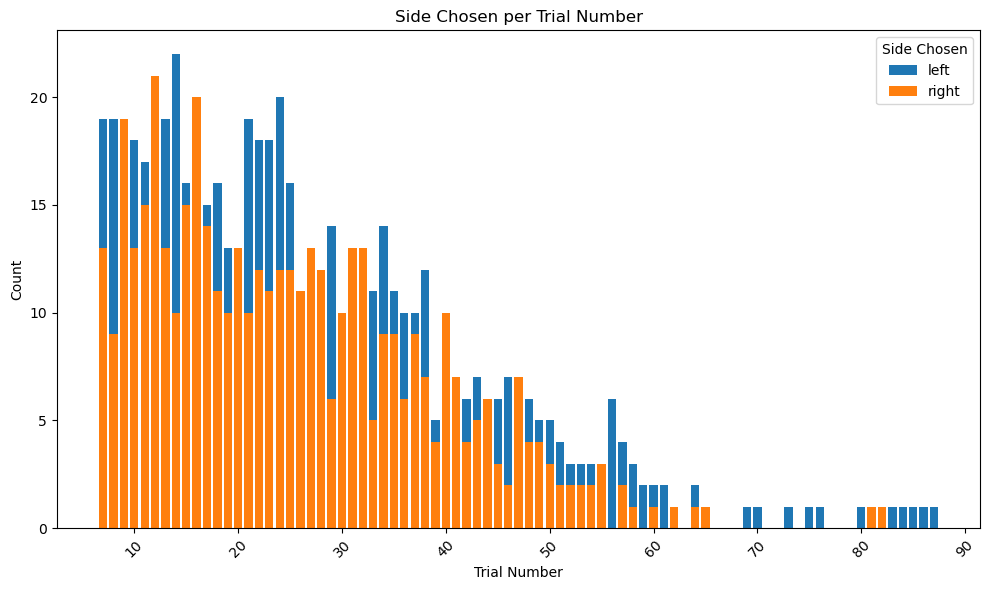

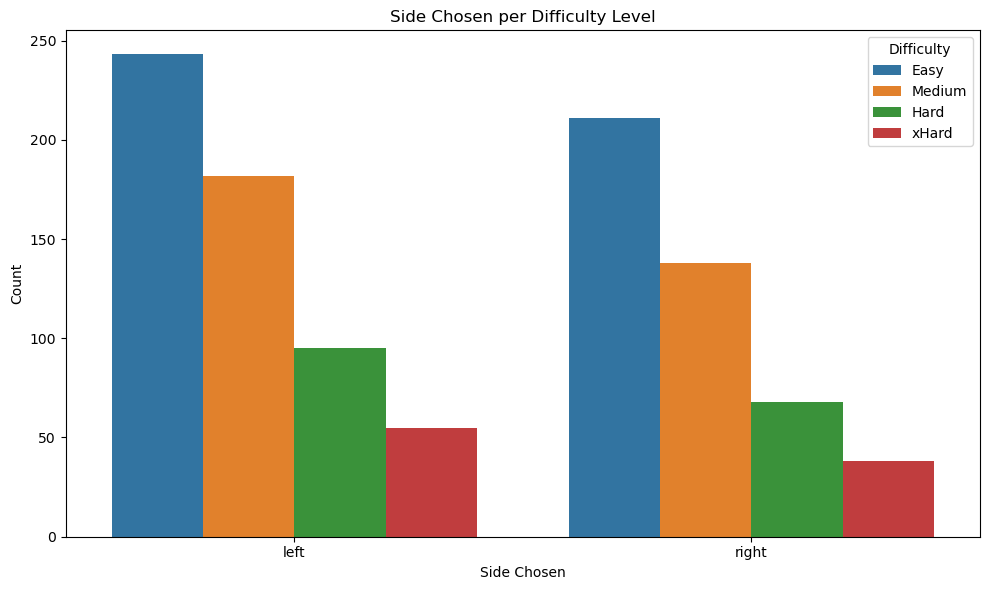

In [41]:
# Is there a tendency to choose a side?

# Plot: side chosen per trial number

agg_data = decision_data.groupby(['trialno', 'sideChosen']).size().unstack(fill_value=0).reset_index()

plt.figure(figsize=(10, 6))
for side in ['left', 'right']:
    plt.bar(agg_data['trialno'], agg_data[side], label=side)
    
plt.title('Side Chosen per Trial Number')
plt.xlabel('Trial Number')
plt.ylabel('Count')
plt.legend(title='Side Chosen', loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot: side chosen per difficulty level
plt.figure(figsize=(10, 6))
sns.countplot(data=decision_data, x='sideChosen', hue='difficulty')
plt.title('Side Chosen per Difficulty Level')
plt.xlabel('Side Chosen')
plt.ylabel('Count')
plt.legend(title='Difficulty')
plt.tight_layout()
plt.show()

# Distributions

## Total trial duration vs. Difficulty Level

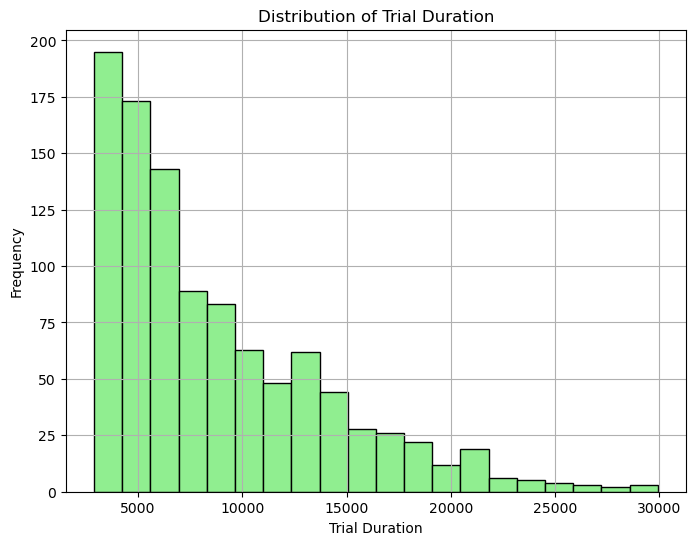

Data does not look approximately normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


Best fit distribution: weibull_min


C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3688109884.py:32: RuntimeWarning: divide by zero encountered in log
  metric = -2 * np.log(p)


In [196]:
# Distribution of trial duration

trial_duration_data = trial_duration.groupby(['session', 'trialno'])['durPeriodTotal'].sum()

plt.figure(figsize=(8, 6))
plt.hist(trial_duration_data, bins=20, color='lightgreen', edgecolor='black')
plt.title('Distribution of Trial Duration')
plt.xlabel('Trial Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Check distribution using Kruskal-Wallis test
stat, p = kruskal(*[group.values for _, group in trial_duration_data.groupby(level=0)])

alpha = 0.05
if p > alpha:
    print("Data looks like it could be approximately normally distributed (fail to reject H0)")
else:
    print("Data does not look approximately normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']

best_fit_name = None
best_fit_params = {}
best_fit_metric = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(trial_duration_data)
    _, p = stats.kstest(trial_duration_data, distribution_name, args=params)
    metric = -2 * np.log(p) 
    if metric < best_fit_metric:
        best_fit_name = distribution_name
        best_fit_params = params
        best_fit_metric = metric

print(f"Best fit distribution: {best_fit_name}")

## Duration of exploration and decision periods vs. Difficulty Level

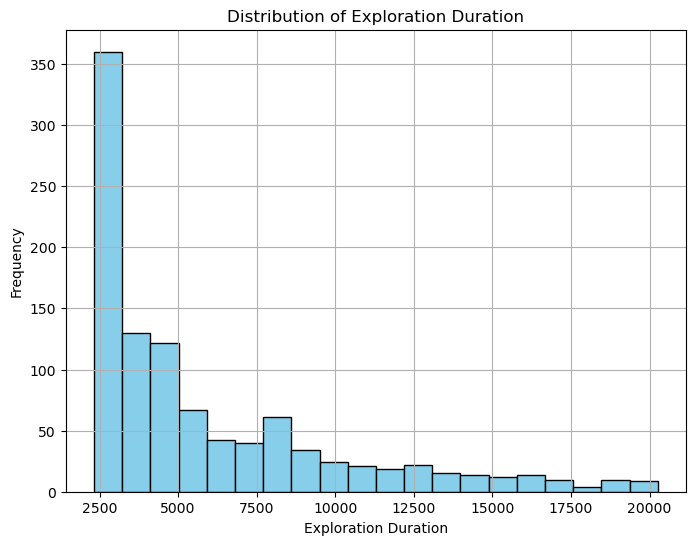

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


Best fit distribution: beta


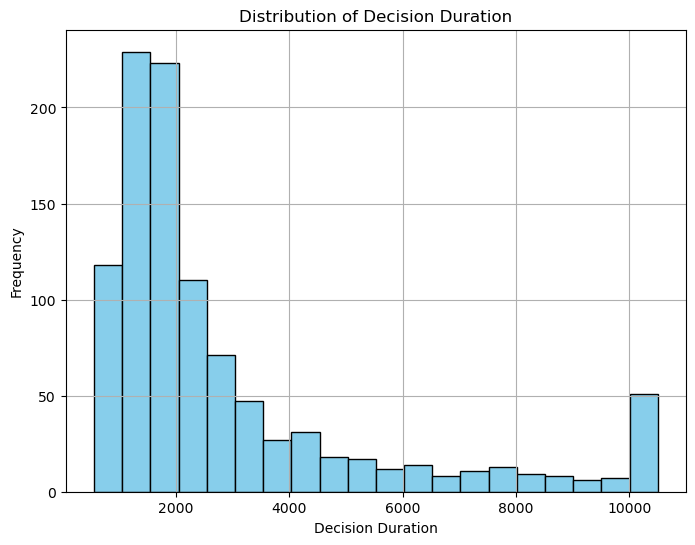

Data does not look normally distributed (reject H0)
Best fit distribution: lognorm


In [96]:
# Distribution of Exploration Duration

data_exploration = exploration_data['durPeriodTotal']

plt.figure(figsize=(8, 6))
plt.hist(data_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Exploration Duration')
plt.xlabel('Exploration Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_exploration)
    kstest_stat, _ = stats.kstest(data_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

# Distribution of Decision Duration

data_Decision = decision_data['durPeriodTotal']

plt.figure(figsize=(8, 6))
plt.hist(data_Decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Decision Duration')
plt.xlabel('Decision Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_Decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_Decision)
    kstest_stat, _ = stats.kstest(data_Decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Look duration of bottom images (exploration period)

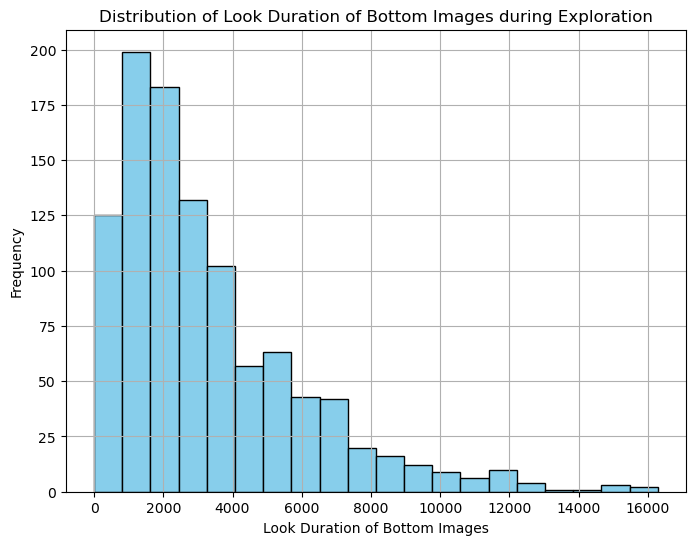

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [99]:
# Distribution of Look duration of bottom images during exploration period

data_look_exploration = exploration_data['durLookBottom']

plt.figure(figsize=(8, 6))
plt.hist(data_look_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Look Duration of Bottom Images during Exploration')
plt.xlabel('Look Duration of Bottom Images')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_look_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_look_exploration)
    kstest_stat, _ = stats.kstest(data_look_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Look Duration of Top card (decision period)

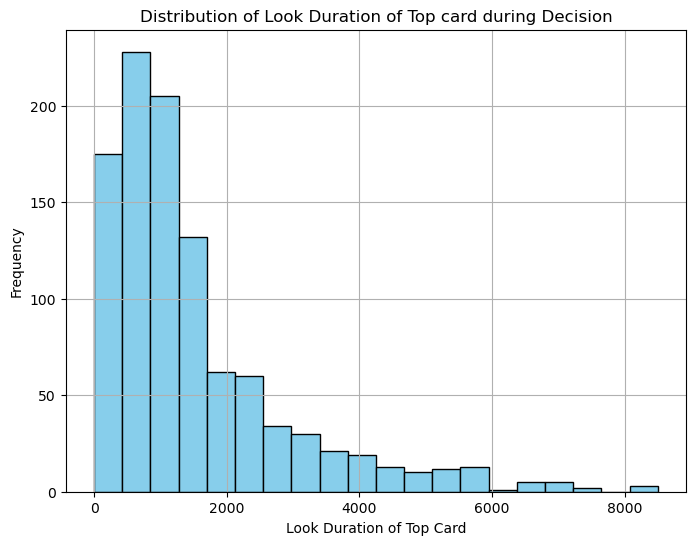

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


In [100]:
# Distribution of Look duration of top card during decision period

data_look_decision = decision_data['LookTotDurInT']

plt.figure(figsize=(8, 6))
plt.hist(data_look_decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Look Duration of Top card during Decision')
plt.xlabel('Look Duration of Top Card')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_look_decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_look_decision)
    kstest_stat, _ = stats.kstest(data_look_decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Fixation Duration of Bottom Cards (Exploration Period)

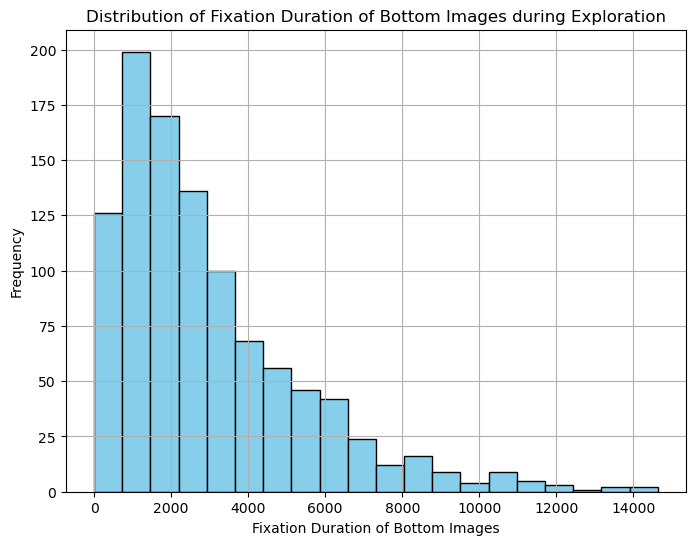

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [101]:
# Distribution of Fixation duration of bottom images during exploration period

data_fix_exploration = exploration_data['durfixBottom']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Duration of Bottom Images during Exploration')
plt.xlabel('Fixation Duration of Bottom Images')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_exploration)
    kstest_stat, _ = stats.kstest(data_fix_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Fixation Duration of Top card (Decision Period)

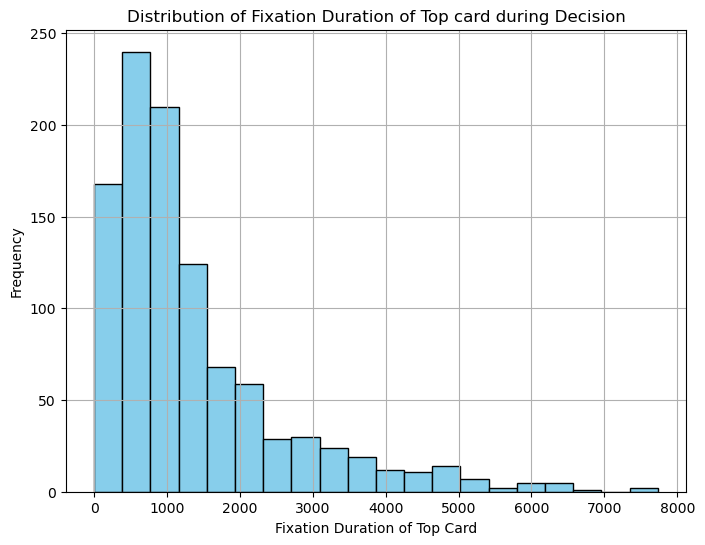

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


In [102]:
# Distribution of Fixation duration of top card during decision period

data_fix_decision = decision_data['FixTotDurInT']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Duration of Top card during Decision')
plt.xlabel('Fixation Duration of Top Card')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_decision)
    kstest_stat, _ = stats.kstest(data_fix_decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Total Number of fixations

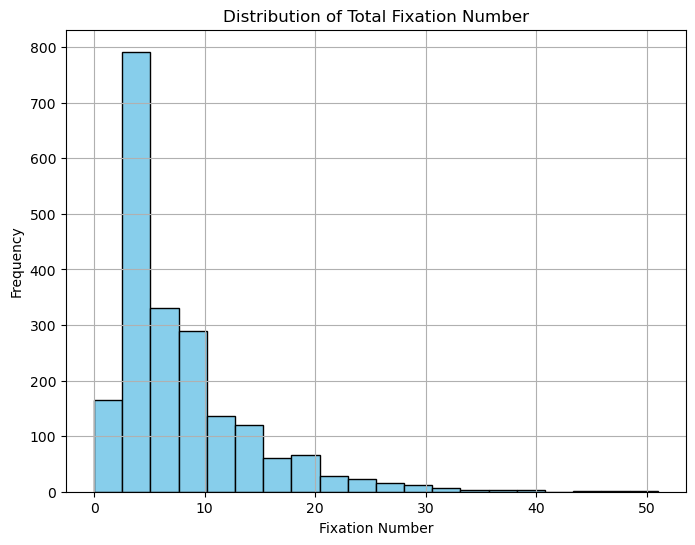

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: beta


In [103]:
# Distribution of Total Fixation Number

data_fixation = data['FixNb']

plt.figure(figsize=(8, 6))
plt.hist(data_fixation, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Total Fixation Number')
plt.xlabel('Fixation Number')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fixation)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fixation)
    kstest_stat, _ = stats.kstest(data_fixation, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of fixations for exploration and decision periods

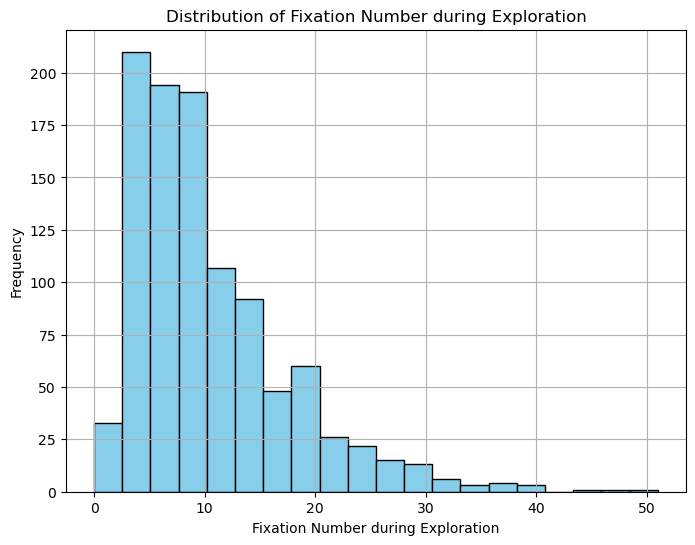

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


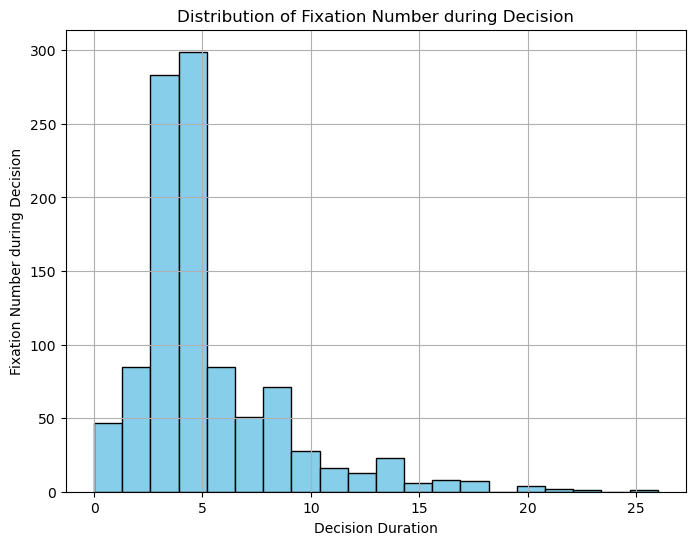

Data does not look normally distributed (reject H0)
Best fit distribution: gamma


In [104]:
# Distribution of Fixation Number for the exploration period

data_exploration = exploration_data['FixNb']

plt.figure(figsize=(8, 6))
plt.hist(data_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number during Exploration')
plt.xlabel('Fixation Number during Exploration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_exploration)
    kstest_stat, _ = stats.kstest(data_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

# Distribution of Fixation Number for the decision period

data_Decision = decision_data['FixNb']

plt.figure(figsize=(8, 6))
plt.hist(data_Decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number during Decision')
plt.xlabel('Decision Duration')
plt.ylabel('Fixation Number during Decision')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_Decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_Decision)
    kstest_stat, _ = stats.kstest(data_Decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of fixations of bottom cards during exploration

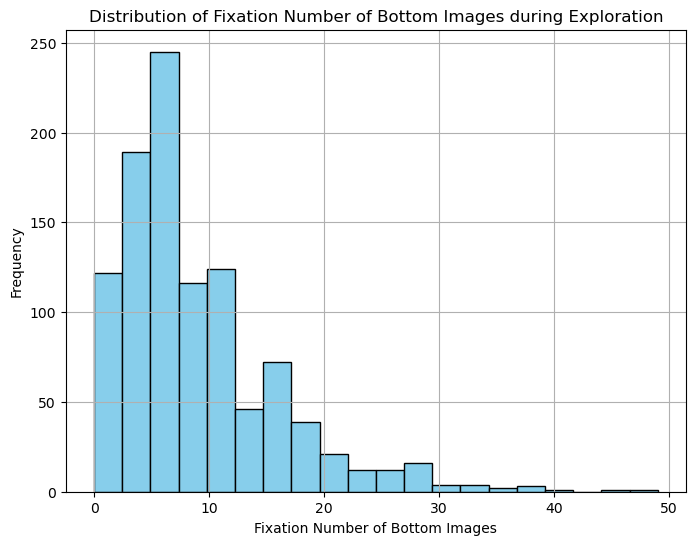

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


In [105]:
# Distribution of Fixation duration of bottom images during exploration period

data_fix_exploration = exploration_data['FixNbInBottom']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number of Bottom Images during Exploration')
plt.xlabel('Fixation Number of Bottom Images')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_exploration)
    kstest_stat, _ = stats.kstest(data_fix_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of fixations of top card during decision

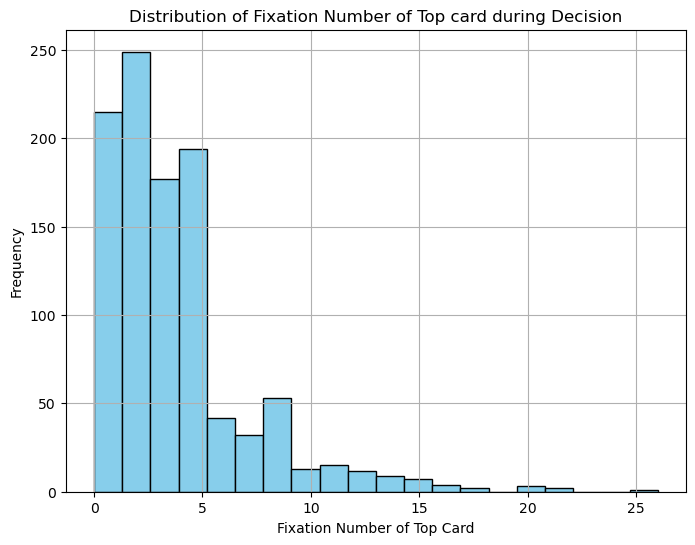

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [106]:
# Distribution of Fixation Number of top card during decision period

data_fix_decision = decision_data['FixNbInT']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number of Top card during Decision')
plt.xlabel('Fixation Number of Top Card')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_decision)
    kstest_stat, _ = stats.kstest(data_fix_decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Total Number of Switches

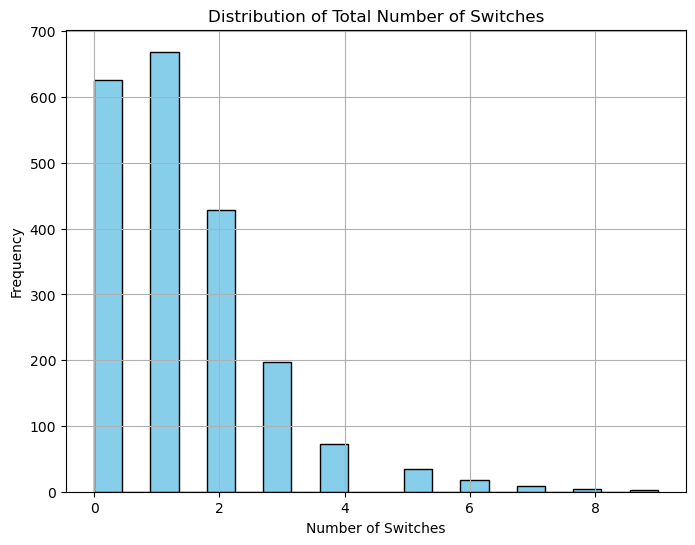

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: expon


In [107]:
# Distribution of Total Number of Switches

data_switches = data['NbSwitches']

plt.figure(figsize=(8, 6))
plt.hist(data_switches, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Total Number of Switches')
plt.xlabel('Number of Switches')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_switches)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_switches)
    kstest_stat, _ = stats.kstest(data_switches, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of Switches (Exploration period)

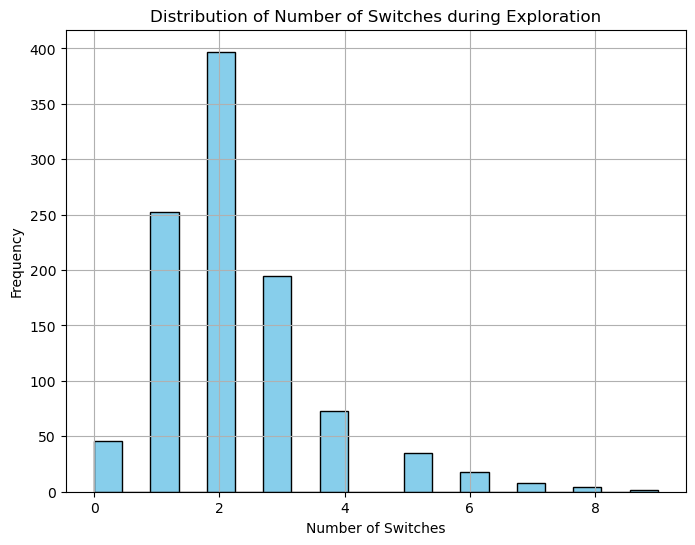

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [108]:
# Distribution of Fixation duration of bottom images during exploration period

data_switches_exploration = exploration_data['NbSwitches']

plt.figure(figsize=(8, 6))
plt.hist(data_switches_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Number of Switches during Exploration')
plt.xlabel('Number of Switches')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_switches_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_switches_exploration)
    kstest_stat, _ = stats.kstest(data_switches_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

# Modeling 

## Dataset per trial (not per period)

In [6]:
# DF DATA PER TRIAL

# Exploration period duration
exploration_df = data[data['period_in_trial'] == 'exploration']
durExplorationTotal_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()
durExplorationTotal_df.rename(columns={'durPeriodTotal': 'durExplorationPeriod'}, inplace=True)                                              

# Decision period duration
decision_df = data[data['period_in_trial'] == 'decision']
durDecisionTotal_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['durPeriodTotal'].sum().reset_index()
durDecisionTotal_df.rename(columns={'durPeriodTotal': 'durDecisionPeriod'}, inplace=True)

# Trial duration
trialduration_df = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

# Accuracy
decision_df = data[data['period_in_trial'] == 'decision']
accuracy_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['accuracy'].sum().reset_index()

# Side Chosen
decision_df = data[data['period_in_trial'] == 'decision']
sideChosen_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['sideChosen'].sum().reset_index()

#Number of switches during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
SwitchesExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesExploration_df.rename(columns={'NbSwitches': 'SwitchesExplorationPeriod'}, inplace=True)   

#Number of switches during decision period
decision_df = data[data['period_in_trial'] == 'decision']
SwitchesDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesDecision_df.rename(columns={'NbSwitches': 'SwitchesDecisionPeriod'}, inplace=True)   

#Number of switches in total
SwitchesTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()

#Fixation number during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixNbExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbExploration_df.rename(columns={'FixNb': 'FixNbExplorationPeriod'}, inplace=True)   

#Fixation number during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixNbDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbDecision_df.rename(columns={'FixNb': 'FixNbDecisionPeriod'}, inplace=True)   

#Fixation number in total
FixNbTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

#Fixation number in top card during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixNbTD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTD_df.rename(columns={'FixNbInT': 'FixNbInTDecision'}, inplace=True)   

#Fixation number in top card during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixNbTE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTE_df.rename(columns={'FixNbInT': 'FixNbInTExploration'}, inplace=True) 

#Fixation number in Bottom cards during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixNbBottom_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()
FixNbBottom_df.rename(columns={'FixNbInBottom': 'FixNbInBottomExploration'}, inplace=True)

#Fixation number in Bottom during both periods
FixNbBottomTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

#Fixation number in Top during both periods
FixNbInTTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()

# Look total duration in top card during decision period
decision_df = data[data['period_in_trial'] == 'decision']
LookDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTDecision_df.rename(columns={'LookTotDurInT': 'LookDurInTDecision'}, inplace=True)   

# Look total duration in top card during exploration period
exploration_df = data[data['period_in_trial'] == 'decision']
LookDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTExploration_df.rename(columns={'LookTotDurInT': 'LookDurInTExploration'}, inplace=True)  

# Look total duration in bottom cards during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
LookDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBE_df.rename(columns={'durLookBottom': 'durLookBottomExploration'}, inplace=True)

# Look total duration in bottom cards during decision period
decision_df = data[data['period_in_trial'] == 'decision']
LookDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBD_df.rename(columns={'durLookBottom': 'durLookBottomDecision'}, inplace=True)

# Look total duration in Bottom cards during both periods
LookDurBottomTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Look total duration in Top Card during both periods
LookDurTopTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()

# Fixation duration of top card during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTDecision_df.rename(columns={'FixTotDurInT': 'FixDurInTDecision'}, inplace=True)   

# Fixation duration of top card during exploration period
exploration_df = data[data['period_in_trial'] == 'decision']
FixDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTExploration_df.rename(columns={'FixTotDurInT': 'FixDurInTExploration'}, inplace=True)  

# Fixation duration of bottom cards during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBE_df.rename(columns={'durfixBottom': 'durfixBottomExploration'}, inplace=True)

# Fixation duration of bottom cards during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBD_df.rename(columns={'durfixBottom': 'durfixBottomDecision'}, inplace=True)

# Fixation duration of Bottom cards during both periods
FixDurBottomTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()

# Fixation duration of Top card during both periods
FixDurTopTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()

merged_filtered_data = accuracy_df.merge(sideChosen_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(trialduration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durExplorationTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durDecisionTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(SwitchesTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(FixNbExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottom_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbInTTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(LookDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')


merged_filtered_data = merged_filtered_data.merge(FixDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.dropna() 
merged_filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,durLookBottomExploration,durLookBottomDecision,durLookBottom,LookTotDurInT,FixDurInTDecision,FixDurInTExploration,durfixBottomExploration,durfixBottomDecision,durfixBottom,FixTotDurInT
0,curE002a,8,Easy,0.0,left,12194,11270.0,924.0,6,6.0,...,5480.0,536.0,6016,1208,298.0,298.0,4952.0,536.0,5488,1148
1,curE002a,9,Easy,1.0,left,4680,2498.0,2182.0,2,2.0,...,1670.0,530.0,2200,2176,1466.0,1466.0,1468.0,470.0,1938,1942
2,curE002a,10,Easy,1.0,right,12826,9912.0,2914.0,4,3.0,...,2658.0,106.0,2764,2020,798.0,798.0,2546.0,364.0,2910,1774
3,curE002a,11,Medium,1.0,right,3910,2328.0,1582.0,3,2.0,...,994.0,470.0,1464,1780,646.0,646.0,960.0,420.0,1380,1540
4,curE002a,12,Medium,0.0,left,15256,14272.0,984.0,6,5.0,...,7554.0,476.0,8030,1296,406.0,406.0,7048.0,476.0,7524,1210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1270,curE122a,27,Medium,1.0,left,14690,13092.0,1598.0,2,2.0,...,9398.0,394.0,9792,1484,876.0,876.0,8682.0,308.0,8990,1244
1271,curE122a,28,Medium,1.0,right,14362,13796.0,566.0,4,3.0,...,6946.0,474.0,7420,288,0.0,0.0,6152.0,474.0,6626,212
1272,curE122a,35,Hard,1.0,left,18326,16894.0,1432.0,5,5.0,...,11690.0,0.0,11690,118,0.0,0.0,10078.0,0.0,10078,114
1273,curE122a,38,Hard,1.0,left,2996,2414.0,582.0,3,2.0,...,1586.0,488.0,2074,502,0.0,0.0,1510.0,488.0,1998,442


## Total Trial Duration vs. Difficulty Level
Check if the difficulty level predicts total trial duration

In [14]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durPeriodTotal
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durPeriodTotal'] = np.log(merged_filtered_data['durPeriodTotal'] + 0.001) # Transform trial duration to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_durPeriodTotal'] = scaler.fit_transform(merged_filtered_data[['transformed_durPeriodTotal']])

formula = 'scaled_transformed_durPeriodTotal ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # square root for difficulty (non-linearity) #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_durPeriodTotal'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_durPeriodTotal']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                     Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durPeriodTotal
No. Observations: 1194    Method:             REML                             
No. Groups:       72      Scale:              0.0456                           
Min. group size:  5       Log-Likelihood:     81.6943                          
Max. group size:  40      Converged:          Yes                              
Mean group size:  16.6                                                         
---------------------------------------------------------------------------------
                             Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
---------------------------------------------------------------------------------
Intercept                     0.441      0.028   15.817   0.000    0.387    0.496
difficulty                   -0.079      0.029   -2.751   0.006   -0.135   -0.023
np.power(difficulty, 0.5)     0.128      0.044    2

In [15]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
filtered_data['transformed_durPeriodTotal'] = np.log(filtered_data['durPeriodTotal'] + 0.001) 

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_durPeriodTotal'] = scaler.fit_transform(filtered_data[['transformed_durPeriodTotal']])

formula = 'scaled_transformed_durPeriodTotal ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' 
mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])
result = mixed_model.fit()

predicted_values = result.predict()
observed_values = filtered_data['scaled_transformed_durPeriodTotal']

mae = mean_absolute_error(observed_values, predicted_values)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\4013957602.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\4013957602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\4013957602.py:6: SettingWithCopyWarning: 
A value is trying to

                     Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durPeriodTotal
No. Observations: 1096    Method:             REML                             
No. Groups:       72      Scale:              0.0455                           
Min. group size:  5       Log-Likelihood:     70.7045                          
Max. group size:  40      Converged:          Yes                              
Mean group size:  15.2                                                         
---------------------------------------------------------------------------------
                             Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
---------------------------------------------------------------------------------
Intercept                     0.440      0.029   15.225   0.000    0.383    0.497
difficulty                   -0.136      0.046   -2.943   0.003   -0.226   -0.045
np.power(difficulty, 0.5)     0.203      0.064    3

## Exploration Period Duration vs. Difficulty Level

In [118]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_durExplorationPeriod'] = scaler.fit_transform(merged_filtered_data[['durExplorationPeriod']]) #transforming durExplorationPeriod to fit into (0, 1) range

formula = 'scaled_durExplorationPeriod ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' #accounting for non-linear trend here # random intercept and slope 

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_durExplorationPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session'],  
)
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_durExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                  Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_durExplorationPeriod
No. Observations: 1194    Method:             REML                       
No. Groups:       72      Scale:              0.0496                     
Min. group size:  5       Log-Likelihood:     41.0109                    
Max. group size:  40      Converged:          Yes                        
Mean group size:  16.6                                                   
--------------------------------------------------------------------------
                           Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
--------------------------------------------------------------------------
Intercept                   0.223     0.026   8.691  0.000   0.172   0.273
difficulty                 -0.077     0.030  -2.598  0.009  -0.136  -0.019
np.power(difficulty, 0.5)   0.121     0.045   2.686  0.007   0.033   0.210
difficulty | session       -0.000     0.001  -0.59

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [121]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]
filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_durExplorationPeriod'] = scaler.fit_transform(filtered_data[['durExplorationPeriod']]) #transforming durExplorationPeriod to fit into (0, 1) range

formula = 'scaled_durExplorationPeriod ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' #accounting for non-linear trend here  # random intercept and slope 

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=filtered_data, 
    groups=filtered_data['session'], 
)
result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_durExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\3479685767.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\3479685767.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\3479685767.py:7: SettingWithCopyWarning: 
A value is trying to

                  Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_durExplorationPeriod
No. Observations: 1096    Method:             REML                       
No. Groups:       72      Scale:              0.0501                     
Min. group size:  5       Log-Likelihood:     24.3659                    
Max. group size:  40      Converged:          No                         
Mean group size:  15.2                                                   
--------------------------------------------------------------------------
                           Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
--------------------------------------------------------------------------
Intercept                   0.219     0.028   7.822  0.000   0.164   0.274
difficulty                 -0.114     0.048  -2.369  0.018  -0.209  -0.020
np.power(difficulty, 0.5)   0.169     0.067   2.525  0.012   0.038   0.301
difficulty | session       -0.000     0.001  -0.43

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2207: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2219: ConvergenceWarning: Gradient optimization failed, |grad| = 15.211108
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Decision Period Duration vs. Difficulty Level

In [111]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durDecisionPeriod
# Distribution: Log-normal

merged_filtered_data['log_durDecisionPeriod'] = np.log(merged_filtered_data['durDecisionPeriod'])
merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = StandardScaler() 
merged_filtered_data[['log_durDecisionPeriod']] = scaler.fit_transform(merged_filtered_data[['log_durDecisionPeriod']]) # Decision period duration follows a log-normal distribution

formula = 'log_durDecisionPeriod ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' #Random intercept and random slope #Also accounting for non-linear trend

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['log_durDecisionPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = smf.mixedlm(formula, merged_filtered_data, groups=merged_filtered_data['session'])
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['log_durDecisionPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

               Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: log_durDecisionPeriod
No. Observations:  1194    Method:             REML                 
No. Groups:        72      Scale:              0.8425               
Min. group size:   5       Log-Likelihood:     -1648.8066           
Max. group size:   40      Converged:          Yes                  
Mean group size:   16.6                                             
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.145    0.112  1.297 0.194 -0.074  0.364
difficulty                -0.191    0.123 -1.552 0.121 -0.433  0.050
np.power(difficulty, 0.5)  0.286    0.187  1.534 0.125 -0.080  0.652
difficulty | session      -0.003    0.003 -1.284 0.199 -0.009  0.002
Group Var                  0.156    0.040         

In [19]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]
filtered_data['log_durDecisionPeriod'] = np.log(filtered_data['durDecisionPeriod'])
filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

scaler = StandardScaler() 
filtered_data[['log_durDecisionPeriod']] = scaler.fit_transform(filtered_data[['log_durDecisionPeriod']]) # Decision period duration follows a log-normal distribution

formula = 'log_durDecisionPeriod ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' #Random intercept and random slope #Also accounting for non-linear trend

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'], re_formula="difficulty")
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['log_durDecisionPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = smf.mixedlm(formula, filtered_data, groups=filtered_data['session'])
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula,filtered_data)

predicted_values = result.predict()

observed_values = filtered_data['log_durDecisionPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\2829372008.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['log_durDecisionPeriod'] = np.log(filtered_data['durDecisionPeriod'])
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\2829372008.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\2829372008.py:5: SettingWithCopyWarning: 
A value is trying

               Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: log_durDecisionPeriod
No. Observations:  1096    Method:             REML                 
No. Groups:        72      Scale:              0.8328               
Min. group size:   5       Log-Likelihood:     -1510.1048           
Max. group size:   40      Converged:          Yes                  
Mean group size:   15.2                                             
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.142    0.114  1.247 0.212 -0.081  0.365
difficulty                -0.401    0.196 -2.048 0.041 -0.785 -0.017
np.power(difficulty, 0.5)  0.564    0.272  2.071 0.038  0.030  1.098
difficulty | session      -0.004    0.003 -1.367 0.172 -0.009  0.002
Group Var                  0.160    0.042         

## Look duration of bottom images (exploration period) vs. Difficulty Level

In [120]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durLookBottomExploration
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durLookBottomExploration'] = np.log(merged_filtered_data['durLookBottomExploration'] + 0.001) # Transform durLookBottomExploration to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_durLookBottomExploration'] = scaler.fit_transform(merged_filtered_data[['transformed_durLookBottomExploration']])

formula = 'scaled_transformed_durLookBottomExploration ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_durLookBottomExploration'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_durLookBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durLookBottomExploration
No. Observations: 1194    Method:             REML                                       
No. Groups:       72      Scale:              0.0216                                     
Min. group size:  5       Log-Likelihood:     510.4740                                   
Max. group size:  40      Converged:          Yes                                        
Mean group size:  16.6                                                                   
---------------------------------------------------------------------------------------------
                               Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
---------------------------------------------------------------------------------------------
Intercept                       0.861        0.024     35.846     0.000      0.814      0.908
difficulty          

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [122]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_durLookBottomExploration'] = np.log(filtered_data['durLookBottomExploration'] + 0.001) # Transform durLookBottomExploration to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['transformed_durLookBottomExploration'] = scaler.fit_transform(filtered_data[['durLookBottomExploration']])

formula = 'transformed_durLookBottomExploration ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_durLookBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1466097161.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1466097161.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1466097161.py:7: SettingWithCopyWarning: 
A value is trying to

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_durLookBottomExploration
No. Observations: 1096    Method:             REML                                
No. Groups:       72      Scale:              0.0244                              
Min. group size:  5       Log-Likelihood:     421.6371                            
Max. group size:  40      Converged:          Yes                                 
Mean group size:  15.2                                                            
------------------------------------------------------------------------------------
                                Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------------------------
Intercept                        0.219      0.018   11.902   0.000    0.183    0.255
difficulty                      -0.072      0.033   -2.151   0.031   -0.137   -0.006
np.power(difficul

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Look Duration of Top card (decision period)

In [38]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: LookDurInTDecision
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_LookDurInTDecision'] = np.log(merged_filtered_data['LookDurInTDecision'] + 0.001) # Transform LookDurInTDecision to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_LookDurInTDecision'] = scaler.fit_transform(merged_filtered_data[['transformed_LookDurInTDecision']])

formula = 'scaled_transformed_LookDurInTDecision ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Square root term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_LookDurInTDecision'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_LookDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                       Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_LookDurInTDecision
No. Observations: 1194    Method:             REML                                 
No. Groups:       72      Scale:              0.0493                               
Min. group size:  5       Log-Likelihood:     73.2148                              
Max. group size:  40      Converged:          Yes                                  
Mean group size:  16.6                                                             
--------------------------------------------------------------------------------------
                             Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
--------------------------------------------------------------------------------------
Intercept                     0.851       0.017    48.923    0.000     0.817     0.885
difficulty                   -0.003       0.029    -0.094    0.925    -0.060     0.054


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [123]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_LookDurInTDecision'] = np.log(filtered_data['LookDurInTDecision'] + 0.001) # Transform LookDurInTDecision to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_LookDurInTDecision'] = scaler.fit_transform(filtered_data[['transformed_LookDurInTDecision']])

formula = 'scaled_transformed_LookDurInTDecision ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_LookDurInTDecision'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_LookDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\339146055.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\339146055.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\339146055.py:7: SettingWithCopyWarning: 
A value is trying to be

                       Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_LookDurInTDecision
No. Observations: 1096    Method:             REML                                 
No. Groups:       72      Scale:              0.0479                               
Min. group size:  5       Log-Likelihood:     82.3212                              
Max. group size:  40      Converged:          Yes                                  
Mean group size:  15.2                                                             
--------------------------------------------------------------------------------------
                             Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
--------------------------------------------------------------------------------------
Intercept                     0.859       0.017    49.678    0.000     0.825     0.893
difficulty                    0.036       0.044     0.813    0.416    -0.051     0.123


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Fixation Duration of bottom cards (exploration period) vs. Difficulty Level

In [125]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durLookBottomExploration
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durfixBottomExploration'] = np.log(merged_filtered_data['durfixBottomExploration'] + 0.001) # Transform durfixBottomExploration to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_durfixBottomExploration'] = scaler.fit_transform(merged_filtered_data[['transformed_durfixBottomExploration']])

formula = 'scaled_transformed_durfixBottomExploration ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_durfixBottomExploration'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_durfixBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durfixBottomExploration
No. Observations: 1194    Method:             REML                                      
No. Groups:       72      Scale:              0.0213                                    
Min. group size:  5       Log-Likelihood:     515.2834                                  
Max. group size:  40      Converged:          Yes                                       
Mean group size:  16.6                                                                  
--------------------------------------------------------------------------------------------
                              Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
--------------------------------------------------------------------------------------------
Intercept                      0.860        0.024     35.638     0.000      0.812      0.907
difficulty                    -

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [48]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_durfixBottomExploration'] = np.log(filtered_data['durfixBottomExploration'] + 0.001) # Transform durfixBottomExploration to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_durfixBottomExploration'] = scaler.fit_transform(filtered_data[['transformed_durfixBottomExploration']])

formula = 'scaled_transformed_durfixBottomExploration ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_durfixBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\3157576169.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\3157576169.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\3157576169.py:7: SettingWithCopyWarning: 
A value is trying to

                         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durfixBottomExploration
No. Observations: 1096    Method:             REML                                      
No. Groups:       72      Scale:              0.0204                                    
Min. group size:  5       Log-Likelihood:     491.6657                                  
Max. group size:  40      Converged:          Yes                                       
Mean group size:  15.2                                                                  
--------------------------------------------------------------------------------------------
                              Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
--------------------------------------------------------------------------------------------
Intercept                      0.860        0.025     34.850     0.000      0.811      0.908
difficulty                     

## Fixation duration of Top Card (Decision Period) vs. Difficulty Level

In [54]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixDurInTDecision
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixDurInTDecision'] = np.log(merged_filtered_data['FixDurInTDecision'] + 0.001) # Transform FixDurInTDecision to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_FixDurInTDecision'] = scaler.fit_transform(merged_filtered_data[['transformed_FixDurInTDecision']])

formula = 'scaled_transformed_FixDurInTDecision ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_FixDurInTDecision'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_FixDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixDurInTDecision
No. Observations: 1194    Method:             REML                                
No. Groups:       72      Scale:              0.0498                              
Min. group size:  5       Log-Likelihood:     65.8332                             
Max. group size:  40      Converged:          Yes                                 
Mean group size:  16.6                                                            
------------------------------------------------------------------------------------
                                Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------------------------
Intercept                        0.854      0.018   48.312   0.000    0.819    0.888
difficulty                       0.002      0.029    0.084   0.933   -0.055    0.060
np.power(difficul

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [56]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_FixDurInTDecision'] = np.log(filtered_data['FixDurInTDecision'] + 0.001) # Transform FixDurInTDecision to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_FixDurInTDecision'] = scaler.fit_transform(filtered_data[['transformed_FixDurInTDecision']])

formula = 'scaled_transformed_FixDurInTDecision ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_FixDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixDurInTDecision
No. Observations: 1096    Method:             REML                                
No. Groups:       72      Scale:              0.0485                              
Min. group size:  5       Log-Likelihood:     75.2073                             
Max. group size:  40      Converged:          Yes                                 
Mean group size:  15.2                                                            
------------------------------------------------------------------------------------
                                Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------------------------
Intercept                        0.861      0.018   48.942   0.000    0.827    0.896
difficulty                       0.045      0.045    1.018   0.309   -0.042    0.133
np.power(difficul

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\545684004.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\545684004.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\545684004.py:7: SettingWithCopyWarning: 
A value is trying to be

## Total Number of Fixations vs. Difficulty Level

In [149]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: number of fixations
# Distribution: beta

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_FixNb'] = scaler.fit_transform(merged_filtered_data[['FixNb']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_FixNb ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' #accounting for non-linear trend here # random intercept and slope

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_FixNb'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_FixNb']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

               Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    scaled_FixNb
No. Observations:     1194       Method:                REML        
No. Groups:           72         Scale:                 0.0166      
Min. group size:      5          Log-Likelihood:        684.7873    
Max. group size:      40         Converged:             Yes         
Mean group size:      16.6                                          
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.270    0.017 16.174 0.000  0.237  0.303
difficulty                -0.040    0.017 -2.325 0.020 -0.074 -0.006
np.power(difficulty, 0.5)  0.059    0.026  2.258 0.024  0.008  0.111
difficulty | session      -0.000    0.000 -1.168 0.243 -0.001  0.000
Group Var                  0.004    0.007         

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [148]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_FixNb'] = scaler.fit_transform(filtered_data[['FixNb']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_FixNb ~ difficulty + np.power(difficulty, 0.5)' #accounting for non-linear trend here

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=filtered_data, 
    groups=filtered_data['session'], 
    re_formula='1 + difficulty',  # random intercept and slope 
)
result = mixed_model.fit()

predicted_values = result.predict()
observed_values = filtered_data['scaled_FixNb']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\2313251199.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\2313251199.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\2313251199.py:8: SettingWithCopyWarning: 
A value is trying to

               Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    scaled_FixNb
No. Observations:     1096       Method:                REML        
No. Groups:           72         Scale:                 0.0169      
Min. group size:      5          Log-Likelihood:        613.7139    
Max. group size:      40         Converged:             Yes         
Mean group size:      15.2                                          
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.253    0.010 26.348 0.000  0.234  0.271
difficulty                -0.056    0.028 -1.978 0.048 -0.111 -0.001
np.power(difficulty, 0.5)  0.080    0.039  2.041 0.041  0.003  0.157
Group Var                  0.004    0.008                           
Group x difficulty Cov    -0.000    0.004         

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


##  Number of fixations of bottom cards during exploration vs. Difficulty Level

In [66]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbInBottomExploration
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixNbInBottomExploration'] = np.log(merged_filtered_data['FixNbInBottomExploration'] + 0.001) # Transform FixNbInBottomExploration to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_FixNbInBottomExploration'] = scaler.fit_transform(merged_filtered_data[['transformed_FixNbInBottomExploration']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_FixNbInBottomExploration ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Accounting for non linear trend #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_FixNbInBottomExploration'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_FixNbInBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbInBottomExploration
No. Observations: 1194    Method:             REML                                       
No. Groups:       72      Scale:              0.0203                                     
Min. group size:  5       Log-Likelihood:     542.7719                                   
Max. group size:  40      Converged:          Yes                                        
Mean group size:  16.6                                                                   
---------------------------------------------------------------------------------------------
                               Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
---------------------------------------------------------------------------------------------
Intercept                       0.803        0.024     33.567     0.000      0.756      0.850
difficulty          

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [68]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_FixNbInBottomExploration'] = np.log(filtered_data['FixNbInBottomExploration'] + 0.001) # Transform FixNbInBottomExploration to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_FixNbInBottomExploration'] = scaler.fit_transform(filtered_data[['transformed_FixNbInBottomExploration']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_FixNbInBottomExploration ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Accounting for non linear trend #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_FixNbInBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\58363474.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\58363474.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\58363474.py:7: SettingWithCopyWarning: 
A value is trying to be se

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbInBottomExploration
No. Observations: 1096    Method:             REML                                       
No. Groups:       72      Scale:              0.0196                                     
Min. group size:  5       Log-Likelihood:     512.7558                                   
Max. group size:  40      Converged:          Yes                                        
Mean group size:  15.2                                                                   
---------------------------------------------------------------------------------------------
                               Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
---------------------------------------------------------------------------------------------
Intercept                       0.803        0.024     32.812     0.000      0.755      0.851
difficulty          

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Number of fixations of top card during decision vs. Difficulty Level

In [131]:
# Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbTD
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixNbTD'] = np.log(merged_filtered_data['FixNbInTDecision'] + 0.001) # Transform FixNbTD to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_FixNbTD'] = scaler.fit_transform(merged_filtered_data[['transformed_FixNbTD']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_FixNbTD ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_FixNbTD'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_FixNbTD']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbTD
No. Observations: 1194    Method:             REML                      
No. Groups:       72      Scale:              0.0445                    
Min. group size:  5       Log-Likelihood:     131.8468                  
Max. group size:  40      Converged:          Yes                       
Mean group size:  16.6                                                  
-------------------------------------------------------------------------
                          Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------------------
Intercept                  0.775     0.016  47.204  0.000   0.743   0.807
difficulty                -0.000     0.020  -0.000  1.000  -0.039   0.039
np.power(difficulty, 2)   -0.002     0.008  -0.256  0.798  -0.017   0.013
difficulty | session      -0.001     0.000  -2.809  0.005  -0.0

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [130]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_FixNbTD'] = np.log(filtered_data['FixNbInTDecision'] + 0.001) # Transform FixNbTD to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_FixNbTD'] = scaler.fit_transform(filtered_data[['transformed_FixNbTD']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_FixNbTD ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Accounting for non-linearity #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_FixNbTD']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1661679705.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1661679705.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1661679705.py:7: SettingWithCopyWarning: 
A value is trying to

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbTD
No. Observations: 1096    Method:             REML                      
No. Groups:       72      Scale:              0.0441                    
Min. group size:  5       Log-Likelihood:     132.4589                  
Max. group size:  40      Converged:          Yes                       
Mean group size:  15.2                                                  
-------------------------------------------------------------------------
                          Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------------------
Intercept                  0.783     0.015  51.177  0.000   0.753   0.813
difficulty                -0.034     0.034  -0.997  0.319  -0.100   0.033
np.power(difficulty, 2)    0.016     0.017   0.976  0.329  -0.017   0.049
difficulty | session      -0.001     0.000  -3.489  0.000  -0.0

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Number of Switches during Exploration Period vs. Difficulty Level 

In [78]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: SwitchesExplorationPeriod
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_SwitchesExplorationPeriod'] = np.log(merged_filtered_data['SwitchesExplorationPeriod'] + 0.001) # Transform SwitchesExplorationPeriod to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_transformed_SwitchesExplorationPeriod'] = scaler.fit_transform(merged_filtered_data[['transformed_SwitchesExplorationPeriod']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_SwitchesExplorationPeriod ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Accounting for non linear trend #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_SwitchesExplorationPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['scaled_transformed_SwitchesExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_SwitchesExplorationPeriod
No. Observations: 1194    Method:             REML                                        
No. Groups:       72      Scale:              0.0203                                      
Min. group size:  5       Log-Likelihood:     539.0100                                    
Max. group size:  40      Converged:          Yes                                         
Mean group size:  16.6                                                                    
----------------------------------------------------------------------------------------------
                                Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
----------------------------------------------------------------------------------------------
Intercept                        0.797        0.026     31.093     0.000      0.747      0.848
difficulty

In [79]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes

filtered_data['transformed_SwitchesExplorationPeriod'] = np.log(filtered_data['SwitchesExplorationPeriod'] + 0.001) # Transform SwitchesExplorationPeriod to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
filtered_data['scaled_transformed_SwitchesExplorationPeriod'] = scaler.fit_transform(filtered_data[['transformed_SwitchesExplorationPeriod']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_SwitchesExplorationPeriod ~ difficulty + np.power(difficulty, 0.5) + (difficulty | session)' # Accounting for non linear trend #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['scaled_transformed_SwitchesExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_SwitchesExplorationPeriod
No. Observations: 1096    Method:             REML                                        
No. Groups:       72      Scale:              0.0195                                      
Min. group size:  5       Log-Likelihood:     509.5216                                    
Max. group size:  40      Converged:          Yes                                         
Mean group size:  15.2                                                                    
----------------------------------------------------------------------------------------------
                                Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
----------------------------------------------------------------------------------------------
Intercept                        0.797        0.026     30.225     0.000      0.746      0.849
difficulty

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1220311408.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1220311408.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1220311408.py:7: SettingWithCopyWarning: 
A value is trying to

## Accuracy vs. Difficulty Level 
Check if the difficulty level predicts accuracy

In [137]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: accuracy
# Distribution: Binomial

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['log_difficulty'] = np.log(merged_filtered_data['difficulty'] + 1)  #accounting for non-linearity

formula = 'accuracy ~ log_difficulty + (difficulty| session)' #accounting for random slope and random intercept

#LOO cross-validation
#def loo_cv(model, formula, data):
#    mae_scores = []
#    n = len(data)
#    data.reset_index(drop=True, inplace=True)  # Reset index
#    for i in range(n):
#        train_data = data.drop(index=i)
#        test_data = data.iloc[[i]]
#        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
#        result = model_fit.fit()
#        predicted_value = result.predict(test_data)
#        true_value = test_data['accuracy'].values[0]
#        mae_scores.append(np.abs(predicted_value - true_value))
#    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


             Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   accuracy 
No. Observations:     1194      Method:               REML     
No. Groups:           72        Scale:                0.2485   
Min. group size:      5         Log-Likelihood:       -876.7040
Max. group size:      40        Converged:            Yes      
Mean group size:      16.6                                     
---------------------------------------------------------------
                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------
Intercept             0.548    0.034 16.286 0.000  0.482  0.614
log_difficulty       -0.046    0.030 -1.565 0.118 -0.104  0.012
difficulty | session  0.000    0.001  0.047 0.963 -0.001  0.001
Group Var             0.001    0.006                           

Mean Absolute Error (MAE): 0.4978125512816978
Mean Squared Error (MSE): 0.24897973086044398


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [15]:
# Generalized Estimating Equations
# Method: GEE
# Variable: accuracy
# Distribution: binomial

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

formula = 'accuracy ~ difficulty + np.power(difficulty, 2) + (difficulty | session)'

gee_model = sm.GEE.from_formula(formula, groups=merged_filtered_data['session'], data=merged_filtered_data, family=sm.families.Binomial())

# Fit the model
result = gee_model.fit()

# Print summary
print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)
    
#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()
    

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)
    
#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['accuracy'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                               GEE Regression Results                              
Dep. Variable:                    accuracy   No. Observations:                 1194
Model:                                 GEE   No. clusters:                       72
Method:                        Generalized   Min. cluster size:                   5
                      Estimating Equations   Max. cluster size:                  40
Family:                           Binomial   Mean cluster size:                16.6
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Wed, 01 May 2024   Scale:                           1.000
Covariance type:                    robust   Time:                         18:57:21
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.1816      0.122      1.490    

## Side Chosen vs. Difficulty Level

In [143]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: sideChosen
# Distribution: Binomial

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes
merged_filtered_data['sideChosen'] = merged_filtered_data['sideChosen'].astype('category')

merged_filtered_data['sideChosenNumeric'] = merged_filtered_data['sideChosen'].cat.codes

merged_filtered_data['log_difficulty'] = np.log(merged_filtered_data['difficulty'] + 1)  #accounting for non-linearity

formula = 'sideChosenNumeric ~ difficulty + np.power(difficulty, 2) + (difficulty| session)'

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['sideChosenNumeric'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, merged_filtered_data)

predicted_values = result.predict()

observed_values = merged_filtered_data['sideChosenNumeric']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

              Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  sideChosenNumeric
No. Observations:  1194     Method:              REML             
No. Groups:        72       Scale:               0.2072           
Min. group size:   5        Log-Likelihood:      -820.1234        
Max. group size:   40       Converged:           Yes              
Mean group size:   16.6                                           
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                0.477    0.059  8.124 0.000  0.362  0.592
difficulty               0.035    0.044  0.805 0.421 -0.051  0.122
np.power(difficulty, 2) -0.018    0.017 -1.047 0.295 -0.051  0.016
difficulty | session    -0.001    0.001 -0.556 0.578 -0.004  0.002
Group Var                0.045    0.023                           

Mean Abso

In [147]:
# Same approach but excluding 'xHard' level
filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 3]

filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
filtered_data['sideChosen'] = filtered_data['sideChosen'].astype('category')

filtered_data['sideChosenNumeric'] = filtered_data['sideChosen'].cat.codes

filtered_data['log_difficulty'] = np.log(filtered_data['difficulty'] + 1)  #accounting for non-linearity

formula = 'sideChosenNumeric ~ difficulty + np.power(difficulty, 0.5) + (difficulty| session)'

mixed_model = sm.MixedLM.from_formula(formula, data=filtered_data, groups=filtered_data['session'])

result = mixed_model.fit()

predicted_values = result.predict()

observed_values = filtered_data['sideChosenNumeric']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1834251917.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['difficulty'] = filtered_data['difficulty'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1834251917.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['session'] = filtered_data['session'].astype('category').cat.codes
C:\Users\I587504\AppData\Local\Temp\ipykernel_64236\1834251917.py:6: SettingWithCopyWarning: 
A value is trying to

               Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  sideChosenNumeric
No. Observations:    1096     Method:              REML             
No. Groups:          72       Scale:               0.2049           
Min. group size:     5        Log-Likelihood:      -749.6395        
Max. group size:     40       Converged:           Yes              
Mean group size:     15.2                                           
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.495    0.061  8.177 0.000  0.376  0.614
difficulty                -0.013    0.098 -0.136 0.892 -0.205  0.178
np.power(difficulty, 0.5)  0.024    0.136  0.177 0.860 -0.243  0.291
difficulty | session      -0.001    0.001 -0.819 0.413 -0.004  0.002
Group Var                  0.048    0.025         